In [1]:
!pip install astropy

In [2]:
!pip install opencv-python

In [3]:
!pip install librosa

In [4]:
!pip install plotly

In [5]:
!pip install spiceypy

In [6]:
!pip install nibabel

In [7]:
!pip install keras

In [8]:
!pip install pydub

In [9]:
!pip install scipy

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D #for making 3D models/graphs 
import random
import time
import datetime
import spiceypy
import matplotlib.colors



In [2]:
#PATH PROCESS

import os
import os.path
from pathlib import Path
import glob #Glob is a module that helps to import any file format into python notebook.
from scipy.io import loadmat
import nibabel as nib
import csv
from astropy.visualization import astropy_mpl_style
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits  #provides a lot of flexibility for reading FITS files and headers
import astropy

In [3]:
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input , decode_predictions #will convert the input images from RGB to BGR, 
#then will zero-center each color channel with respect to the ImageNet dataset, without scaling.
from keras.preprocessing import image
from skimage.feature import hessian_matrix,hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data,io,filters
import skimage
from skimage.morphology import convex_hull_image,erosion #is a collection of non-linear operations related to the shape 
#of features in an image, such as boundaries, skeletons, etc.
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches
import plotly.express as px
from matplotlib.collections import PolyCollection


In [4]:
#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder

In [5]:
#MUSIC PROCESS

import pydub
from scipy.io.wavfile import read,write
import librosa #The librosa package is structured as collection of submodules
import librosa.display #Visualization and display routines using matplotlib.
import IPython
from IPython.display import Audio
import scipy
from scipy import signal
from scipy.fft import fftshift

C:\Users\91810\anaconda3\lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


In [6]:
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix , accuracy_score,classification_report,roc_auc_score,roc_curve
from sklearn.metrics import mean_squared_error , r2_score

In [7]:
#OPTIMIZER
from keras.optimizers import RMSprop , Adam , Optimizer,SGD


In [8]:
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense,Dropout,Flatten,Conv2D,MaxPool2D,BatchNormalization,MaxPooling2D,BatchNormalization,Permute,TimeDistributed,Bidirectional,GRU,SimpleRNN,\
LSTM,GlobalAveragePooling2D,SeparableConv2D,ZeroPadding2D,Convolution2D,ZeroPadding2D,Reshape,Conv2DTranspose, LeakyReLU , GaussianNoise,GlobalMaxPooling2D,ReLU,Input,Concatenate
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.datasets import mnist
import keras
from keras.models import Model

In [9]:
#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore",category=FutureWarning)
filterwarnings("ignore",category=UserWarning)




# PATH PROCESS 
path  & series




In [19]:
Messier_87_Path=Path("./NEAR THE BLACK HOLE/MESSIER87")

In [20]:
Messier_87_Fits=list(Messier_87_Path.glob(r"**/*.fits"))

In [21]:
print("Len fits list :",len(Messier_87_Fits))

Len fits list : 8


In [22]:
Messier_87_Fits_Series=pd.Series(Messier_87_Fits,name="MESSIER87").astype(str)

In [23]:
Messier_87_Fits_Series

0    NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\hst_...
1    NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\o4ak...
2    NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\o4an...
3    NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\ob5c...
4    NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\ob5c...
5    NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\ob5c...
6    NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\HST\...
7    NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\HST\...
Name: MESSIER87, dtype: object

In [24]:
#IMAGE EXPORTING
Example_Path=Messier_87_Fits_Series[0]

GETTING ACCESS

In [25]:
Messier87_Document=fits.open(Example_Path)

In [26]:
#FILE INFORMATION
print("INFORMATION\n")
print(Messier87_Document.info())

INFORMATION

Filename: NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\hst_08686_09_wfpc2_fr680p15_pc_drz.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     333   ()      
  1  SCI           1 ImageHDU       110   (850, 850)   float32   
  2  WHT           1 ImageHDU       130   (850, 850)   float32   
  3  CTX           1 ImageHDU       129   (850, 850)   int32   
None


In [27]:
print("PRIMARY INFO :\n")
print(Messier87_Document.fileinfo("PRIMARY"))
print("---"*10)
print("SCI INFO :\n")
print(Messier87_Document.fileinfo("SCI"))
print("---"*10)
print("WHT INFO: \n")
print(Messier87_Document.fileinfo("WHT"))
print("---"*10)
print("CTX INFO : \n")
print(Messier87_Document.fileinfo("CTX"))
print("---"*10)
# print("PEAKUP INFO:\n")
# print(Messier87_Document.fileinfo("PEAKUP"))
# print("---"*10)
print("FILE NAME:\n")
print(Messier87_Document.filename())
print("---"*10)
print("PART TYPE:\n")
print(type(Messier87_Document["PRIMARY"]))

PRIMARY INFO :

{'file': <astropy.io.fits.file._File <_io.FileIO name='NEAR THE BLACK HOLE\\MESSIER87\\HST-OPTICAL\\hst_08686_09_wfpc2_fr680p15_pc_drz.fits' mode='rb' closefd=True>>, 'filemode': 'readonly', 'hdrLoc': 0, 'datLoc': 28800, 'datSpan': 0, 'filename': 'NEAR THE BLACK HOLE\\MESSIER87\\HST-OPTICAL\\hst_08686_09_wfpc2_fr680p15_pc_drz.fits', 'resized': False}
------------------------------
SCI INFO :

{'file': <astropy.io.fits.file._File <_io.FileIO name='NEAR THE BLACK HOLE\\MESSIER87\\HST-OPTICAL\\hst_08686_09_wfpc2_fr680p15_pc_drz.fits' mode='rb' closefd=True>>, 'filemode': 'readonly', 'hdrLoc': 28800, 'datLoc': 40320, 'datSpan': 2891520, 'filename': 'NEAR THE BLACK HOLE\\MESSIER87\\HST-OPTICAL\\hst_08686_09_wfpc2_fr680p15_pc_drz.fits', 'resized': False}
------------------------------
WHT INFO: 

{'file': <astropy.io.fits.file._File <_io.FileIO name='NEAR THE BLACK HOLE\\MESSIER87\\HST-OPTICAL\\hst_08686_09_wfpc2_fr680p15_pc_drz.fits' mode='rb' closefd=True>>, 'filemode': 're

In [28]:
#HEADER INFORMATION
print("HEADER IMAGEHDU:\n")
print(Messier87_Document[1].header)
print("---"*10)

HEADER IMAGEHDU:

XTENSION= 'IMAGE   '           / Image extension                                BITPIX  =                  -32 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  850                                                  NAXIS2  =                  850                                                  PCOUNT  =                    0 / number of parameters                           GCOUNT  =                    1 / number of groups                               CRVAL1  =    190.9134403711111 / right ascension of reference pixel (deg)       CRVAL2  =    11.55392564722222 / declination of reference pixel (deg)           CRPIX1  =                425.0 / x-coordinate of reference pixel                CRPIX2  =                425.0 / y-coordinate of reference pixel                CD1_1   = -1.388888888888889E-05 / partial of the right ascension w.r.t. x      CD1_2   =             

In [29]:
print("HEADER IMAGEHDU:\n")
print(Messier87_Document[2].header)
print("---"*10)

HEADER IMAGEHDU:

XTENSION= 'IMAGE   '           / Image extension                                BITPIX  =                  -32 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  850                                                  NAXIS2  =                  850                                                  PCOUNT  =                    0 / number of parameters                           GCOUNT  =                    1 / number of groups                               CRVAL1  =    190.9134403711111 / right ascension of reference pixel (deg)       CRVAL2  =    11.55392564722222 / declination of reference pixel (deg)           CRPIX1  =                425.0 / x-coordinate of reference pixel                CRPIX2  =                425.0 / y-coordinate of reference pixel                CD1_1   = -1.388888888888889E-05 / partial of the right ascension w.r.t. x      CD1_2   =             

In [30]:
print("HEADER IMAGEHDU:\n")
print(Messier87_Document[3].header)
print("---"*10)

HEADER IMAGEHDU:

XTENSION= 'IMAGE   '           / Image extension                                BITPIX  =                   32 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  850                                                  NAXIS2  =                  850                                                  PCOUNT  =                    0 / number of parameters                           GCOUNT  =                    1 / number of groups                               CRVAL1  =    190.9134403711111 / right ascension of reference pixel (deg)       CRVAL2  =    11.55392564722222 / declination of reference pixel (deg)           CRPIX1  =                425.0 / x-coordinate of reference pixel                CRPIX2  =                425.0 / y-coordinate of reference pixel                CD1_1   = -1.388888888888889E-05 / partial of the right ascension w.r.t. x      CD1_2   =             

In [31]:
print("partial of first axis coordinate w.r.t x:\n")
print(Messier87_Document[1].header['CD1_1'])
print("---"*10)
print("partial of first axis w.r.t y:\n")
print(Messier87_Document[1].header['CD1_2'])
print("---"*10)
print("partial of second axis coordinate w.r.t x:\n")
print(Messier87_Document[1].header['CD2_1'])
print("---"*10)
print("partial of second axis w.r.t y:\n")
print(Messier87_Document[1].header['CD2_2'])
print("---"*10)
print("VA of the velocity abbrevation factor:\n")
print(Messier87_Document[1].header['VAFACTOR'])
print("---"*10)
print("Orientation of the image:\n")
print(Messier87_Document[1].header['ORIENTAT'])
print("---"*10)
print("FILL number of segments containing fill:\n")
print(Messier87_Document[1].header['FILLCNT'])
print("---"*10)
print("Mean value of the good pixels:\n")
print(Messier87_Document[1].header['DATAMEAN'])
print("---"*10)
print("Number of Calibration defect pixels:\n")
print(Messier87_Document[1].header['CALIBDEF'])
print("---"*10)

partial of first axis coordinate w.r.t x:

-1.388888888888889e-05
------------------------------
partial of first axis w.r.t y:

0.0
------------------------------
partial of second axis coordinate w.r.t x:

0.0
------------------------------
partial of second axis w.r.t y:

1.388888888888889e-05
------------------------------
VA of the velocity abbrevation factor:

1.0
------------------------------
Orientation of the image:

0.0
------------------------------
FILL number of segments containing fill:

0
------------------------------
Mean value of the good pixels:

8.588204
------------------------------
Number of Calibration defect pixels:

1436
------------------------------


In [32]:
print("header PrimaryHDU:\n")
print(Messier87_Document[0].header)
print("---"*10)

header PrimaryHDU:

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                    8 / array data type                                NAXIS   =                    0 / number of array dimensions                     EXTEND  =                    T                                                  DATE    = '2009-11-10'         / date this file was written (yyyy-mm-dd)        FILETYPE= 'SCI      '          / type of data found in data file                                                                                                TELESCOP= 'HST'                / telescope used to acquire data                 INSTRUME= 'WFPC2 '             / identifier for instrument used to acquire data EQUINOX =               2000.0 / equinox of celestial coord. system                                                                                                           / WFPC-II DATA DESCRIPTOR KEYWORDS                                                    

In [33]:
#Getting image data
Messier87_IMG_Data = Messier87_Document[1].data


In [34]:
print("Shape:",Messier87_IMG_Data.shape)
print("Size:",Messier87_IMG_Data.size)
print("Type:",type(Messier87_IMG_Data))

Shape: (850, 850)
Size: 722500
Type: <class 'numpy.ndarray'>


In [35]:
plt.style.use("dark_background")

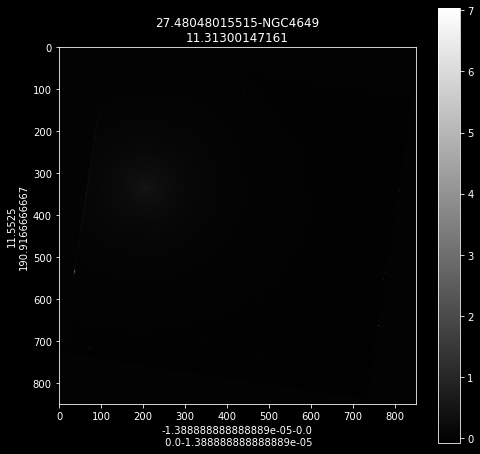

In [36]:
figure=plt.figure(figsize=(8,8))
plt.imshow(Messier87_IMG_Data,cmap="gray")
plt.xlabel(f"{Messier87_Document[1].header['CD1_1']}-{Messier87_Document[1].header['CD1_2']}\n {Messier87_Document[1].header['CD2_1']}-{Messier87_Document[1].header['CD2_2']}")
plt.ylabel(f"{Messier87_Document[0].header['DEC_TARG']}\n{Messier87_Document[0].header[' RA_TARG']}")
plt.title(f"{Messier87_Document[0].header['RA_SUN']}-{Messier87_Document[0].header['targname']}\n{Messier87_Document[0].header['DEC_SUN']}")
plt.colorbar()
plt.show()

In [37]:
#FLATTEN FOR PLOT
Messier87_Flatten=Messier87_IMG_Data.flatten()


In [38]:
print("shape:",Messier87_Flatten.shape)
print("size:",Messier87_Flatten.size)
print("type:",type(Messier87_Flatten))

shape: (722500,)
size: 722500
type: <class 'numpy.ndarray'>


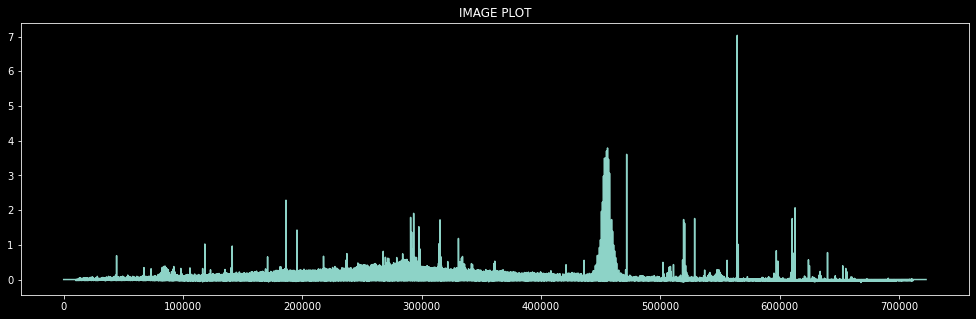

In [39]:
figure=plt.figure(figsize=(17,5))
plt.plot(Messier87_Flatten)
plt.title("IMAGE PLOT")
plt.show()

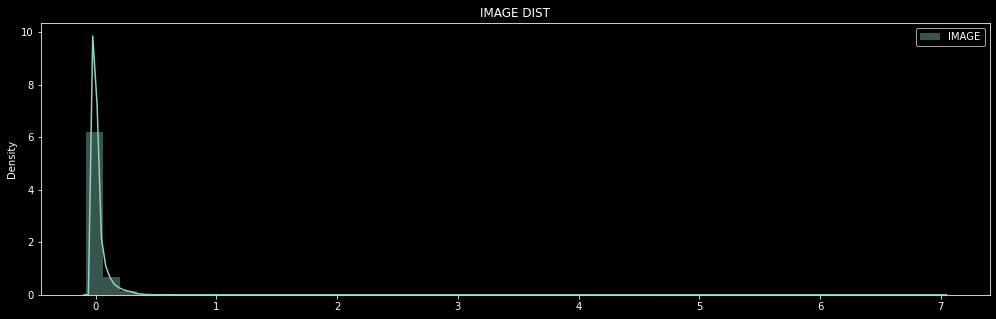

In [40]:
figure=plt.figure(figsize=(17,5))
sns.distplot(Messier87_Flatten,label="IMAGE")
plt.title("IMAGE DIST")
plt.legend(prop=dict(size=10))
plt.show()

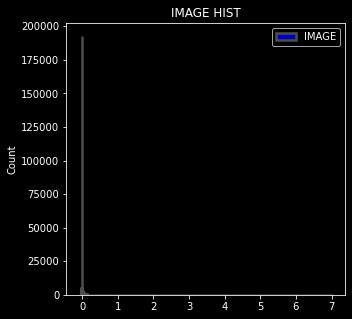

In [41]:
figure=plt.figure(figsize=(5,5))
sns.histplot(Messier87_Flatten,multiple="stack",edgecolor=".3",linewidth=2.5,color="blue",label="IMAGE")
plt.title("IMAGE HIST")
plt.legend(prop=dict(size=10))# we can change the font-size property of legend by using the prop argument.
plt.show()

C:\Users\91810\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


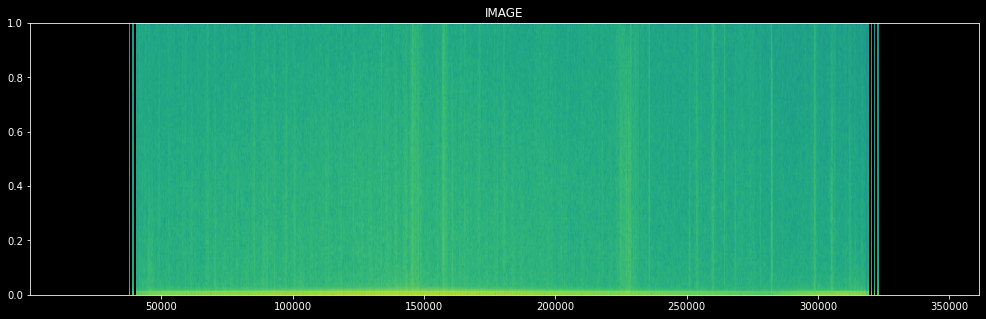

In [42]:
figure=plt.figure(figsize=(17,5))
powerSpectrum_4,frequenciesFound_4,time_4,imageAxis_4=plt.specgram(Messier87_Flatten)
plt.title("IMAGE")
plt.show()

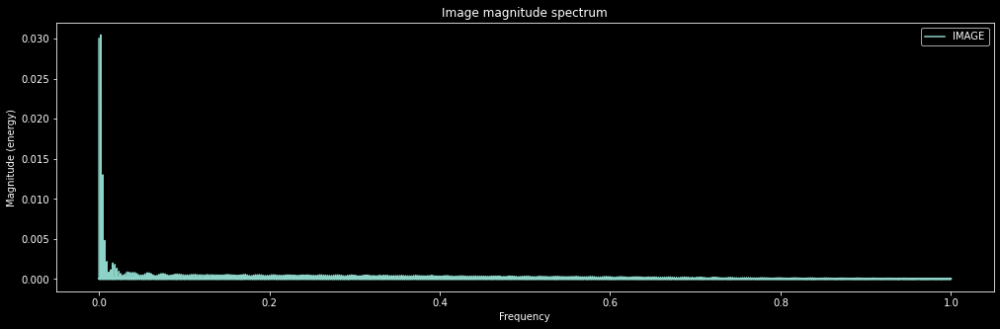

In [43]:
figure=plt.figure(figsize=(17,5))
plt.magnitude_spectrum(Messier87_Flatten,label="IMAGE")
plt.title("Image magnitude spectrum")
plt.legend(prop=dict(size=10))
plt.show()

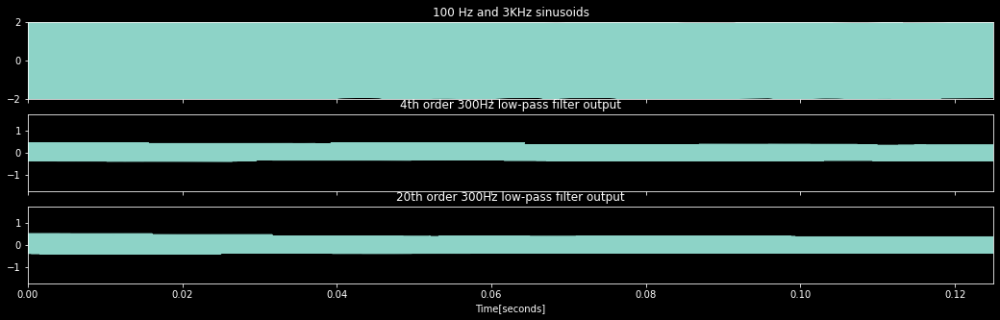

In [44]:
Fs=48000
Fc=300
fig,(ax1,ax2,ax3)=plt.subplots(3,1,figsize=(18,5),sharex=True)
t=Messier87_Flatten
#generate signal with 100 and 3khz components
sig=np.sin(2*np.pi*100*t)+np.sin(2*np.pi*3000*t)
ax1.plot(t,sig)
ax1.set_title('100 Hz and 3KHz sinusoids')
ax1.axis([0,0.125,-2,2])

#apply the 300Hz low pass filter(4th order) on the signal
sos=signal.butter(4,Fc,'lp',fs=Fs,output='sos')
filtsig=signal.sosfilt(sos,sig)
ax2.plot(t,filtsig)
ax2.set_title('4th order 300Hz low-pass filter output')
ax2.axis([0,0.125,-1.75,1.75])

#apply the 300Hz low pass filter(20th order) on the signal
sos=signal.butter(20,Fc,'lp',fs=Fs,output='sos')
filtsig=signal.sosfilt(sos,sig)
ax3.plot(t,filtsig)
ax3.set_title('20th order 300Hz low-pass filter output')
ax3.axis([0,0.125,-1.75,1.75])
ax3.set_xlabel('Time[seconds]')
#plt.tight_layout()
plt.show()

In [45]:
#getting CTX data
CTX_Data=Messier87_Document[3].data

In [46]:
print("shape:",CTX_Data.shape)
print("size:",CTX_Data.size)
print("type:",type(CTX_Data))

shape: (850, 850)
size: 722500
type: <class 'numpy.ndarray'>


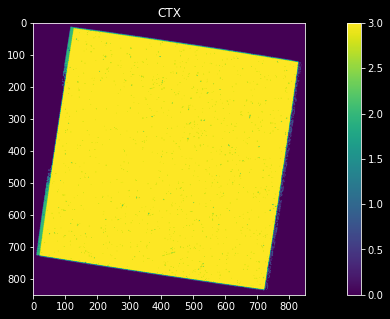

In [47]:
figure=plt.figure(figsize=(15,5))
plt.imshow(CTX_Data)
plt.title("CTX")
plt.colorbar()
plt.show()

In [48]:
#transpose example
CTX_Data_Transpose=CTX_Data.transpose(1,0)
CTX_Data_Transpose=CTX_Data_Transpose.astype("f")[...,np.newaxis]

In [49]:
print("shape:",CTX_Data_Transpose.shape)
print("size:",CTX_Data_Transpose.size)
print("type:",type(CTX_Data_Transpose))


shape: (850, 850, 1)
size: 722500
type: <class 'numpy.ndarray'>


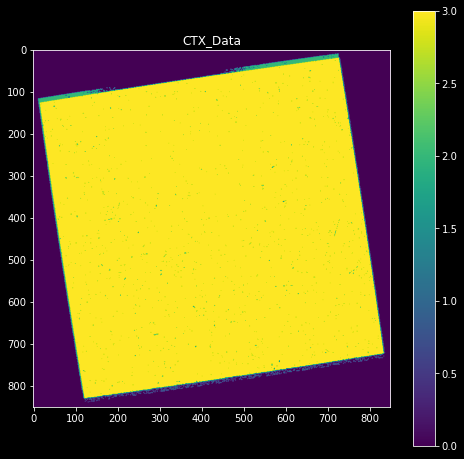

In [50]:
figure=plt.figure(figsize=(8,8))
plt.imshow(CTX_Data_Transpose)
plt.title("CTX_Data")
plt.colorbar()
plt.show()

In [51]:
#flatten for example
CTX_Data_Flatten=CTX_Data.flatten()

In [52]:
print("shape:",CTX_Data_Flatten.shape)
print("size:",CTX_Data_Flatten.size)
print("type:",type(CTX_Data_Flatten))

shape: (722500,)
size: 722500
type: <class 'numpy.ndarray'>


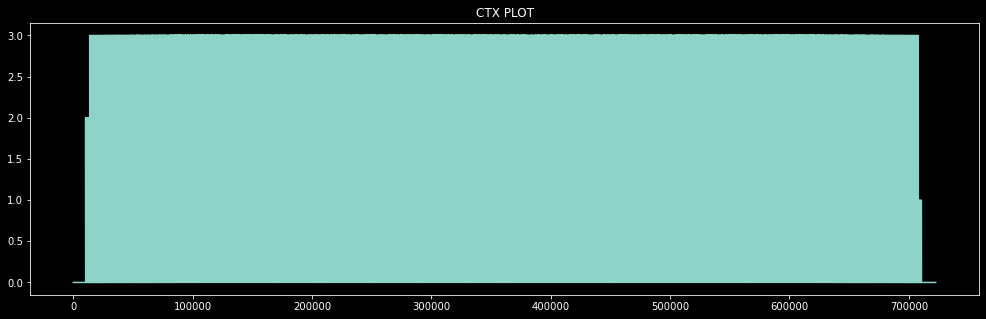

In [53]:
figure=plt.figure(figsize=(17,5))
plt.plot(CTX_Data_Flatten)
plt.title("CTX PLOT")
plt.show()

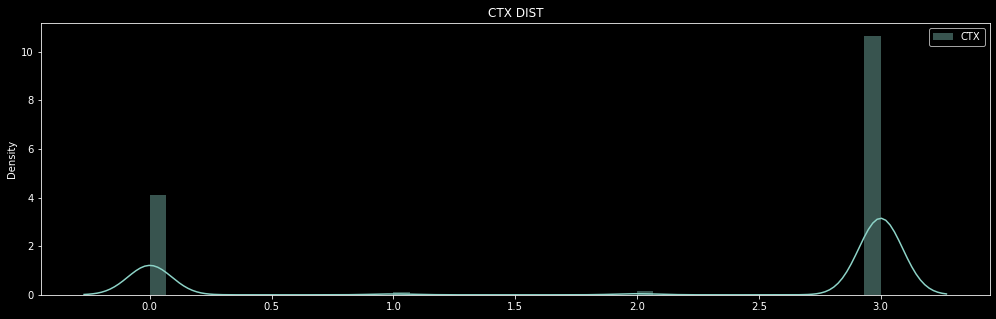

In [54]:
figure=plt.figure(figsize=(17,5))
sns.distplot(CTX_Data_Flatten,label="CTX")
plt.title("CTX DIST")
plt.legend(prop=dict(size=10))
plt.show()

C:\Users\91810\anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


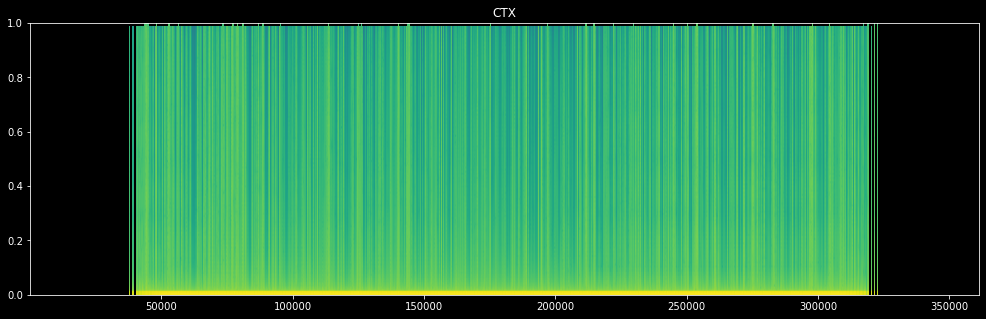

In [55]:
figure=plt.figure(figsize=(17,5))
powerSpectrum_4,frequenciesFound_4,time_4,imageAxis_4=plt.specgram(CTX_Data_Flatten)
plt.title("CTX")
plt.show()

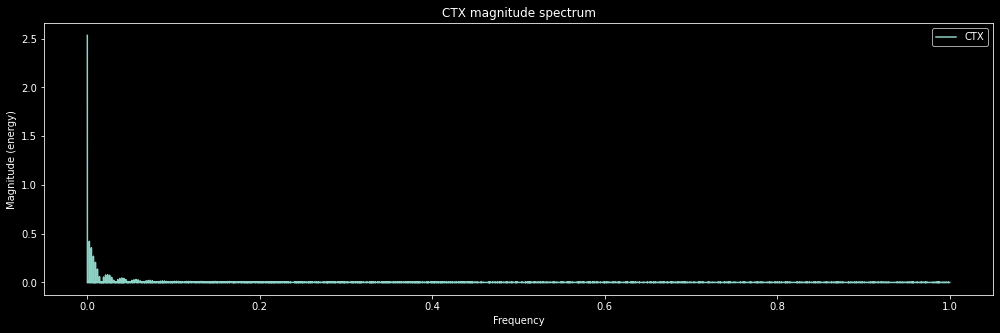

In [56]:
figure=plt.figure(figsize=(17,5))
plt.magnitude_spectrum(CTX_Data_Flatten,label="CTX")
plt.title("CTX magnitude spectrum")
plt.legend(prop=dict(size=10))
plt.show()

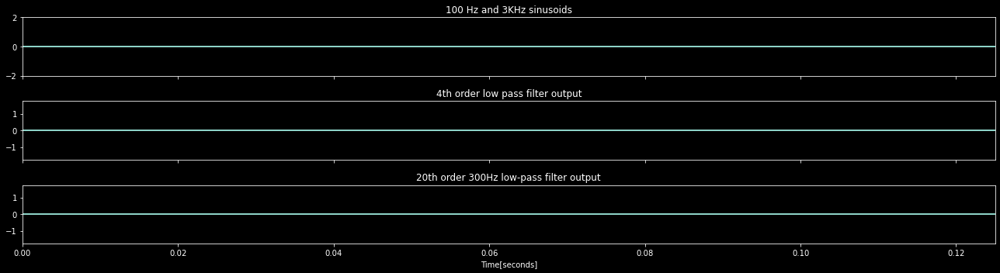

In [57]:
Fs=48000
Fc=300

fig,(ax1,ax2,ax3)=plt.subplots(3,1,figsize=(18,5),sharex=True)
t=CTX_Data_Flatten
sig=np.sin(2*np.pi*100*t)+np.sin(2*np.pi*3000*t)
ax1.plot(t,sig)
ax1.set_title('100 Hz and 3KHz sinusoids')
ax1.axis([0,0.125,-2,2])

sos=signal.butter(4,Fc,'lp',fs=Fs,output='sos')
filtsig=signal.sosfilt(sos,sig)
ax2.plot(t,filtsig)
ax2.set_title('4th order low pass filter output')
ax2.axis([0,0.125,-1.75,1.75])

sos=signal.butter(20,Fc,'lp',fs=Fs,output='sos')
filtsig=signal.sosfilt(sos,sig)
ax3.plot(t,filtsig)
ax3.set_title('20th order 300Hz low-pass filter output')
ax3.axis([0,0.125,-1.75,1.75])
ax3.set_xlabel('Time[seconds]')

plt.tight_layout()
plt.show()

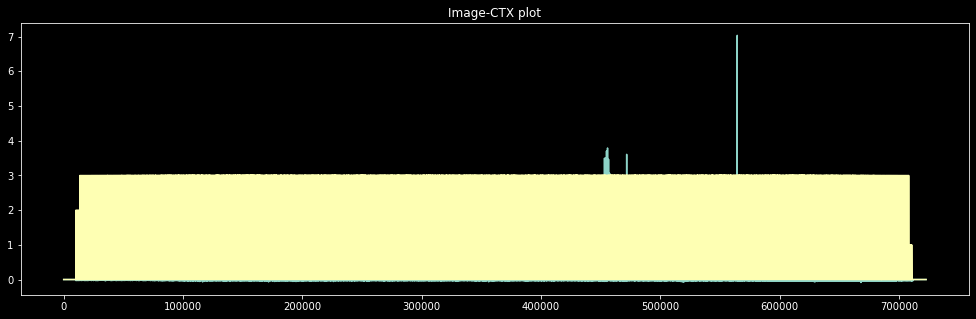

In [58]:
#analysis image and ctx
figure=plt.figure(figsize=(17,5))
plt.plot(Messier87_Flatten)
plt.plot(CTX_Data_Flatten)
plt.title("Image-CTX plot")

plt.show()

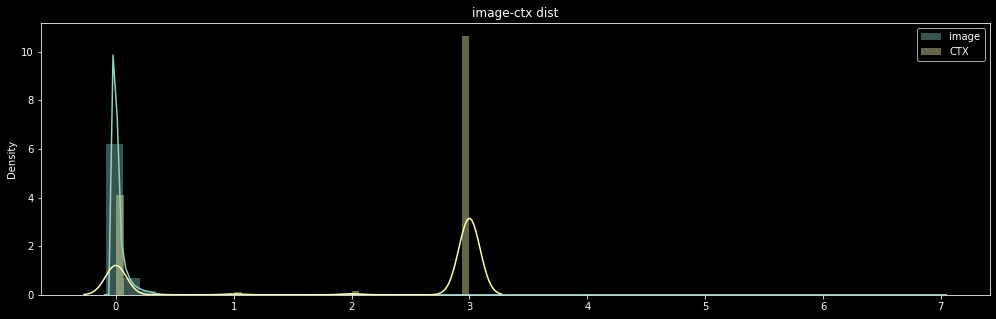

In [59]:
figure=plt.figure(figsize=(17,5))
sns.distplot(Messier87_Flatten,label="image")
sns.distplot(CTX_Data_Flatten,label="CTX")
plt.title("image-ctx dist")
plt.legend(prop=dict(size=10))
plt.show()

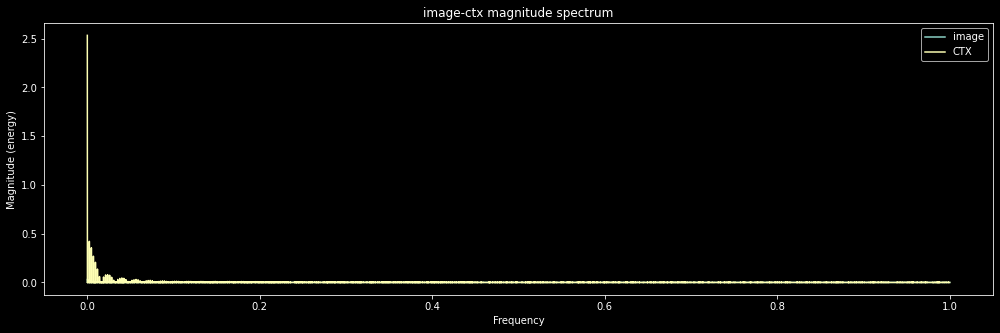

In [60]:
figure=plt.figure(figsize=(17,5))
plt.magnitude_spectrum(Messier87_Flatten,label="image")
plt.magnitude_spectrum(CTX_Data_Flatten,label="CTX")
plt.title("image-ctx magnitude spectrum")
plt.legend(prop=dict(size=10))
plt.show()

In [61]:
Example_Path_2=Messier_87_Fits_Series[4]
Messier87_Document_2=fits.open(Example_Path_2)

In [62]:
print("information\n")
print(Messier87_Document_2.info())

information

Filename: NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\ob5c08yjq_raw.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     207   ()      
  1  SCI           1 ImageHDU        99   (32, 32)   int16 (rescales to uint16)   
  2  ERR           1 ImageHDU        54   ()      
  3  DQ            1 ImageHDU        37   ()      
  4  PEAKUP        1 ImageHDU        97   (5, 1)   int32   
None


In [63]:
print("header ImageHDU:\n")
print(Messier87_Document_2[1].header)
print("---"*10)

header ImageHDU:

XTENSION= 'IMAGE   '           / extension type                                 BITPIX  =                   16 / bits per data value                            NAXIS   =                    2 / number of data axes                            NAXIS1  =                   32 / length of first data axis                      NAXIS2  =                   32 / length of second data axis                     PCOUNT  =                    0 / number of group parameters                     GCOUNT  =                    1 / number of groups                               INHERIT =                    T / inherit the primary header                     EXTNAME = 'SCI     '           / extension name                                 EXTVER  =                    1 / extension version number                       ROOTNAME= 'ob5c08yjq                         ' / rootname of the observation setEXPNAME = 'ob5c08yjq                ' / exposure identifier                     DATAMIN =             

In [64]:
print("partial of firts axis coordinate w.r.t x:\n")
print(Messier87_Document_2[1].header['CD1_1'])
print("---"*10)
print("partial of first axis coordinate w.r.t y:\n")
print(Messier87_Document_2[1].header['CD1_2'])
print("---"*10)
print("partial of second axis coordinate w.r.t x:\n")
print(Messier87_Document_2[1].header['CD2_1'])
print("---"*10)
print("partial of second axis coordinate y:\n")
print(Messier87_Document_2[1].header['CD2_2'])
print("---"*10)
print("RA of aperature reference position:\n")
print(Messier87_Document_2[1].header['RA_APER'])
print("---"*10)
print("Declination of aperature reference position:\n")
print(Messier87_Document_2[1].header['DEC_APER'])
print("---"*10)
print("position angle of reference aperature center:\n")
print(Messier87_Document_2[1].header['PA_APER'])
print("---"*10)
print("position angle of image y axis:\n")
print(Messier87_Document_2[1].header['ORIENTAT'])
print("---"*10)
print("angle between sun and v1 axis:\n")
print(Messier87_Document_2[1].header['SUNANGLE'])
print("---"*10)
print("angle between moon and v1 axis:\n")
print(Messier87_Document_2[1].header['MOONANGL'])
print("---"*10)
print("altitude of the sun above Earth's limb:\n")
print(Messier87_Document_2[1].header['SUN_ALT'])
print("---"*10)
print("UT date of start of observation :\n")
print(Messier87_Document_2[1].header['DATE-OBS'])
print("---"*10)
print("exposure end time:\n")
print(Messier87_Document_2[1].header['EXPEND'])
print("---"*10)
print("average of the dark values subtracted:\n")
print(Messier87_Document_2[1].header['MEANDARK'])
print("---"*10)
print("average of all bias levels subtracted:\n")
print(Messier87_Document_2[1].header['MEANBLEV'])
print("---"*10)
print("slit wheel absolute position:\n")
print(Messier87_Document_2[1].header['OSWABSP'])
print("---"*10)

partial of firts axis coordinate w.r.t x:

7.89649e-06
------------------------------
partial of first axis coordinate w.r.t y:

1.16856e-05
------------------------------
partial of second axis coordinate w.r.t x:

1.16824e-05
------------------------------
partial of second axis coordinate y:

-7.89867e-06
------------------------------
RA of aperature reference position:

190.9166670833
------------------------------
Declination of aperature reference position:

11.55228888889
------------------------------
position angle of reference aperature center:

123.6503082031
------------------------------
position angle of image y axis:

124.056
------------------------------
angle between sun and v1 axis:

159.083557
------------------------------
angle between moon and v1 axis:

142.109848
------------------------------
altitude of the sun above Earth's limb:

-11.094092
------------------------------
UT date of start of observation :

2010-04-10
------------------------------
exposure e

In [65]:
print("HEADER PrimaryHDU:\n")
print(Messier87_Document_2[0].header)
print("---"*10)

HEADER PrimaryHDU:

SIMPLE  =                    T / data conform to FITS standard                  BITPIX  =                   16 / bits per data value                            NAXIS   =                    0 / number of data axes                            EXTEND  =                    T / File may contain standard extensions           NEXTEND =                    4 / Number of standard extensions                  GROUPS  =                    F / image is in group format                       DATE    = '2019-10-21'         / date this file was written (yyyy-mm-dd)        FILENAME= 'ob5c08yjq_raw.fits                     ' / name of file              FILETYPE= 'SCI      '          / type of data found in data file                                                                                                TELESCOP= 'HST'                / telescope used to acquire data                 INSTRUME= 'STIS  '             / identifier for instrument used to acquire data EQUINOX =           

In [66]:
Messier87_IMG_Data_2=Messier87_Document_2[1].data

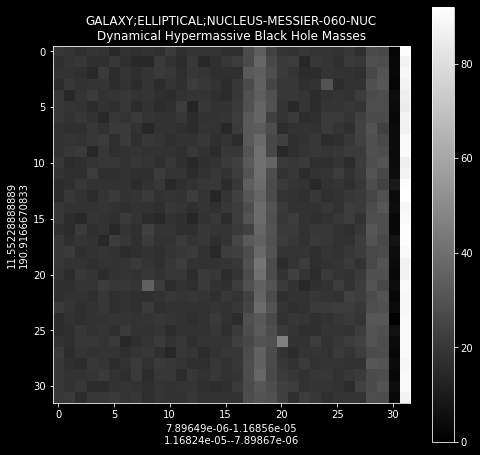

In [67]:
figure=plt.figure(figsize=(8,8))
plt.imshow(Messier87_IMG_Data_2,cmap="gray")
plt.xlabel(f"{Messier87_Document_2[1].header['CD1_1']}-{Messier87_Document_2[1].header['CD1_2']}\n{Messier87_Document_2[1].header['CD2_1']}-{Messier87_Document_2[1].header['CD2_2']}")
plt.ylabel(f"{Messier87_Document_2[0].header['DEC_TARG']}\n{Messier87_Document_2[0].header['RA_TARG']}")
plt.title(f"{Messier87_Document_2[0].header['TARDESCR']}-{Messier87_Document_2[0].header['targname']}\n{Messier87_Document_2[0].header['PROPTTL1']}")
plt.colorbar()
plt.show()

In [68]:
print("shape:",Messier87_IMG_Data_2.shape)
print("size:",Messier87_IMG_Data_2.size)
print("type:",type(Messier87_IMG_Data_2))

shape: (32, 32)
size: 1024
type: <class 'numpy.ndarray'>


In [69]:
Messier87_flatten_2=Messier87_IMG_Data_2.flatten()


In [70]:
print("shape:",Messier87_flatten_2.shape)
print("size:",Messier87_flatten_2.size)
print("type:",type(Messier87_flatten_2))

shape: (1024,)
size: 1024
type: <class 'numpy.ndarray'>


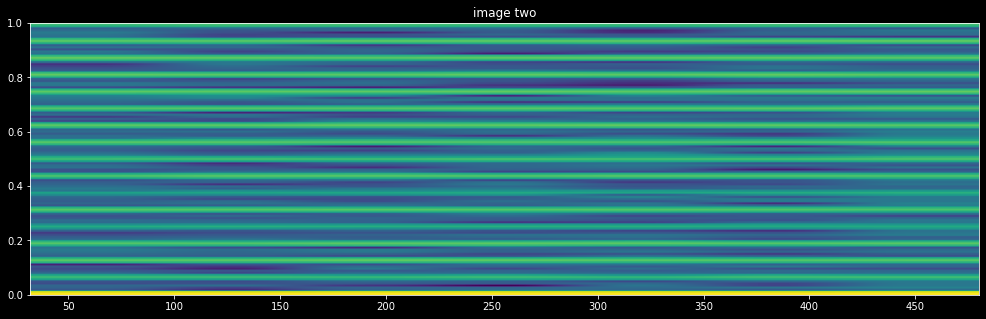

In [71]:
figure=plt.figure(figsize=(17,5))
powerSpectrum_4,frequenciesFound_4,time_4,imageAxis_4=plt.specgram(Messier87_flatten_2)
plt.title("image two")
plt.show()

Text(0.5, 0, '-1.388888888888889e-05-0.0\n0.0-1.388888888888889e-05')

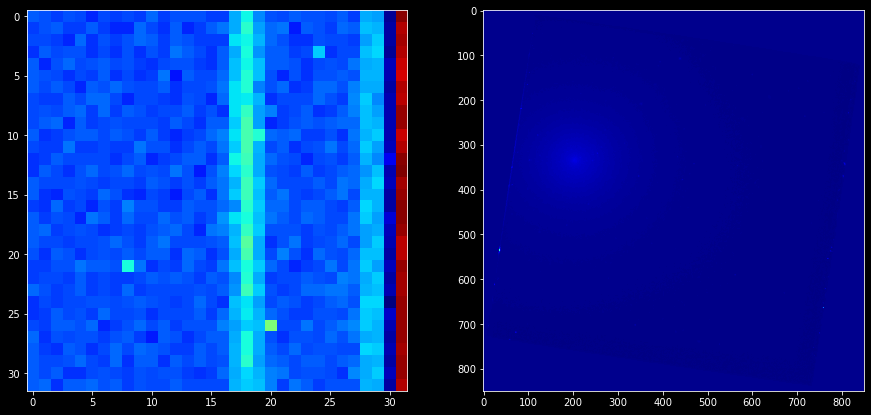

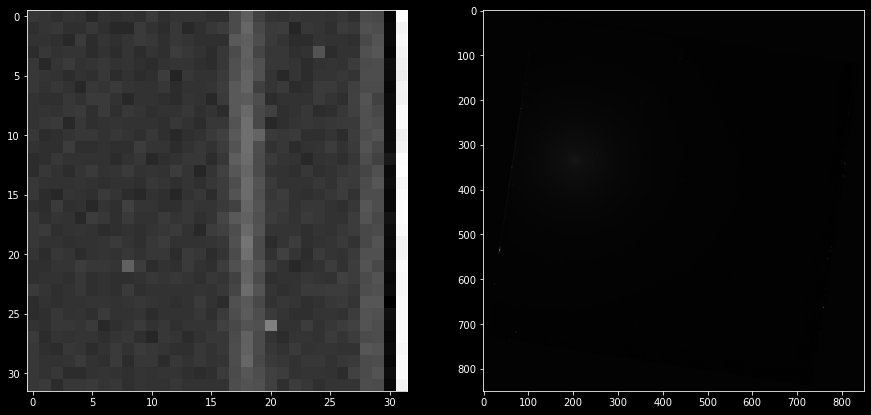

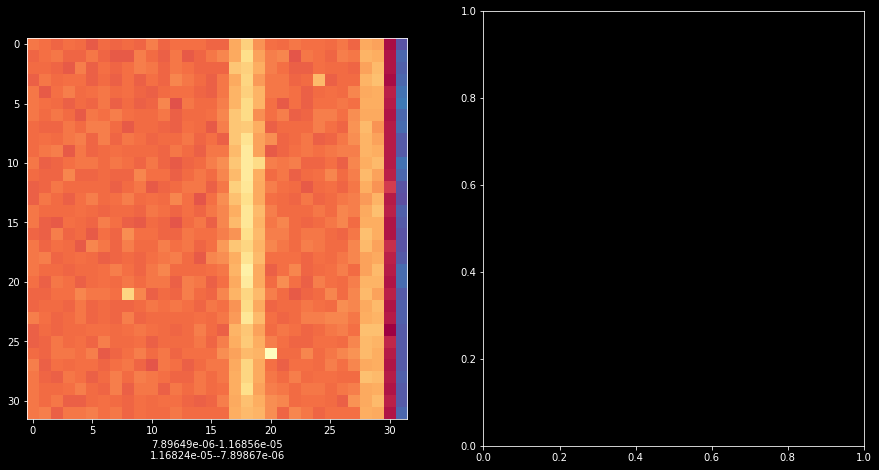

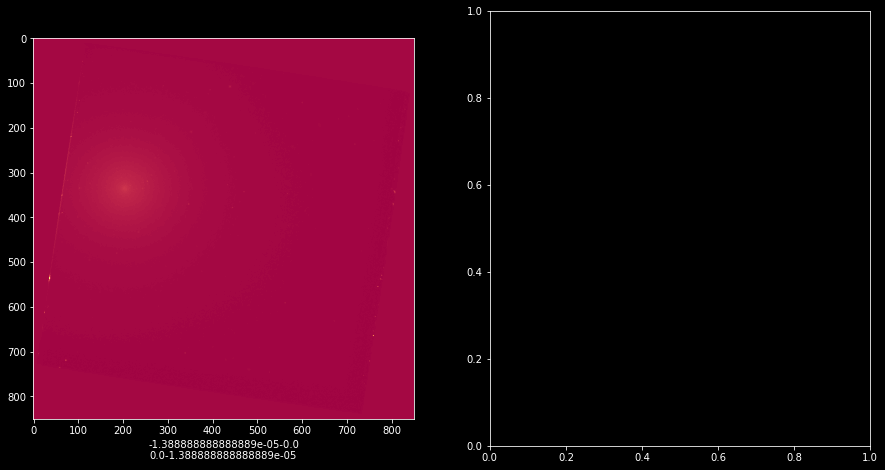

In [72]:
figure,axis=plt.subplots(1,2,figsize=(15,8))
axis[0].imshow(Messier87_IMG_Data_2,cmap="jet")
axis[1].imshow(Messier87_IMG_Data,cmap="jet")

figure,axis=plt.subplots(1,2,figsize=(15,8))
axis[0].imshow(Messier87_IMG_Data_2,cmap="gray")
axis[1].imshow(Messier87_IMG_Data,cmap="gray")

figure,axis=plt.subplots(1,2,figsize=(15,8))
axis[0].imshow(Messier87_IMG_Data_2,cmap="Spectral")
axis[0].set_xlabel(f"{Messier87_Document_2[1].header['CD1_1']}-{Messier87_Document_2[1].header['CD1_2']}\n{Messier87_Document_2[1].header['CD2_1']}-{Messier87_Document_2[1].header['CD2_2']}")

figure,axis=plt.subplots(1,2,figsize=(15,8))
axis[0].imshow(Messier87_IMG_Data,cmap="Spectral")
axis[0].set_xlabel(f"{Messier87_Document[1].header['CD1_1']}-{Messier87_Document[1].header['CD1_2']}\n{Messier87_Document[1].header['CD2_1']}-{Messier87_Document[1].header['CD2_2']}")


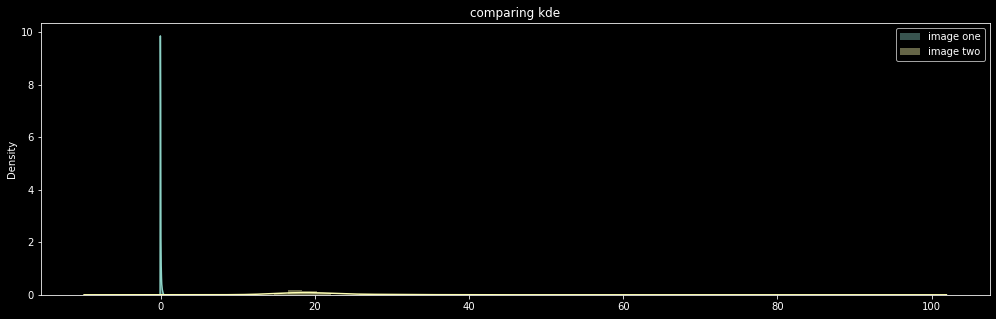

In [73]:
figure=plt.figure(figsize=(17,5))
sns.distplot(Messier87_Flatten,label="image one")
sns.distplot(Messier87_flatten_2,label="image two")
plt.title("comparing kde")
plt.legend(prop=dict(size=10))
plt.show()

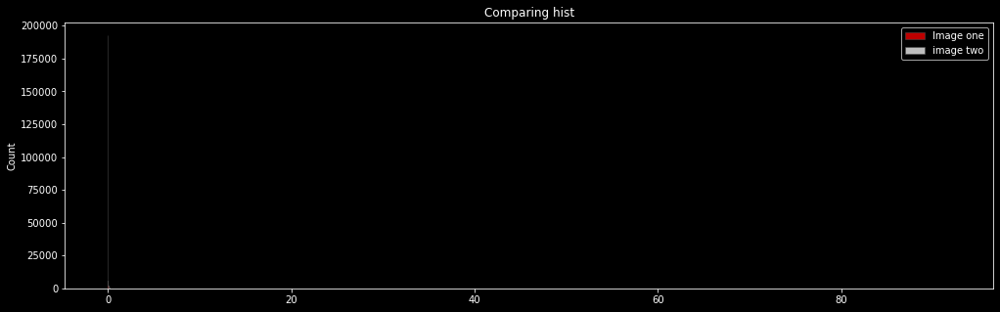

In [74]:
figure=plt.figure(figsize=(17,5))
sns.histplot(Messier87_Flatten,multiple="stack",edgecolor=".3",linewidth=.5,color="red",label="Image one")
sns.histplot(Messier87_flatten_2,multiple="stack",edgecolor=".3",linewidth=.5,color="white",label="image two")
plt.title("Comparing hist")
plt.legend(prop=dict(size=10))
plt.show()

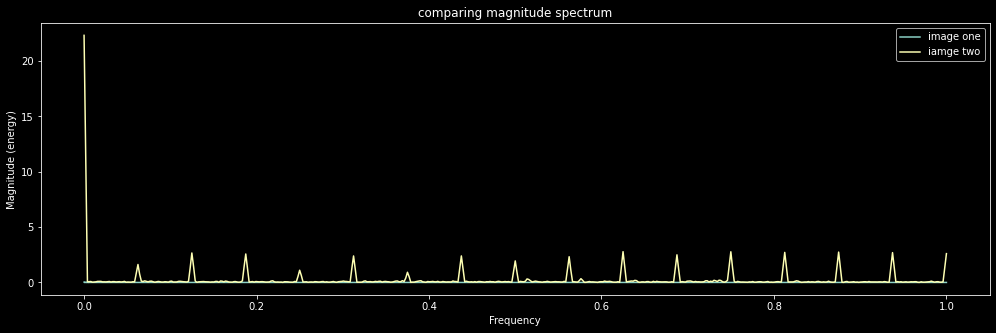

In [75]:
figure=plt.figure(figsize=(17,5))
plt.magnitude_spectrum(Messier87_Flatten,label="image one")
plt.magnitude_spectrum(Messier87_flatten_2,label="iamge two")
plt.title("comparing magnitude spectrum")
plt.legend(prop=dict(size=10))
plt.show()

In [76]:
#check the difference between mathematical operation of the 0 and 4 th tuple of the 
#Messier87 galaxy.

In [77]:
print("Partial Of First Axis Coordinate w.r.t. x / DIFFERENCE:\n")
print(Messier87_Document[1].header['CD1_1'] - Messier87_Document_2[1].header['CD1_1'])

Partial Of First Axis Coordinate w.r.t. x / DIFFERENCE:

-2.178537888888889e-05


In [78]:
print("Partial Of First Axis Coordinate w.r.t. y / DIFFERENCE:\n")
print(Messier87_Document[1].header['CD1_2'] - Messier87_Document_2[1].header['CD1_2'])

Partial Of First Axis Coordinate w.r.t. y / DIFFERENCE:

-1.16856e-05


In [79]:
print("Partial Of Second Axis Coordinate w.r.t. x / DIFFERENCE:\n")
print(Messier87_Document[1].header['CD2_1'] - Messier87_Document_2[1].header['CD2_1'])

Partial Of Second Axis Coordinate w.r.t. x / DIFFERENCE:

-1.16824e-05


In [80]:
print("Partial Of Second Axis Coordinate w.r.t. y / DIFFERENCE:\n")
print(Messier87_Document[1].header['CD2_2'] - Messier87_Document_2[1].header['CD2_2'])

Partial Of Second Axis Coordinate w.r.t. y / DIFFERENCE:

2.178755888888889e-05


In [81]:
# reading objects
Example_Path_1=Messier_87_Fits_Series[0]
Example_Path_2=Messier_87_Fits_Series[1]
Example_Path_3=Messier_87_Fits_Series[2]
Example_Path_4=Messier_87_Fits_Series[3]
Example_Path_5=Messier_87_Fits_Series[4]
Example_Path_6=Messier_87_Fits_Series[5]
Example_Path_7=Messier_87_Fits_Series[6]
Example_Path_8=Messier_87_Fits_Series[7]



Messier87_Document_1=fits.open(Example_Path_1)
Messier87_Document_2=fits.open(Example_Path_2)
Messier87_Document_3=fits.open(Example_Path_3)
Messier87_Document_4=fits.open(Example_Path_4)
Messier87_Document_5=fits.open(Example_Path_5)
Messier87_Document_6=fits.open(Example_Path_6)
Messier87_Document_7=fits.open(Example_Path_7)
Messier87_Document_8=fits.open(Example_Path_8)



In [82]:
print(Messier_87_Fits_Series[6])

NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\HST\x13c0201t\x13c0201t_c0f.fits


In [83]:
print("INFORMATIONS:\n")
print(Messier87_Document_7.info())

INFORMATIONS:

Filename: NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\HST\x13c0201t\x13c0201t_c0f.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     189   (512, 512)   float32   
  1  X13C0201T_CVT.C0H.TAB    1 TableHDU       144   1R x 18C   [D25.17, D25.17, E15.7, E15.7, E15.7, E15.7, E15.7, E15.7, E15.7, E15.7, A1, E15.7, I12, I12, D25.17, D25.17, A8, A8]   
None


In [84]:
print("INFORMATIONS:\n")
print(Messier87_Document_8.info())

INFORMATIONS:

Filename: NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\HST\x13c0201t\x13c0201t_c1f.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     190   (512, 512)   float32   
  1  X13C0201T_CVT.C1H.TAB    1 TableHDU       144   1R x 18C   [D25.17, D25.17, E15.7, E15.7, E15.7, E15.7, E15.7, E15.7, E15.7, E15.7, A1, E15.7, I12, I12, D25.17, D25.17, A8, A8]   
None


In [85]:
Messier87_Document_7[1].columns

ColDefs(
    name = 'CRVAL1'; format = 'D25.17'; disp = 'G25.16'; start = 1
    name = 'CRVAL2'; format = 'D25.17'; disp = 'G25.16'; start = 27
    name = 'CRPIX1'; format = 'E15.7'; disp = 'G15.7'; start = 53
    name = 'CRPIX2'; format = 'E15.7'; disp = 'G15.7'; start = 69
    name = 'CD1_1'; format = 'E15.7'; disp = 'G15.7'; start = 85
    name = 'CD1_2'; format = 'E15.7'; disp = 'G15.7'; start = 101
    name = 'CD2_1'; format = 'E15.7'; disp = 'G15.7'; start = 117
    name = 'CD2_2'; format = 'E15.7'; disp = 'G15.7'; start = 133
    name = 'DATAMIN'; format = 'E15.7'; disp = 'G15.7'; start = 149
    name = 'DATAMAX'; format = 'E15.7'; disp = 'G15.7'; start = 165
    name = 'MIR_REVR'; format = 'A1'; unit = 'LOGICAL-'; disp = 'A1'; start = 181
    name = 'ORIENTAT'; format = 'E15.7'; disp = 'G15.7'; start = 183
    name = 'FILLCNT'; format = 'I12'; disp = 'I11'; start = 199
    name = 'ERRCNT'; format = 'I12'; disp = 'I11'; start = 212
    name = 'FPKTTIME'; format = 'D25.17'; disp 

In [86]:
Messier87_Document_8[1].columns

ColDefs(
    name = 'CRVAL1'; format = 'D25.17'; disp = 'G25.16'; start = 1
    name = 'CRVAL2'; format = 'D25.17'; disp = 'G25.16'; start = 27
    name = 'CRPIX1'; format = 'E15.7'; disp = 'G15.7'; start = 53
    name = 'CRPIX2'; format = 'E15.7'; disp = 'G15.7'; start = 69
    name = 'CD1_1'; format = 'E15.7'; disp = 'G15.7'; start = 85
    name = 'CD1_2'; format = 'E15.7'; disp = 'G15.7'; start = 101
    name = 'CD2_1'; format = 'E15.7'; disp = 'G15.7'; start = 117
    name = 'CD2_2'; format = 'E15.7'; disp = 'G15.7'; start = 133
    name = 'DATAMIN'; format = 'E15.7'; disp = 'G15.7'; start = 149
    name = 'DATAMAX'; format = 'E15.7'; disp = 'G15.7'; start = 165
    name = 'MIR_REVR'; format = 'A1'; unit = 'LOGICAL-'; disp = 'A1'; start = 181
    name = 'ORIENTAT'; format = 'E15.7'; disp = 'G15.7'; start = 183
    name = 'FILLCNT'; format = 'I12'; disp = 'I11'; start = 199
    name = 'ERRCNT'; format = 'I12'; disp = 'I11'; start = 212
    name = 'FPKTTIME'; format = 'D25.17'; disp 

In [87]:
Messier87_Document_7[1].columns.info()

name:
    ['CRVAL1', 'CRVAL2', 'CRPIX1', 'CRPIX2', 'CD1_1', 'CD1_2', 'CD2_1', 'CD2_2', 'DATAMIN', 'DATAMAX', 'MIR_REVR', 'ORIENTAT', 'FILLCNT', 'ERRCNT', 'FPKTTIME', 'LPKTTIME', 'CTYPE1', 'CTYPE2']
format:
    ['D25.17', 'D25.17', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'A1', 'E15.7', 'I12', 'I12', 'D25.17', 'D25.17', 'A8', 'A8']
unit:
    ['', '', '', '', '', '', '', '', '', '', 'LOGICAL-', '', '', '', '', '', 'CHARACTER*8', 'CHARACTER*8']
null:
    ['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
bscale:
    ['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
bzero:
    ['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
disp:
    ['G25.16', 'G25.16', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'A1', 'G15.7', 'I11', 'I11', 'G25.16', 'G25.16', 'A8', 'A8']
start:
    [1, 27, 53, 69, 85, 101, 117, 133, 149, 165, 181, 183, 199, 212, 225, 251, 277, 286]
dim:
    ['

In [88]:
Messier87_Document_8[1].columns.info()

name:
    ['CRVAL1', 'CRVAL2', 'CRPIX1', 'CRPIX2', 'CD1_1', 'CD1_2', 'CD2_1', 'CD2_2', 'DATAMIN', 'DATAMAX', 'MIR_REVR', 'ORIENTAT', 'FILLCNT', 'ERRCNT', 'FPKTTIME', 'LPKTTIME', 'CTYPE1', 'CTYPE2']
format:
    ['D25.17', 'D25.17', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'E15.7', 'A1', 'E15.7', 'I12', 'I12', 'D25.17', 'D25.17', 'A8', 'A8']
unit:
    ['', '', '', '', '', '', '', '', '', '', 'LOGICAL-', '', '', '', '', '', 'CHARACTER*8', 'CHARACTER*8']
null:
    ['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
bscale:
    ['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
bzero:
    ['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
disp:
    ['G25.16', 'G25.16', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'G15.7', 'A1', 'G15.7', 'I11', 'I11', 'G25.16', 'G25.16', 'A8', 'A8']
start:
    [1, 27, 53, 69, 85, 101, 117, 133, 149, 165, 181, 183, 199, 212, 225, 251, 277, 286]
dim:
    ['

In [89]:
Messier87_Document_7[1].columns.names

['CRVAL1',
 'CRVAL2',
 'CRPIX1',
 'CRPIX2',
 'CD1_1',
 'CD1_2',
 'CD2_1',
 'CD2_2',
 'DATAMIN',
 'DATAMAX',
 'MIR_REVR',
 'ORIENTAT',
 'FILLCNT',
 'ERRCNT',
 'FPKTTIME',
 'LPKTTIME',
 'CTYPE1',
 'CTYPE2']

In [90]:
Messier87_Document_8[1].columns.names

['CRVAL1',
 'CRVAL2',
 'CRPIX1',
 'CRPIX2',
 'CD1_1',
 'CD1_2',
 'CD2_1',
 'CD2_2',
 'DATAMIN',
 'DATAMAX',
 'MIR_REVR',
 'ORIENTAT',
 'FILLCNT',
 'ERRCNT',
 'FPKTTIME',
 'LPKTTIME',
 'CTYPE1',
 'CTYPE2']

In [91]:
DATA_One=Messier87_Document_7[1].data
DATA_Two=Messier87_Document_8[1].data

In [92]:
print(DATA_One['CRVAL1'])
print("---"*10)
print(DATA_Two['CRVAL1'])
print("----"*20)
print(DATA_One['CRPIX1'])
print("---"*10)
print(DATA_Two['CRPIX1'])
print("----"*20)
print(DATA_One['CD1_1'])
print("---"*10)
print(DATA_Two['CD1_1'])
print("----"*20)
print(DATA_One['CD2_1'])
print("---"*10)
print(DATA_Two['CD2_1'])
print("----"*20)
print(DATA_One['ORIENTAT'])
print("---"*10)
print(DATA_Two['ORIENTAT'])

[190.91491667]
------------------------------
[190.91491667]
--------------------------------------------------------------------------------
[256.]
------------------------------
[256.]
--------------------------------------------------------------------------------
[-8.2623092e-07]
------------------------------
[-8.2623092e-07]
--------------------------------------------------------------------------------
[-5.6229551e-06]
------------------------------
[-5.6229551e-06]
--------------------------------------------------------------------------------
[-81.640839]
------------------------------
[-81.640839]


In [93]:
IMG_7=Messier87_Document_7[0].data
IMG_8=Messier87_Document_8[0].data

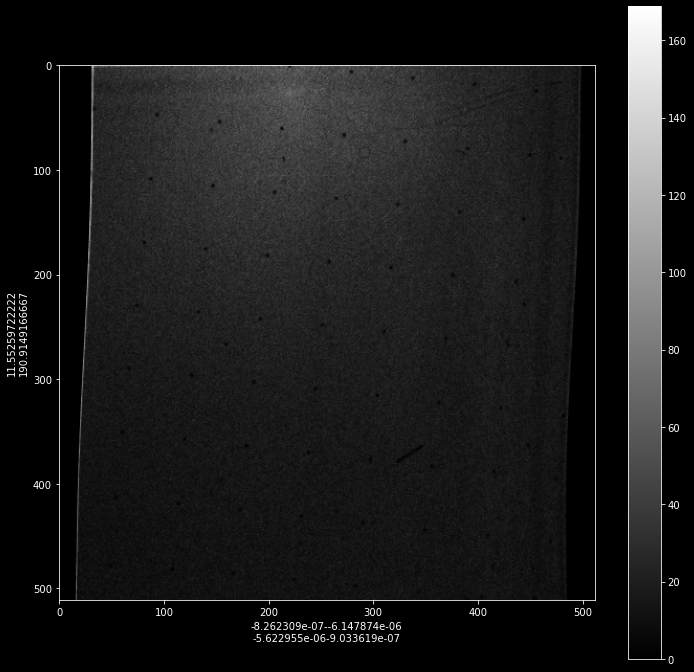

In [94]:
figure=plt.figure(figsize=(12,12))
plt.imshow(IMG_7,cmap="gray")
plt.xlabel(f"{Messier87_Document_7[0].header['CD1_1']}-{Messier87_Document_7[0].header['CD1_2']}\n{Messier87_Document_7[0].header['CD2_1']}-{Messier87_Document_7[0].header['CD2_2']}")
plt.ylabel(f"{Messier87_Document_7[0].header['DEC_TARG']}\n{Messier87_Document_7[0].header['RA_TARG']}")
plt.colorbar()
plt.show()

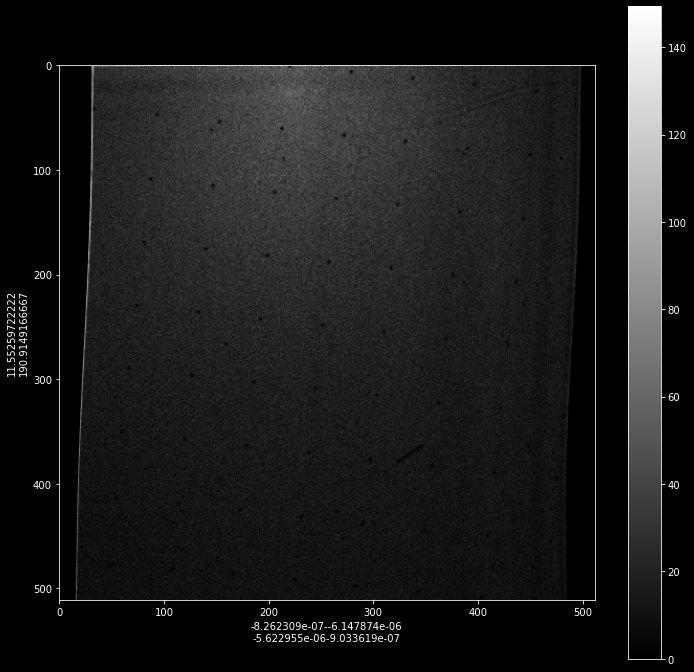

In [95]:
figure=plt.figure(figsize=(12,12))
plt.imshow(IMG_8,cmap="gray")
plt.xlabel(f"{Messier87_Document_8[0].header['CD1_1']}-{Messier87_Document_8[0].header['CD1_2']}\n{Messier87_Document_8[0].header['CD2_1']}-{Messier87_Document_8[0].header['CD2_2']}")
plt.ylabel(f"{Messier87_Document_8[0].header['DEC_TARG']}\n{Messier87_Document_8[0].header['RA_TARG']}")
plt.colorbar()
plt.show()

In [96]:
print(Messier87_Document_4.info())

Filename: NEAR THE BLACK HOLE\MESSIER87\HST-OPTICAL\ob5c07ueq_raw.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     207   ()      
  1  SCI           1 ImageHDU        99   (32, 32)   int16 (rescales to uint16)   
  2  ERR           1 ImageHDU        54   ()      
  3  DQ            1 ImageHDU        37   ()      
  4  PEAKUP        1 ImageHDU        97   (5, 1)   int32   
None


In [97]:
IMG_4_1=Messier87_Document_4[1].data
IMG_4_2=Messier87_Document_4[2].data
IMG_4_3=Messier87_Document_4[3].data

TypeError: Image data of dtype object cannot be converted to float

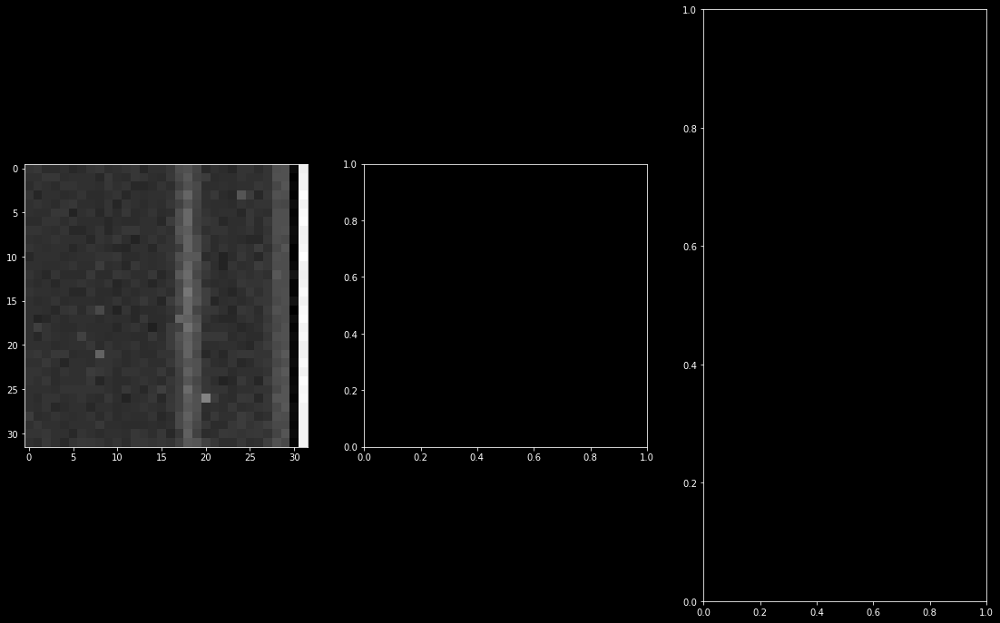

In [99]:
figure,axis=plt.subplots(1,3,figsize=(19,12))
axis[0].imshow(IMG_4_1,cmap="gray")
axis[1].imshow(IMG_4_2,cmap="gray")
axis[2].imshow(IMG_4_3,cmap="gray")

In [100]:
#object images
IMG_1=Messier87_Document_1[1].data
IMG_2=Messier87_Document_2[1].data
IMG_3=Messier87_Document_3[1].data
IMG_4=Messier87_Document_4[1].data
IMG_5=Messier87_Document_5[1].data
IMG_6=Messier87_Document_6[1].data


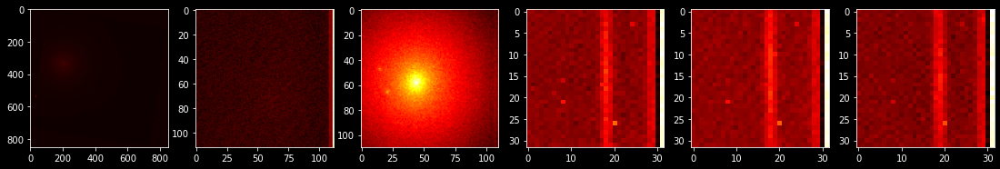

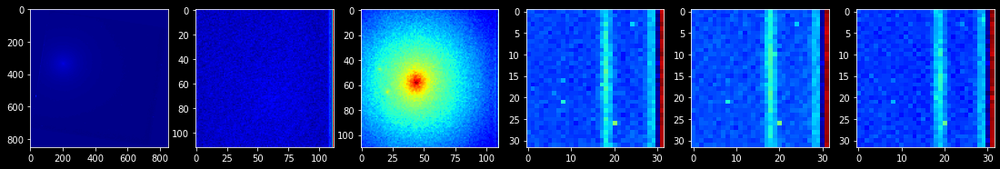

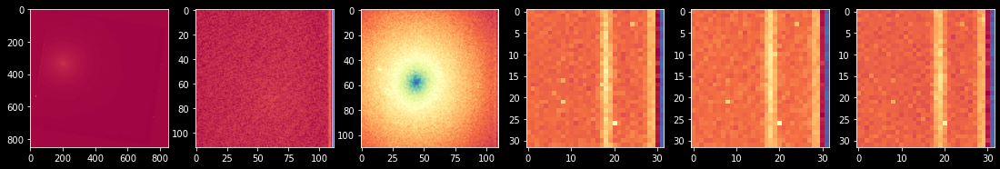

In [101]:
figure,axis=plt.subplots(1,6,figsize=(19,12))
axis[0].imshow(IMG_1,cmap="hot")
axis[1].imshow(IMG_2,cmap="hot")
axis[2].imshow(IMG_3,cmap="hot")
axis[3].imshow(IMG_4,cmap="hot")
axis[4].imshow(IMG_5,cmap="hot")
axis[5].imshow(IMG_6,cmap="hot")

figure,axis=plt.subplots(1,6,figsize=(19,12))
axis[0].imshow(IMG_1,cmap="jet")
axis[1].imshow(IMG_2,cmap="jet")
axis[2].imshow(IMG_3,cmap="jet")
axis[3].imshow(IMG_4,cmap="jet")
axis[4].imshow(IMG_5,cmap="jet")
axis[5].imshow(IMG_6,cmap="jet")

#made this same with spectral and gray and normal
figure,axis=plt.subplots(1,6,figsize=(19,12))
axis[0].imshow(IMG_1,cmap="Spectral")
axis[1].imshow(IMG_2,cmap="Spectral")
axis[2].imshow(IMG_3,cmap="Spectral")
axis[3].imshow(IMG_4,cmap="Spectral")
axis[4].imshow(IMG_5,cmap="Spectral")
axis[5].imshow(IMG_6,cmap="Spectral")

In [102]:
IMG_1_F=IMG_1.flatten()
IMG_2_F=IMG_2.flatten()
IMG_3_F=IMG_3.flatten()
IMG_4_F=IMG_4.flatten()
IMG_5_F=IMG_5.flatten()
IMG_6_F=IMG_6.flatten()

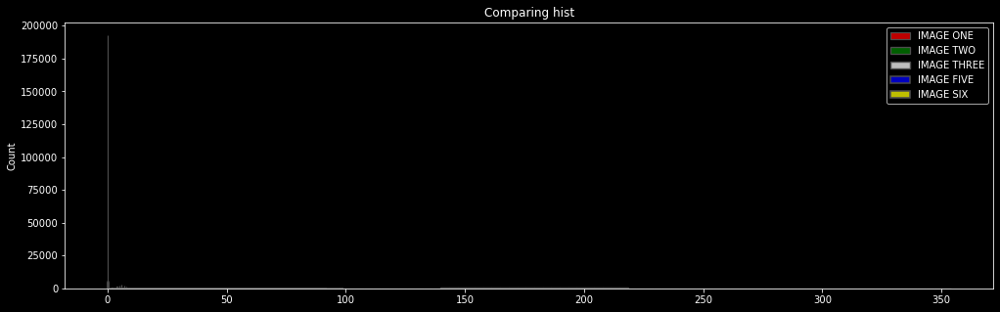

In [103]:
figure=plt.figure(figsize=(17,5))
sns.histplot(IMG_1_F,multiple="stack",edgecolor=".3",linewidth=1.2,color="red",label="IMAGE ONE")
sns.histplot(IMG_2_F,multiple="stack",edgecolor=".3",linewidth=1.3,color="green",label="IMAGE TWO")
sns.histplot(IMG_3_F,multiple="stack",edgecolor=".3",linewidth=1.4,color="white",label="IMAGE THREE")
#sns.histplot(IMG_4_F,multiple="stack",edgecolor=".3",linewidth=.5,color="yellow",label="image four")
sns.histplot(IMG_5_F,multiple="stack",edgecolor=".3",linewidth=1.5,color="blue",label="IMAGE FIVE")
sns.histplot(IMG_6_F,multiple="stack",edgecolor=".3",linewidth=1.6,color="yellow",label="IMAGE SIX")
plt.title("Comparing hist")
plt.legend(prop=dict(size=10))
plt.show()

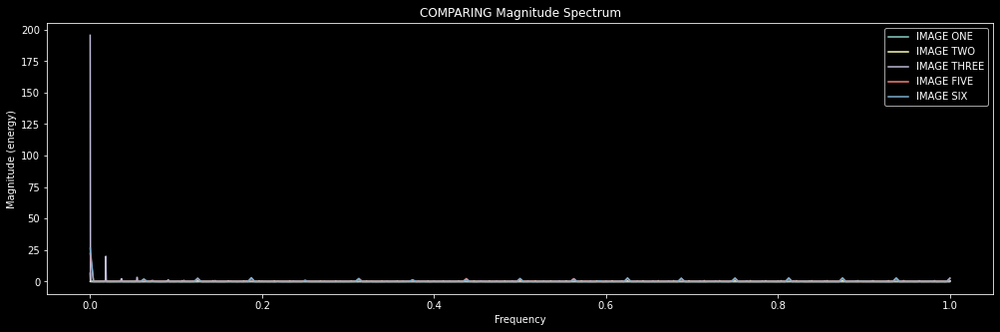

In [106]:
figure = plt.figure(figsize=(17,5))
plt.magnitude_spectrum(IMG_1_F,label="IMAGE ONE")
plt.magnitude_spectrum(IMG_2_F,label="IMAGE TWO")
plt.magnitude_spectrum(IMG_3_F,label="IMAGE THREE")
plt.magnitude_spectrum(IMG_5_F,label="IMAGE FIVE")
plt.magnitude_spectrum(IMG_6_F,label="IMAGE SIX")
plt.title("COMPARING Magnitude Spectrum")
plt.legend(prop=dict(size=10))
plt.show()

In [107]:
print("proposer's target name:\n")
print(Messier87_Document_1[0].header['targname'])
print("----"*10)
print(Messier87_Document_2[0].header['targname'])
print("----"*10)
print(Messier87_Document_3[0].header['targname'])
print("----"*10)
print(Messier87_Document_4[0].header['targname'])
print("----"*10)
print(Messier87_Document_5[0].header['targname'])
print("----"*10)
print(Messier87_Document_6[0].header['targname'])
print("----"*25)
print("Subtract dark image:\n")
print(Messier87_Document_1[0].header['DARKCORR'])
print("----"*10)
print(Messier87_Document_2[0].header['DARKCORR'])
print("----"*10)
print(Messier87_Document_3[0].header['DARKCORR'])
print("----"*10)
print(Messier87_Document_4[0].header['DARKCORR'])
print("----"*10)
print(Messier87_Document_5[0].header['DARKCORR'])
print("----"*10)
print(Messier87_Document_6[0].header['DARKCORR'])
print("----"*25)
print("general galaxy type:\n")
print(Messier87_Document_4[0].header['TARDESCR'])
print("----"*10)
print(Messier87_Document_2[0].header['TARDESCR'])
print("----"*10)
print(Messier87_Document_3[0].header['TARDESCR'])
print("----"*10)
print(Messier87_Document_5[0].header['TARDESCR'])
print("----"*10)
print(Messier87_Document_6[0].header['TARDESCR'])
print("----"*25)
print("type object:\n")
print(Messier87_Document_4[0].header['PROPTTL1'])
print("----"*10)
print(Messier87_Document_2[0].header['PROPTTL1'])
print("----"*10)
print(Messier87_Document_3[0].header['PROPTTL1'])
print("----"*10)
print(Messier87_Document_5[0].header['PROPTTL1'])
print("----"*10)
print(Messier87_Document_6[0].header['PROPTTL1'])
print("----"*25)
print("imaging or spectroscopic:\n")
print(Messier87_Document_4[0].header['OBSTYPE'])
print("----"*10)
print(Messier87_Document_2[0].header['OBSTYPE'])
print("----"*10)
print(Messier87_Document_3[0].header['OBSTYPE'])
print("----"*10)
print(Messier87_Document_5[0].header['OBSTYPE'])
print("----"*10)
print(Messier87_Document_6[0].header['OBSTYPE'])
print("----"*25)

proposer's target name:

NGC4649
----------------------------------------
NGC4649
----------------------------------------
NGC4649
----------------------------------------
MESSIER-060-NUC
----------------------------------------
MESSIER-060-NUC
----------------------------------------
MESSIER-060-NUC
----------------------------------------------------------------------------------------------------
Subtract dark image:

COMPLETE
----------------------------------------
OMIT
----------------------------------------
OMIT
----------------------------------------
OMIT
----------------------------------------
OMIT
----------------------------------------
OMIT
----------------------------------------------------------------------------------------------------
general galaxy type:

GALAXY;ELLIPTICAL;NUCLEUS
----------------------------------------
GALAXY;ELLIPTICAL
----------------------------------------
GALAXY;ELLIPTICAL
----------------------------------------
GALAXY;ELLIPTICAL;NUCLEUS
--

In [10]:
General_Fits_Path=Path("./NEAR THE BLACK HOLE")

In [11]:
FITS_Path=list(General_Fits_Path.glob(r"**/*.fits"))

In [12]:
Path_Series=pd.Series(FITS_Path,name="PATH").astype(str)

In [13]:
Path_Series

0      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_0598...
1      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\iby84001...
2      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\j8cw08n4...
3      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\HST\u6ei...
4      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\HST\u6ei...
                             ...                        
168    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\o4d30...
169    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...
170    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...
171    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...
172    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...
Name: PATH, Length: 173, dtype: object

In [14]:
New_Path_List=[]
New_Label_List=[]
for path_x,label_x in zip(Path_Series.values,Path_Series.values):
    Splitting_List=os.path.split(label_x)
    Label_Splitting=os.path.split(Splitting_List[0])
    Target_Label=os.path.split(Label_Splitting[0])
    
    New_Path_List.append(path_x)
    New_Label_List.append(Target_Label[1])

In [15]:
print("print first 10 label:\n")
print(New_Label_List[:10])
print("---"*10)
print("print first 10 path:\n")
print(New_Path_List[:10])

print first 10 label:

['3C273', '3C273', '3C273', 'HST', 'HST', 'HST', 'HST', 'CENTAURUS-A', 'CENTAURUS-A', 'CENTAURUS-A']
------------------------------
print first 10 path:

['NEAR THE BLACK HOLE\\3C273\\HST-OPTICAL\\hst_05980_01_wfpc2_total_pc_drz.fits', 'NEAR THE BLACK HOLE\\3C273\\HST-OPTICAL\\iby840010_drz.fits', 'NEAR THE BLACK HOLE\\3C273\\HST-OPTICAL\\j8cw08n4q_drz.fits', 'NEAR THE BLACK HOLE\\3C273\\HST-OPTICAL\\HST\\u6ei0401m\\u6ei0401m_c0f.fits', 'NEAR THE BLACK HOLE\\3C273\\HST-OPTICAL\\HST\\u6ei0401m\\u6ei0401m_c0m.fits', 'NEAR THE BLACK HOLE\\3C273\\HST-OPTICAL\\HST\\u6ei0401m\\u6ei0401m_c1f.fits', 'NEAR THE BLACK HOLE\\3C273\\HST-OPTICAL\\HST\\u6ei0401m\\u6ei0401m_c1m.fits', 'NEAR THE BLACK HOLE\\CENTAURUS-A\\HST-OPTICAL\\hst_06578_02_wfpc2_f336w_wf_drz.fits', 'NEAR THE BLACK HOLE\\CENTAURUS-A\\HST-OPTICAL\\hst_06789_a1_wfpc2_f555w_pc_drz.fits', 'NEAR THE BLACK HOLE\\CENTAURUS-A\\HST-OPTICAL\\hst_08597_52_wfpc2_f606w_pc_drz.fits']


In [16]:
print("LEN PATH LIST:",len(New_Path_List))
print("---"*10,"\n")
print("LEN LABEL LIST:",len(New_Label_List))

LEN PATH LIST: 173
------------------------------ 

LEN LABEL LIST: 173


In [17]:
Path_Series=pd.Series(New_Path_List,name="PATH").astype(str)
Label_Series=pd.Series(New_Label_List,name="BLACK_HOLES")

In [18]:
Path_Series

0      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_0598...
1      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\iby84001...
2      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\j8cw08n4...
3      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\HST\u6ei...
4      NEAR THE BLACK HOLE\3C273\HST-OPTICAL\HST\u6ei...
                             ...                        
168    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\o4d30...
169    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...
170    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...
171    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...
172    NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...
Name: PATH, Length: 173, dtype: object

In [19]:
print(Label_Series.unique())

['3C273' 'HST' 'CENTAURUS-A' 'H1821' 'IC1101' 'MARKARIAN' 'MESSIER106'
 'MESSIER60' 'MESSIER87' 'NGC4151' 'NGC5548' 'OJ287' 'SAGITTARIUS-A'
 'SOMBRERO']


TO DATAFRAME

In [19]:
Main_Data=pd.concat([Path_Series,Label_Series],axis=1)

In [20]:
Main_Data

,PATH,BLACK_HOLES
0,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_0598...,3C273
1,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\iby84001...,3C273
2,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\j8cw08n4...,3C273
3,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\HST\u6ei...,HST
4,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\HST\u6ei...,HST
...,...,...
168,NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\o4d30...,SOMBRERO
169,NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...,HST
170,NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...,HST
171,NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...,HST


In [21]:
Main_Data=Main_Data[Main_Data["BLACK_HOLES"]!="HST"]
Main_Data=Main_Data.reset_index(drop=True)

In [22]:
Main_Data

,PATH,BLACK_HOLES
0,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_0598...,3C273
1,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\iby84001...,3C273
2,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\j8cw08n4...,3C273
3,NEAR THE BLACK HOLE\CENTAURUS-A\HST-OPTICAL\hs...,CENTAURUS-A
4,NEAR THE BLACK HOLE\CENTAURUS-A\HST-OPTICAL\hs...,CENTAURUS-A
5,NEAR THE BLACK HOLE\CENTAURUS-A\HST-OPTICAL\hs...,CENTAURUS-A
6,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj01s4...,H1821
7,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj02oq...,H1821
8,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj03bt...,H1821
9,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rx...,H1821


In [21]:
#DATA ENGINEERING

print("Document_1:",Main_Data["BLACK_HOLES"][22])
print("Document_2:",Main_Data["BLACK_HOLES"][9])
print("Document_3:",Main_Data["BLACK_HOLES"][35])

Document_1: MESSIER60
Document_2: H1821
Document_3: NGC4151


In [22]:
Document_1=fits.open(Main_Data["PATH"][22])
Document_2=fits.open(Main_Data["PATH"][9])
Document_3=fits.open(Main_Data["PATH"][35])

In [39]:
print("INFORMATION \n")
print(Document_1.info())

INFORMATION 

Filename: NEAR THE BLACK HOLE\MESSIER60\HST-OPTICAL\o4ak06q4q_raw.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     207   ()      
  1  SCI           1 ImageHDU       105   (112, 112)   int16 (rescales to uint16)   
  2  ERR           1 ImageHDU        54   ()      
  3  DQ            1 ImageHDU        37   ()      
  4  SCI           2 ImageHDU       105   (112, 112)   int16 (rescales to uint16)   
  5  ERR           2 ImageHDU        54   ()      
  6  DQ            2 ImageHDU        37   ()      
  7  SCI           3 ImageHDU       105   (30, 30)   int16 (rescales to uint16)   
  8  ERR           3 ImageHDU        54   ()      
  9  DQ            3 ImageHDU        39   ()      
None


In [25]:
DOC_1_H=list(Document_1[0].header.keys())
print(DOC_1_H[:5])

['SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'NEXTEND']


In [28]:
print("INFORMATION \n")
print(Document_2.info())

INFORMATION 

Filename: NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rxq_raw.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     209   ()      
  1  SCI           1 ImageHDU       105   (100, 100)   int16 (rescales to uint16)   
  2  ERR           1 ImageHDU        54   ()      
  3  DQ            1 ImageHDU        37   ()      
  4  SCI           2 ImageHDU       105   (100, 100)   int16 (rescales to uint16)   
  5  ERR           2 ImageHDU        54   ()      
  6  DQ            2 ImageHDU        37   ()      
  7  SCI           3 ImageHDU       105   (30, 30)   int16 (rescales to uint16)   
  8  ERR           3 ImageHDU        54   ()      
  9  DQ            3 ImageHDU        39   ()      
None


In [29]:
DOC_2_H=list(Document_2[0].header.keys())
print(DOC_2_H[:5])

['SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'NEXTEND']


In [32]:
Document_2[0].header

SIMPLE  =                    T / data conform to FITS standard                  
BITPIX  =                   16 / bits per data value                            
NAXIS   =                    0 / number of data axes                            
EXTEND  =                    T / File may contain standard extensions           
NEXTEND =                    9 / Number of standard extensions                  
GROUPS  =                    F / image is in group format                       
DATE    = '2020-03-19'         / date this file was written (yyyy-mm-dd)        
FILENAME= 'odmj53rxq_raw.fits                     ' / name of file              
FILETYPE= 'SCI      '          / type of data found in data file                
                                                                                
TELESCOP= 'HST'                / telescope used to acquire data                 
INSTRUME= 'STIS  '             / identifier for instrument used to acquire data 
EQUINOX =               2000

In [30]:
print("INFORMATION\n")
print(Document_3.info())

INFORMATION

Filename: NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304c2q_raw.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     207   ()      
  1  SCI           1 ImageHDU       105   (100, 100)   int16 (rescales to uint16)   
  2  ERR           1 ImageHDU        54   ()      
  3  DQ            1 ImageHDU        37   ()      
  4  SCI           2 ImageHDU       105   (100, 100)   int16 (rescales to uint16)   
  5  ERR           2 ImageHDU        54   ()      
  6  DQ            2 ImageHDU        37   ()      
  7  SCI           3 ImageHDU       105   (30, 30)   int16 (rescales to uint16)   
  8  ERR           3 ImageHDU        54   ()      
  9  DQ            3 ImageHDU        39   ()      
None


In [34]:
print(Document_3[0].header)

SIMPLE  =                    T / data conform to FITS standard                  BITPIX  =                   16 / bits per data value                            NAXIS   =                    0 / number of data axes                            EXTEND  =                    T / File may contain standard extensions           NEXTEND =                    9 / Number of standard extensions                  GROUPS  =                    F / image is in group format                       DATE    = '2018-07-03'         / date this file was written (yyyy-mm-dd)        FILENAME= 'o42304c2q_raw.fits                     ' / name of file              FILETYPE= 'SCI      '          / type of data found in data file                                                                                                TELESCOP= 'HST'                / telescope used to acquire data                 INSTRUME= 'STIS  '             / identifier for instrument used to acquire data EQUINOX =               2000.0 / equinox

In [35]:
DOC_3_H=list(Document_3[0].header.keys())
print(DOC_3_H[:5])

['SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'NEXTEND']


In [31]:
print("general galaxy type:\n")
print(Document_1[0].header['TARDESCR'])
print("----"*10)
print("general galaxy type:\n")
print(Document_2[0].header['TARDESCR'])
print("----"*10)
print("general galaxy type:\n")
print(Document_3[0].header['TARDESCR'])

general galaxy type:

GALAXY;ELLIPTICAL
----------------------------------------
general galaxy type:

EXT-MEDIUM;ABSORPTION LINE SYSTEM - EXTRAGALACTIC;CORONAL GAS;HO
----------------------------------------
general galaxy type:

GALAXY;SEYFERT;NLR;BLR


In [32]:
print("subtract dark image:\n")
print(Document_1[0].header['DARKCORR'])
print("---"*10)
print("subtract dark image:\n")
print(Document_2[0].header['DARKCORR'])
print("---"*10)
print("subtract dark image:\n")
print(Document_3[0].header['DARKCORR'])
print("---"*10)

subtract dark image:

OMIT
------------------------------
subtract dark image:

OMIT
------------------------------
subtract dark image:

OMIT
------------------------------


In [38]:
print("proposer target name:\n")
print(Document_1[0].header['targname'])
print("---"*10)
print("proposer target name:\n")
print(Document_2[0].header['targname'])
print("---"*10)
print("proposer target name:\n")
print(Document_3[0].header['targname'])
print("---"*10)

proposer target name:

NGC4649
------------------------------
proposer target name:

H1821+643
------------------------------
proposer target name:

NGC4151
------------------------------


messier60

GO TO REAL TIME IMAGE IMAGE: http://www.worldwidetelescope.org/webclient/?wtml=http%3A%2F%2Fwww.worldwidetelescope.org%2Fwwtweb%2Fgoto.aspx%3Fra%3D8.866522296736026%26dec%3D39.53352040841299%26zoom%3D30.837925863901404%26wtml%3Dtrue#/place=86.1418&cf=0&ra=12.72781&dec=11.55428&fov=0.23438

In [39]:
print("declination of the target(deg)(J2000):\n")
print(Document_1[0].header['DEC_TARG'])
print("---"*10)
print("declination of the target(deg)(J2000):\n")
print(Document_2[0].header['DEC_TARG'])
print("---"*10)
print("declination of the target(deg)(J2000):\n")
print(Document_3[0].header['DEC_TARG'])
print("---"*10)

declination of the target(deg)(J2000):

11.55247222222
------------------------------
declination of the target(deg)(J2000):

64.34339722222
------------------------------
declination of the target(deg)(J2000):

39.40576666667
------------------------------


CHECK REAL COORDINATES FOR DOCUMENT_1: http://www.worldwidetelescope.org/webclient/?wtml=http%3A%2F%2Fwww.worldwidetelescope.org%2Fwwtweb%2Fgoto.aspx%3Fra%3D6.9021980600321005%26dec%3D24.716948887357187%26zoom%3D30.837925863901404%26wtml%3Dtrue#/place=Open_Collections..0&ra=6.90220&dec=24.71695&fov=0.04098

In [40]:
print("minimum wavelength in spectrum:\n")
print(Document_1[0].header['MINWAVE'])
print("---"*10)
print("minimum wavelength in spectrum:\n")
print(Document_2[0].header['MINWAVE'])
print("---"*10)
print("minimum wavelength in spectrum:\n")
print(Document_3[0].header['MINWAVE'])
print("---"*10)

minimum wavelength in spectrum:

5490.0
------------------------------
minimum wavelength in spectrum:

5490.0
------------------------------
minimum wavelength in spectrum:

5490.0
------------------------------


Visible wavelengths cover a range from approximately 400 to 800 nm. The longest visible wavelength is red and the shortest is violet. Other common colors of the spectrum, in order of decreasing wavelength, may be remembered by the mnemonic: ROY G BIV.

In [41]:
print("angle between sun and v1 axis:")
print(Document_1[1].header['SUNANGLE'])
print("\n")
print("angle between sun and v1 axis:")
print(Document_2[1].header['SUNANGLE'])
print("\n")
print("angle between sun and v1 axis:")
print(Document_3[1].header['SUNANGLE'])
print("\n")

angle between sun and v1 axis:
148.604736


angle between sun and v1 axis:
92.885109


angle between sun and v1 axis:
92.655922




In [42]:
print("angle between moon and v1 axis:")
print(Document_1[1].header['MOONANGL'])
print("\n")
print("angle between moon and v1 axis:")
print(Document_2[1].header['MOONANGL'])
print("\n")
print("angle between moon and v1 axis:")
print(Document_3[1].header['MOONANGL'])
print("\n")

angle between moon and v1 axis:
50.866821


angle between moon and v1 axis:
90.069733


angle between moon and v1 axis:
38.361965




In [43]:
#check all parameters 

HDR_Mirror=Document_1[0].header #we can use for all of document because parameter is same for both of them

In [44]:
HDR_Mirror.comments['SIMPLE']

'data conform to FITS standard'

In [26]:
for params_x in DOC_1_H:
    try:
        print(params_x,"\n")
        print(Main_Data["BLACK_HOLES"][22])
        print(Document_1[0].header[params_x])
        print(Main_Data["BLACK_HOLES"][9])
        print(Document_2[0].header[params_x])
        print(Main_Data["BLACK_HOLES"][35])
        print(Document_3[0].header[params_x])
        print("\n")
        print(HDR_Mirror.comments[params_x])
        print("\n")
    except:
        pass

SIMPLE 

MESSIER60
True
H1821
True
NGC4151
True


BITPIX 

MESSIER60
16
H1821
16
NGC4151
16


NAXIS 

MESSIER60
0
H1821
0
NGC4151
0


EXTEND 

MESSIER60
True
H1821
True
NGC4151
True


NEXTEND 

MESSIER60
9
H1821
9
NGC4151
9


GROUPS 

MESSIER60
False
H1821
False
NGC4151
False


DATE 

MESSIER60
2018-07-03
H1821
2020-03-19
NGC4151
2018-07-03


FILENAME 

MESSIER60
o4ak06q4q_raw.fits
H1821
odmj53rxq_raw.fits
NGC4151
o42304c2q_raw.fits


FILETYPE 

MESSIER60
SCI
H1821
SCI
NGC4151
SCI


 

MESSIER60


      / DATA DESCRIPTION KEYWORDS


      / TARGET INFORMATION


      / PROPOSAL INFORMATION


      / SUMMARY EXPOSURE INFORMATION


      / TARGET OFFSETS (POSTARGS)


      / DIAGNOSTIC KEYWORDS


      / SCIENCE INSTRUMENT CONFIGURATION


      / ENGINEERING PARAMETERS


      / READOUT DEFINITION PARAMETERS


      / PHOTOMETRY KEYWORDS


      / CALIBRATION SWITCHES: PERFORM, OMIT, COMPLETE


      / CALIBRATION REFERENCE FILES


      / COSMIC RAY REJECTION ALGORITHM PARAMETERS


    

NGC4151
0.0


 

MESSIER60


      / DATA DESCRIPTION KEYWORDS


      / TARGET INFORMATION


      / PROPOSAL INFORMATION


      / SUMMARY EXPOSURE INFORMATION


      / TARGET OFFSETS (POSTARGS)


      / DIAGNOSTIC KEYWORDS


      / SCIENCE INSTRUMENT CONFIGURATION


      / ENGINEERING PARAMETERS


      / READOUT DEFINITION PARAMETERS


      / PHOTOMETRY KEYWORDS


      / CALIBRATION SWITCHES: PERFORM, OMIT, COMPLETE


      / CALIBRATION REFERENCE FILES


      / COSMIC RAY REJECTION ALGORITHM PARAMETERS


      / CALIBRATED ENGINEERING PARAMETERS


      / ARCHIVE SEARCH KEYWORDS


      / PAPER PRODUCT SUPPORT KEYWORDS


      / ASSOCIATION KEYWORDS


      / TARGET ACQUISITION PARAMETERS


      / POINTING INFORMATION

H1821


      / DATA DESCRIPTION KEYWORDS


      / TARGET INFORMATION


      / PROPOSAL INFORMATION


      / SUMMARY EXPOSURE INFORMATION


      / TARGET OFFSETS (POSTARGS)


      / DIAGNOSTIC KEYWORDS


      / SCIENCE INSTRUMENT CONFIGURATION


      

In [23]:
#new dataframe

target_spec_list=[Main_Data["BLACK_HOLES"][22],Main_Data["BLACK_HOLES"][9],Main_Data["BLACK_HOLES"][35]]

In [24]:
target_path_list=[Main_Data["PATH"][22],Main_Data["PATH"][9],Main_Data["PATH"][35]]

In [25]:
Series_Target=pd.Series(target_spec_list,name="TARGET")

In [26]:
Series_path=pd.Series(target_path_list,name="PATH").astype(str)

In [27]:
Series_Target

0    MESSIER60
1        H1821
2      NGC4151
Name: TARGET, dtype: object

In [28]:
Series_path

0    NEAR THE BLACK HOLE\MESSIER60\HST-OPTICAL\o4ak...
1    NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rx...
2    NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304...
Name: PATH, dtype: object

In [29]:
Spec_Data=pd.concat([Series_path,Series_Target],axis=1)

In [30]:
Spec_Data

,PATH,TARGET
0,NEAR THE BLACK HOLE\MESSIER60\HST-OPTICAL\o4ak...,MESSIER60
1,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rx...,H1821
2,NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304...,NGC4151


In [40]:
Params_List=["TARDESCR","DARKCORR","targname","DEC_TARG","RA_TARG","OBSTYPE","MINWAVE","MAXWAVE","SUNANGLE","MOONANGL","RA_APER","DEC_APER","PA_APER"]

TARDESCR_List = []
DARKCORR_List = []
targname_List = []
DEC_TARG_List = []
RA_TARG_List = []
OBSTYPE_List = []
MINWAVE_List = []
MAXWAVE_List = []
SUNANGLE_List = []
MOONANGL_List = []
RA_APER_List = []
DEC_APER_List = []
PA_APER_List = []

Mess_Params = Document_1[0].header[Params_List[0]]
H1_Params = Document_2[0].header[Params_List[0]]
NG_Params = Document_3[0].header[Params_List[0]]
    
TARDESCR_List.append(Mess_Params)
TARDESCR_List.append(H1_Params)
TARDESCR_List.append(NG_Params)

Mess_Params = Document_1[0].header[Params_List[1]]
H1_Params = Document_2[0].header[Params_List[1]]
NG_Params = Document_3[0].header[Params_List[1]]
    
DARKCORR_List.append(Mess_Params)
DARKCORR_List.append(H1_Params)
DARKCORR_List.append(NG_Params)

Mess_Params = Document_1[0].header[Params_List[2]]
H1_Params = Document_2[0].header[Params_List[2]]
NG_Params = Document_3[0].header[Params_List[2]]

targname_List.append(Mess_Params)
targname_List.append(H1_Params)
targname_List.append(NG_Params)

Mess_Params = Document_1[0].header[Params_List[3]]
H1_Params = Document_2[0].header[Params_List[3]]
NG_Params = Document_3[0].header[Params_List[3]]
    
DEC_TARG_List.append(Mess_Params)
DEC_TARG_List.append(H1_Params)
DEC_TARG_List.append(NG_Params)

Mess_Params = Document_1[0].header[Params_List[4]]
H1_Params = Document_2[0].header[Params_List[4]]
NG_Params = Document_3[0].header[Params_List[4]]
    
RA_TARG_List.append(Mess_Params)
RA_TARG_List.append(H1_Params)
RA_TARG_List.append(NG_Params)

Mess_Params = Document_1[0].header[Params_List[5]]
H1_Params = Document_2[0].header[Params_List[5]]
NG_Params = Document_3[0].header[Params_List[5]]
    
OBSTYPE_List.append(Mess_Params)
OBSTYPE_List.append(H1_Params)
OBSTYPE_List.append(NG_Params)

Mess_Params = Document_1[0].header[Params_List[6]]
H1_Params = Document_2[0].header[Params_List[6]]
NG_Params = Document_3[0].header[Params_List[6]]
    
MINWAVE_List.append(Mess_Params)
MINWAVE_List.append(H1_Params)
MINWAVE_List.append(NG_Params)

Mess_Params = Document_1[0].header[Params_List[7]]
H1_Params = Document_2[0].header[Params_List[7]]
NG_Params = Document_3[0].header[Params_List[7]]
    
MAXWAVE_List.append(Mess_Params)
MAXWAVE_List.append(H1_Params)
MAXWAVE_List.append(NG_Params)
Mess_Params = Document_1[1].header[Params_List[8]]
H1_Params = Document_2[1].header[Params_List[8]]
NG_Params = Document_3[1].header[Params_List[8]]
    
SUNANGLE_List.append(Mess_Params)
SUNANGLE_List.append(H1_Params)
SUNANGLE_List.append(NG_Params)

Mess_Params = Document_1[1].header[Params_List[9]]
H1_Params = Document_2[1].header[Params_List[9]]
NG_Params = Document_3[1].header[Params_List[9]]
    
MOONANGL_List.append(Mess_Params)
MOONANGL_List.append(H1_Params)
MOONANGL_List.append(NG_Params)

Mess_Params = Document_1[1].header[Params_List[10]]
H1_Params = Document_2[1].header[Params_List[10]]
NG_Params = Document_3[1].header[Params_List[10]]
    
RA_APER_List.append(Mess_Params)
RA_APER_List.append(H1_Params)
RA_APER_List.append(NG_Params)

Mess_Params = Document_1[1].header[Params_List[11]]
H1_Params = Document_2[1].header[Params_List[11]]
NG_Params = Document_3[1].header[Params_List[11]]
    
DEC_APER_List.append(Mess_Params)
DEC_APER_List.append(H1_Params)
DEC_APER_List.append(NG_Params)

Mess_Params = Document_1[1].header[Params_List[12]]
H1_Params = Document_2[1].header[Params_List[12]]
NG_Params = Document_3[1].header[Params_List[12]]
    
PA_APER_List.append(Mess_Params)
PA_APER_List.append(H1_Params)
PA_APER_List.append(NG_Params)

In [41]:
Spec_Data[Params_List[0]] = TARDESCR_List
Spec_Data[Params_List[1]] = DARKCORR_List
Spec_Data[Params_List[2]] = targname_List
Spec_Data[Params_List[3]] = DEC_TARG_List
Spec_Data[Params_List[4]] = RA_TARG_List
Spec_Data[Params_List[5]] = OBSTYPE_List
Spec_Data[Params_List[6]] = MINWAVE_List
Spec_Data[Params_List[7]] = MAXWAVE_List
Spec_Data[Params_List[8]] = SUNANGLE_List
Spec_Data[Params_List[9]] = MOONANGL_List
Spec_Data[Params_List[10]] = RA_APER_List
Spec_Data[Params_List[11]] = DEC_APER_List
Spec_Data[Params_List[12]] = PA_APER_List

In [31]:
Spec_Data

,PATH,TARGET
0,NEAR THE BLACK HOLE\MESSIER60\HST-OPTICAL\o4ak...,MESSIER60
1,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rx...,H1821
2,NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304...,NGC4151


In [43]:
#VISION

print(Document_1.info())

Filename: NEAR THE BLACK HOLE\MESSIER60\HST-OPTICAL\o4ak06q4q_raw.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     207   ()      
  1  SCI           1 ImageHDU       105   (112, 112)   int16 (rescales to uint16)   
  2  ERR           1 ImageHDU        54   ()      
  3  DQ            1 ImageHDU        37   ()      
  4  SCI           2 ImageHDU       105   (112, 112)   int16 (rescales to uint16)   
  5  ERR           2 ImageHDU        54   ()      
  6  DQ            2 ImageHDU        37   ()      
  7  SCI           3 ImageHDU       105   (30, 30)   int16 (rescales to uint16)   
  8  ERR           3 ImageHDU        54   ()      
  9  DQ            3 ImageHDU        39   ()      
None


In [44]:
print(Document_2.info())

Filename: NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rxq_raw.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     209   ()      
  1  SCI           1 ImageHDU       105   (100, 100)   int16 (rescales to uint16)   
  2  ERR           1 ImageHDU        54   ()      
  3  DQ            1 ImageHDU        37   ()      
  4  SCI           2 ImageHDU       105   (100, 100)   int16 (rescales to uint16)   
  5  ERR           2 ImageHDU        54   ()      
  6  DQ            2 ImageHDU        37   ()      
  7  SCI           3 ImageHDU       105   (30, 30)   int16 (rescales to uint16)   
  8  ERR           3 ImageHDU        54   ()      
  9  DQ            3 ImageHDU        39   ()      
None


In [59]:
print(Document_3.info())

Filename: NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304c2q_raw.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     207   ()      
  1  SCI           1 ImageHDU       105   (100, 100)   int16 (rescales to uint16)   
  2  ERR           1 ImageHDU        54   ()      
  3  DQ            1 ImageHDU        37   ()      
  4  SCI           2 ImageHDU       105   (100, 100)   int16 (rescales to uint16)   
  5  ERR           2 ImageHDU        54   ()      
  6  DQ            2 ImageHDU        37   ()      
  7  SCI           3 ImageHDU       105   (30, 30)   int16 (rescales to uint16)   
  8  ERR           3 ImageHDU        54   ()      
  9  DQ            3 ImageHDU        39   ()      
None


In [45]:
#getting access for image

IMG_1=Document_1[1].data
IMG_2=Document_2[1].data
IMG_3=Document_3[1].data

In [61]:
print("img1 shape:",IMG_1.shape)
print("img1 size:",IMG_1.size)
print("img2 shape:",IMG_2.shape)
print("img2 size:",IMG_2.size)
print("img3 shape:",IMG_3.shape)
print("img3 size:",IMG_3.size)


img1 shape: (112, 112)
img1 size: 12544
img2 shape: (100, 100)
img2 size: 10000
img3 shape: (100, 100)
img3 size: 10000


In [46]:
img1_flatten=IMG_1.flatten()
img2_flatten=IMG_2.flatten()
img3_flatten=IMG_3.flatten()

In [63]:
print("img1 shape:",img1_flatten.shape)
print("img1 size:",img1_flatten.size)
print("img2 shape:",img2_flatten.shape)
print("img2 size:",img2_flatten.size)
print("img3 shape:",img3_flatten.shape)
print("img3 size:",img3_flatten.size)

img1 shape: (12544,)
img1 size: 12544
img2 shape: (10000,)
img2 size: 10000
img3 shape: (10000,)
img3 size: 10000


In [64]:
#METHOD

plt.style.use("dark_background")

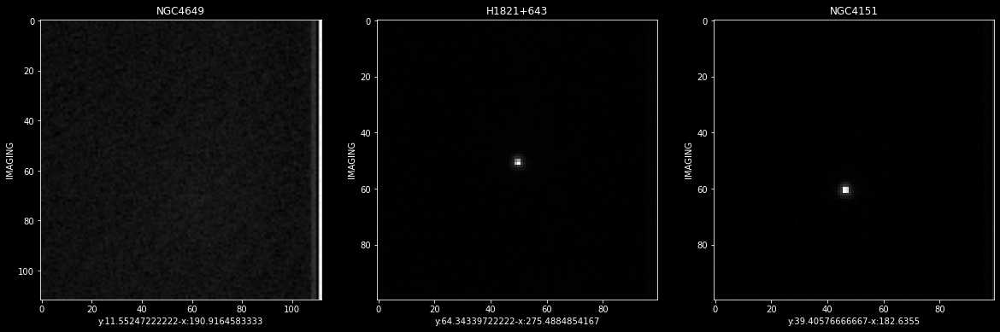

In [65]:
figure,axis=plt.subplots(1,3,figsize=(20,15))
axis[0].set_title(Spec_Data["targname"][0])
axis[0].set_ylabel(Spec_Data["OBSTYPE"][0])
axis[0].set_xlabel(f"y:{Spec_Data.DEC_TARG[0]}-x:{Spec_Data.RA_TARG[0]}")
axis[0].imshow(IMG_1,cmap="gray")

axis[1].set_title(Spec_Data["targname"][1])
axis[1].set_ylabel(Spec_Data["OBSTYPE"][1])
axis[1].set_xlabel(f"y:{Spec_Data.DEC_TARG[1]}-x:{Spec_Data.RA_TARG[1]}")
axis[1].imshow(IMG_2,cmap="gray")

axis[2].set_title(Spec_Data["targname"][2])
axis[2].set_ylabel(Spec_Data["OBSTYPE"][2])
axis[2].set_xlabel(f"y:{Spec_Data.DEC_TARG[2]}-x:{Spec_Data.RA_TARG[2]}")
axis[2].imshow(IMG_3,cmap="gray")

#we can also put alpha value for blending the float values or none and gives
#this parameter is a intensity of the color.we can put alpha=0.2,1

2D-PLOT

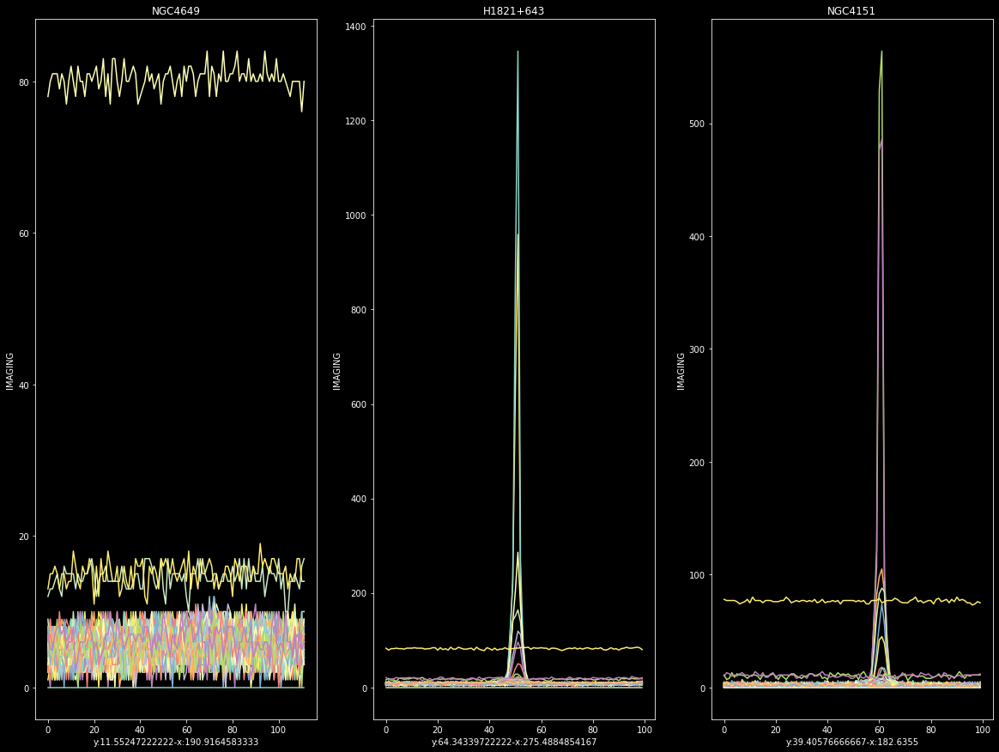

In [66]:
figure,axis=plt.subplots(1,3,figsize=(20,15))
axis[0].set_title(Spec_Data["targname"][0])
axis[0].set_ylabel(Spec_Data["OBSTYPE"][0])
axis[0].set_xlabel(f"y:{Spec_Data.DEC_TARG[0]}-x:{Spec_Data.RA_TARG[0]}")
axis[0].plot(IMG_1)

axis[1].set_title(Spec_Data["targname"][1])
axis[1].set_ylabel(Spec_Data["OBSTYPE"][1])
axis[1].set_xlabel(f"y:{Spec_Data.DEC_TARG[1]}-x:{Spec_Data.RA_TARG[1]}")
axis[1].plot(IMG_2)

axis[2].set_title(Spec_Data["targname"][2])
axis[2].set_ylabel(Spec_Data["OBSTYPE"][2])
axis[2].set_xlabel(f"y:{Spec_Data.DEC_TARG[2]}-x:{Spec_Data.RA_TARG[2]}")
axis[2].plot(IMG_3)

plt.show()

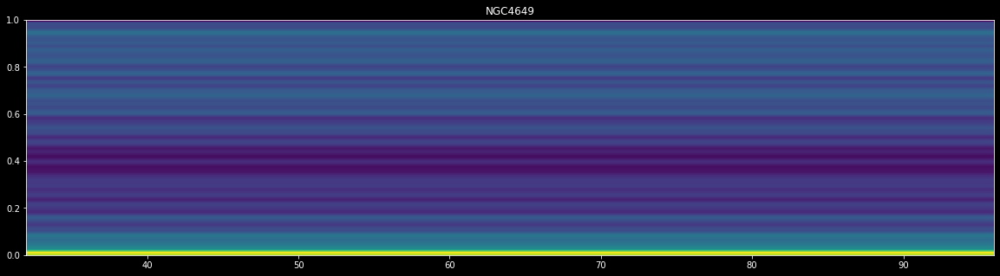

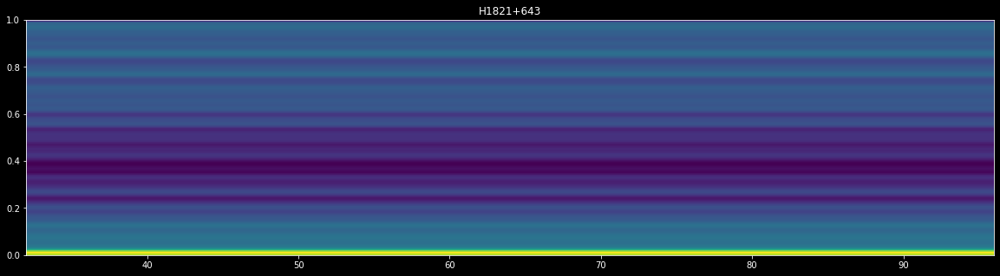

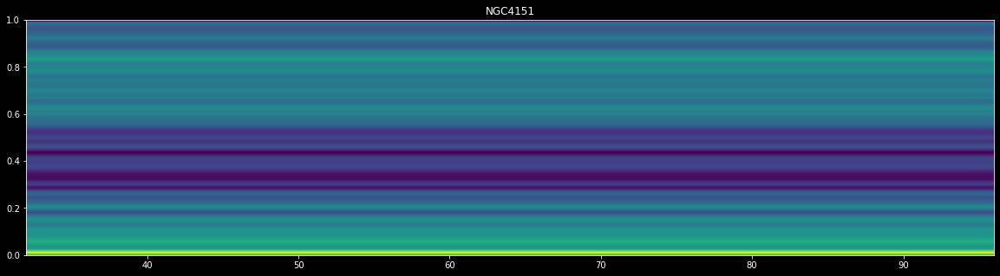

In [67]:
#SPECGRAM

figure=plt.figure(figsize=(20,5))
powerSpectrum_4,frequenciesFound_4,time_4,imageAxis_4=plt.specgram(IMG_1)
plt.title(Spec_Data["targname"][0])
plt.show()

figure=plt.figure(figsize=(20,5))
powerSpectrum_4,frequenciesFound_4,time_4,imageAxis_4=plt.specgram(IMG_2)
plt.title(Spec_Data["targname"][1])
plt.show()


figure=plt.figure(figsize=(20,5))
powerSpectrum_4,frequenciesFound_4,time_4,imageAxis_4=plt.specgram(IMG_3)
plt.title(Spec_Data["targname"][2])
plt.show()


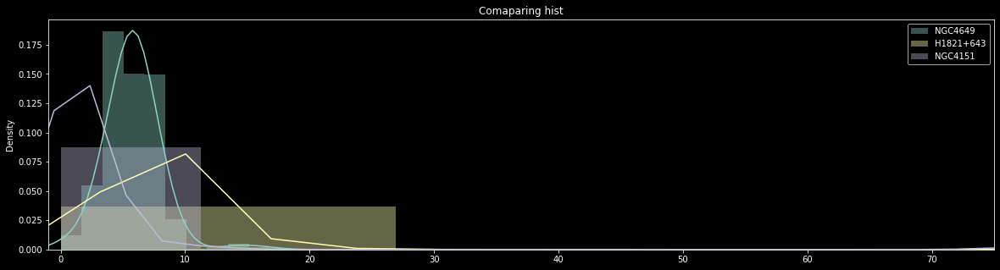

In [68]:
figure=plt.figure(figsize=(20,5))
sns.distplot(img1_flatten,label=Spec_Data["targname"][0])
sns.distplot(img2_flatten,label=Spec_Data["targname"][1])
sns.distplot(img3_flatten,label=Spec_Data["targname"][2])
plt.title("Comaparing hist")
plt.legend(prop=dict(size=10))
plt.xlim([-1,75])
plt.show()

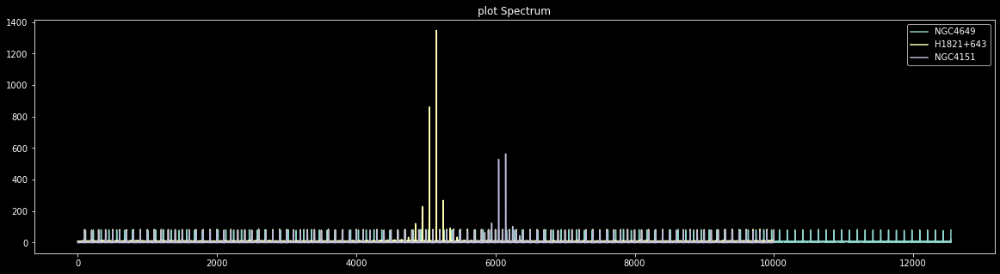

In [69]:
figure=plt.figure(figsize=(20,5))
plt.plot(img1_flatten,label=Spec_Data["targname"][0])
plt.plot(img2_flatten,label=Spec_Data["targname"][1])
plt.plot(img3_flatten,label=Spec_Data["targname"][2])
plt.title("plot Spectrum")
plt.legend(prop=dict(size=10))
plt.show()

UNIVERSE MAPPING

In [70]:
Spec_Data

,PATH,TARGET,TARDESCR,DARKCORR,targname,DEC_TARG,RA_TARG,OBSTYPE,MINWAVE,MAXWAVE,SUNANGLE,MOONANGL,RA_APER,DEC_APER,PA_APER
0,NEAR THE BLACK HOLE\MESSIER60\HST-OPTICAL\o4ak...,MESSIER60,GALAXY;ELLIPTICAL,OMIT,NGC4649,11.552472,190.916458,IMAGING,5490.0,9990.0,148.604736,50.866821,190.916458,11.552472,94.957618
1,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rx...,H1821,EXT-MEDIUM;ABSORPTION LINE SYSTEM - EXTRAGALAC...,OMIT,H1821+643,64.343397,275.488485,IMAGING,5490.0,9990.0,92.885109,90.069733,275.488485,64.343397,113.838951
2,NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304...,NGC4151,GALAXY;SEYFERT;NLR;BLR,OMIT,NGC4151,39.405767,182.635500,IMAGING,5490.0,9990.0,92.655922,38.361965,182.635500,39.405767,70.054016


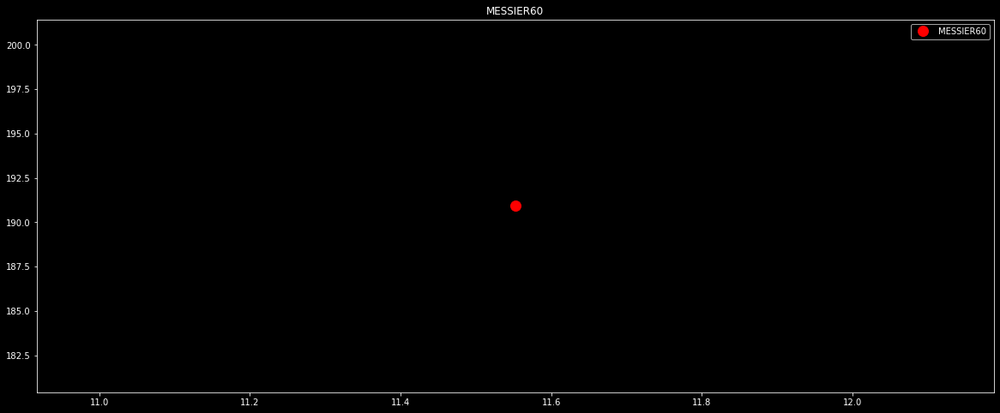

In [71]:
plt.figure(figsize=(20,8))
plt.plot(Spec_Data["DEC_TARG"][0],Spec_Data["RA_TARG"][0],color="red",marker="o",linestyle='None',markersize=12,label=Spec_Data["TARGET"][0])
plt.title(Spec_Data["TARGET"][0])
plt.legend(prop=dict(size=10))
plt.show()

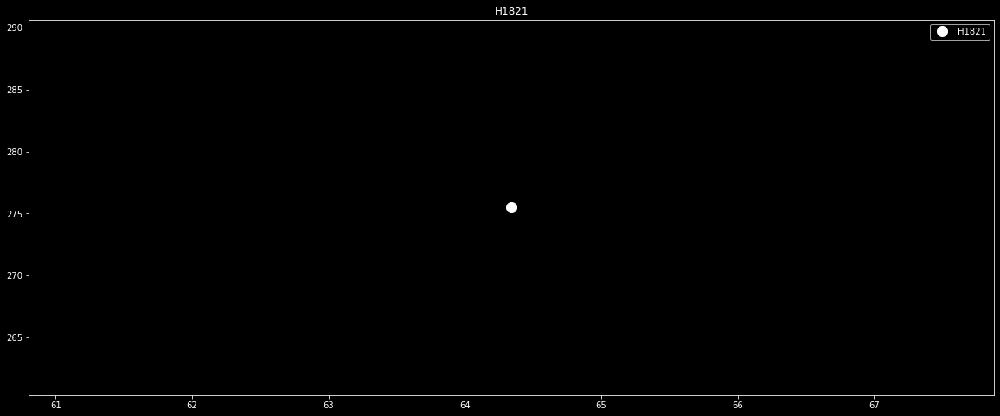

In [72]:
plt.figure(figsize=(20,8))
plt.plot(Spec_Data["DEC_TARG"][1],Spec_Data["RA_TARG"][1],color="white",marker="o",linestyle='None',markersize=12,label=Spec_Data["TARGET"][1])
plt.title(Spec_Data["TARGET"][1])
plt.legend(prop=dict(size=10))
plt.show()

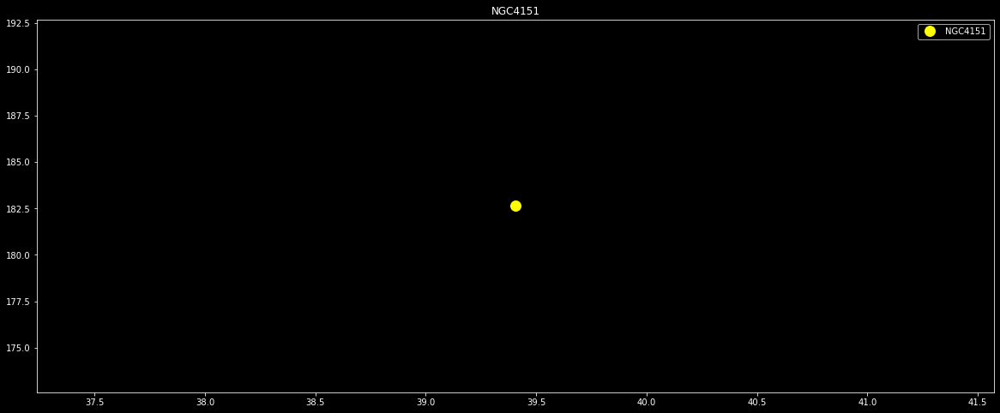

In [73]:
plt.figure(figsize=(20,8))
plt.plot(Spec_Data["DEC_TARG"][2],Spec_Data["RA_TARG"][2],color="yellow",marker="o",linestyle='None',markersize=12,label=Spec_Data["TARGET"][2])
plt.title(Spec_Data["TARGET"][2])
plt.legend(prop=dict(size=10))
plt.show()

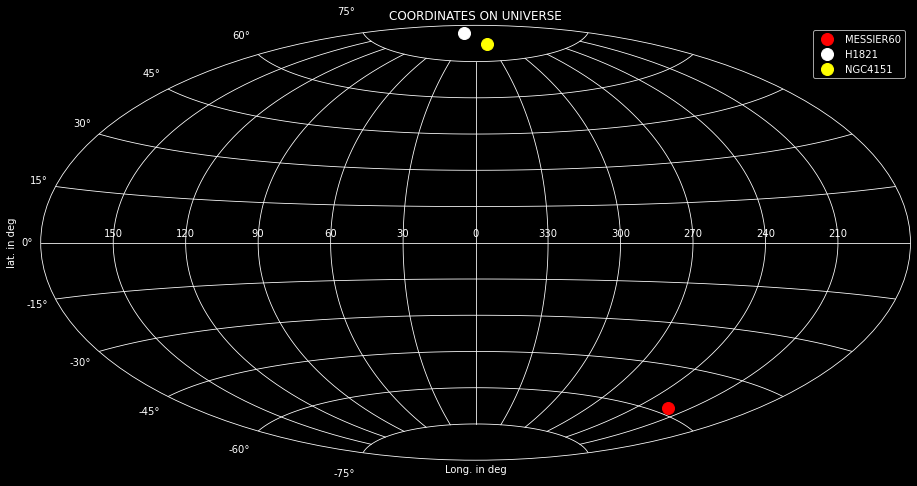

In [74]:
plt.figure(figsize=(25,8))
# Apply the aitoff projection and activate the grid
plt.subplot(projection="aitoff")
plt.grid(True)
# Set long. / lat. labels
plt.xlabel('Long. in deg')
plt.ylabel('lat. in deg')
plt.plot(Spec_Data["RA_TARG"][0],Spec_Data["DEC_TARG"][0],color="red",marker='o',linestyle='None',markersize=12,label=Spec_Data["TARGET"][0])
plt.plot(Spec_Data["RA_TARG"][1],Spec_Data["DEC_TARG"][1],color="white",marker='o',linestyle='None',markersize=12,label=Spec_Data["TARGET"][1])
plt.plot(Spec_Data["RA_TARG"][2],Spec_Data["DEC_TARG"][2],color="yellow",marker='o',linestyle='None',markersize=12,label=Spec_Data["TARGET"][2])
plt.xticks(ticks=np.radians([-150,-120,-90,-60,-30,0,30,60,90,120,150]),labels=['150','120','90','60','30','0','330','300','270','240','210'])
plt.legend(prop=dict(size=10))
plt.title("COORDINATES ON UNIVERSE")
plt.show()

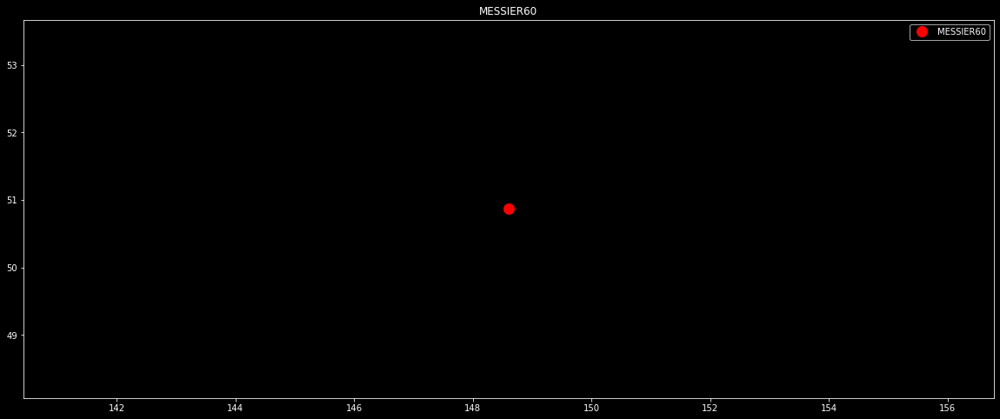

In [75]:
plt.figure(figsize=(20,8))
plt.plot(Spec_Data["SUNANGLE"][0],Spec_Data["MOONANGL"][0],color="red",marker='o',linestyle='None',markersize=12,label=Spec_Data["TARGET"][0])
plt.title(Spec_Data["TARGET"][0])
plt.legend(prop=dict(size=10))
plt.show()

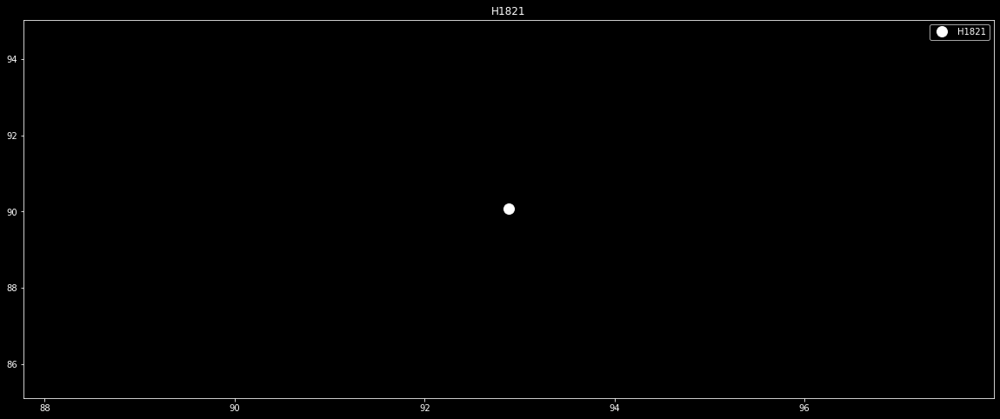

In [76]:
plt.figure(figsize=(20, 8))
plt.plot(Spec_Data["SUNANGLE"][1], \
             Spec_Data["MOONANGL"][1], \
             color="white", marker='o', linestyle='None', markersize=12, \
             label=Spec_Data["TARGET"][1])
plt.title(Spec_Data["TARGET"][1])
plt.legend(prop=dict(size=10))
plt.show()

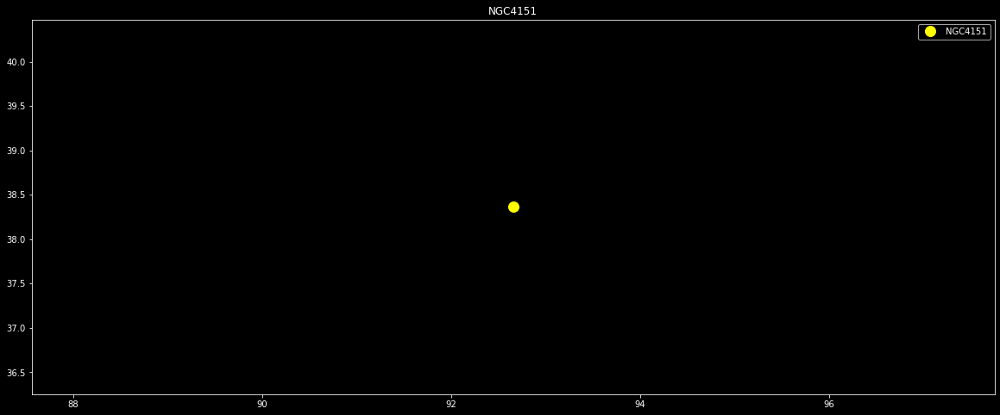

In [77]:
plt.figure(figsize=(20, 8))
plt.plot(Spec_Data["SUNANGLE"][2], \
             Spec_Data["MOONANGL"][2], \
             color="yellow", marker='o', linestyle='None', markersize=12, \
             label=Spec_Data["TARGET"][2])
plt.title(Spec_Data["TARGET"][2])
plt.legend(prop=dict(size=10))
plt.show()


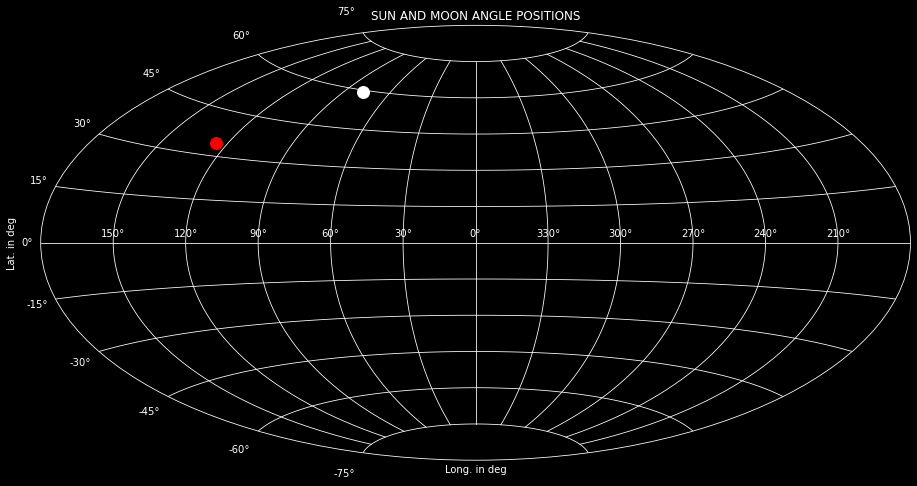

In [78]:
plt.figure(figsize=(25, 8))

# Apply the aitoff projection and activate the grid
plt.subplot(projection="aitoff")
plt.grid(True)
# Set long. / lat. labels

plt.xlabel('Long. in deg')
plt.ylabel('Lat. in deg')

plt.plot(Spec_Data["SUNANGLE"][0], \
             Spec_Data["MOONANGL"][0], \
             color="red", marker='o', linestyle='None', markersize=12, \
             label=Spec_Data["TARGET"][0])

plt.plot(Spec_Data["SUNANGLE"][1], \
             Spec_Data["MOONANGL"][1], \
             color="white", marker='o', linestyle='None', markersize=12, \
             label=Spec_Data["TARGET"][1])
plt.plot(Spec_Data["SUNANGLE"][2], \
             Spec_Data["MOONANGL"][2], \
             color="yellow", marker='o', linestyle='None', markersize=12, \
             label=Spec_Data["TARGET"][2])

plt.xticks(ticks=np.radians([-150, -120, -90, -60, -30, 0, \
                             30, 60, 90, 120, 150]),
           labels=['150°', '120°', '90°', '60°', '30°', '0°', \
                   '330°', '300°', '270°', '240°', '210°'])

plt.title("SUN AND MOON ANGLE POSITIONS")
plt.show()


2D HISTOGRAM

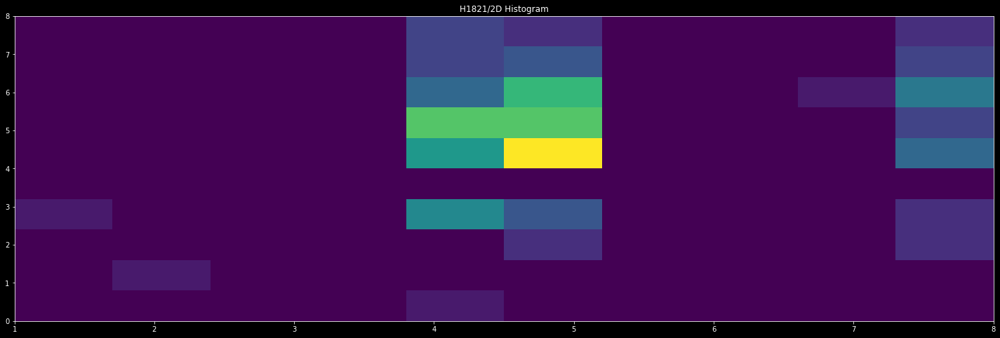

In [79]:
plt.figure(figsize=(25,8))
plt.hist2d(IMG_1[:,0],IMG_1[:,1])
plt.title(f"{Spec_Data.TARGET[1]}/2D Histogram")
plt.show()

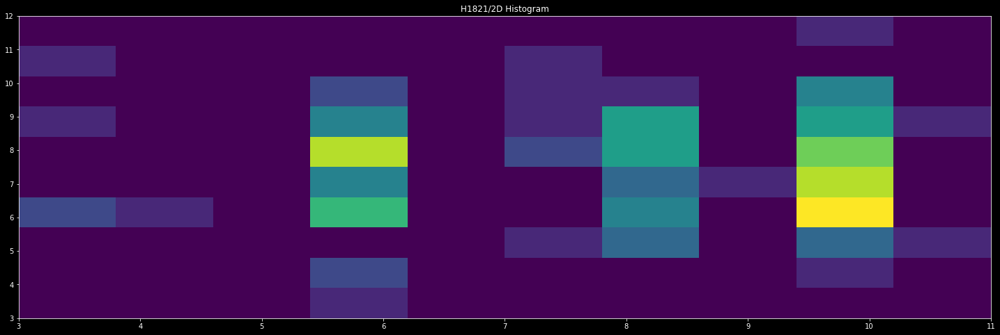

In [80]:
plt.figure(figsize=(25,8))
plt.hist2d(IMG_2[:,0],IMG_2[:,1])
plt.title(f"{Spec_Data.TARGET[1]}/2D Histogram")
plt.show()

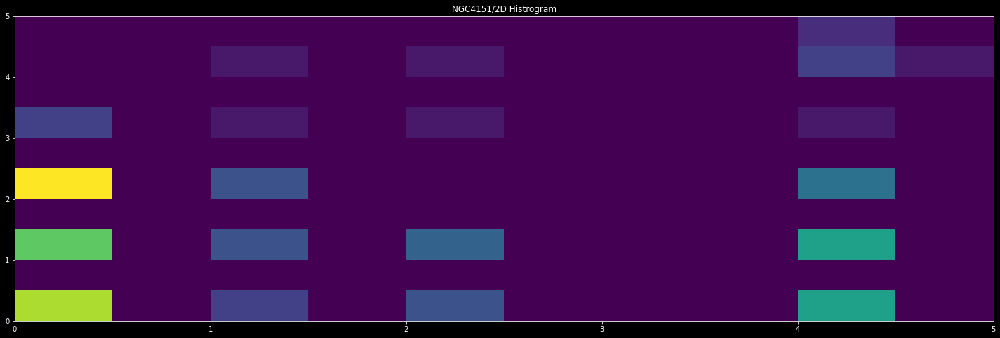

In [81]:
plt.figure(figsize=(25,8))
plt.hist2d(IMG_3[:,0],IMG_3[:,1])
plt.title(f"{Spec_Data.TARGET[2]}/2D Histrogram")
plt.show()

2D HEX

In [82]:
Spec_Data

,PATH,TARGET,TARDESCR,DARKCORR,targname,DEC_TARG,RA_TARG,OBSTYPE,MINWAVE,MAXWAVE,SUNANGLE,MOONANGL,RA_APER,DEC_APER,PA_APER
0,NEAR THE BLACK HOLE\MESSIER60\HST-OPTICAL\o4ak...,MESSIER60,GALAXY;ELLIPTICAL,OMIT,NGC4649,11.552472,190.916458,IMAGING,5490.0,9990.0,148.604736,50.866821,190.916458,11.552472,94.957618
1,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rx...,H1821,EXT-MEDIUM;ABSORPTION LINE SYSTEM - EXTRAGALAC...,OMIT,H1821+643,64.343397,275.488485,IMAGING,5490.0,9990.0,92.885109,90.069733,275.488485,64.343397,113.838951
2,NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304...,NGC4151,GALAXY;SEYFERT;NLR;BLR,OMIT,NGC4151,39.405767,182.635500,IMAGING,5490.0,9990.0,92.655922,38.361965,182.635500,39.405767,70.054016


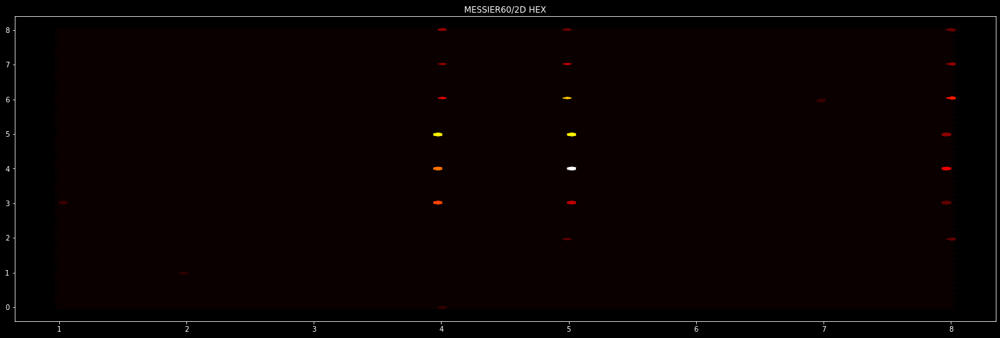

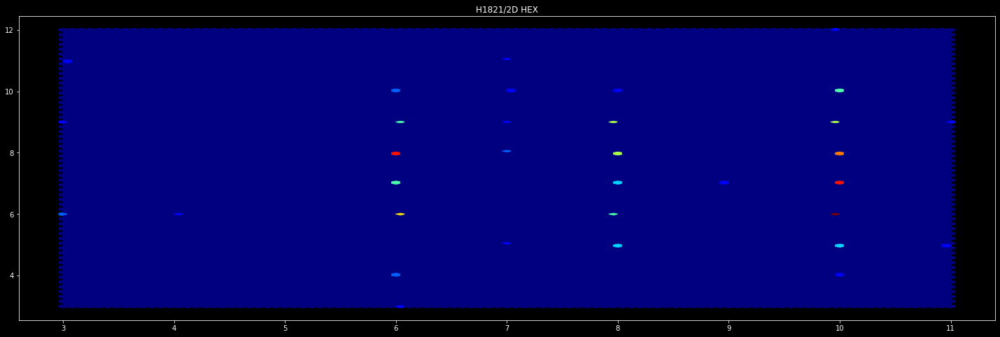

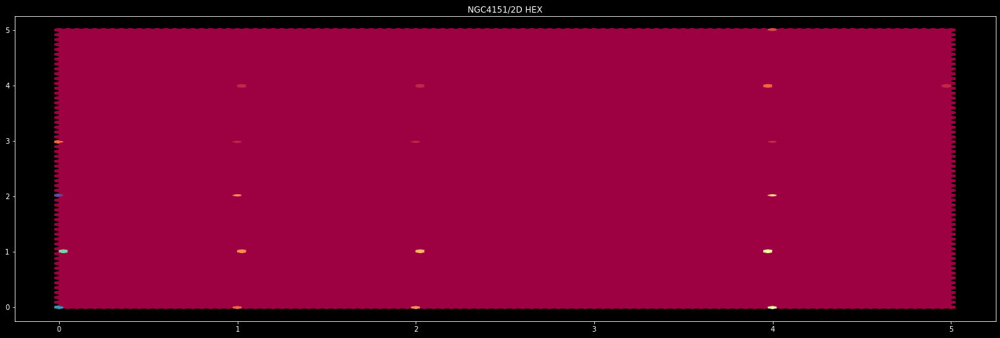

In [83]:
plt.figure(figsize=(25,8))
plt.hexbin(IMG_1[:,0],IMG_1[:,1],cmap="hot")
plt.title(f"{Spec_Data.TARGET[0]}/2D HEX")
plt.show()

plt.figure(figsize=(25,8))
plt.hexbin(IMG_2[:,0],IMG_2[:,1],cmap="jet")
plt.title(f"{Spec_Data.TARGET[1]}/2D HEX")
plt.show()

plt.figure(figsize=(25,8))
plt.hexbin(IMG_3[:,0],IMG_3[:,1],cmap="Spectral")
plt.title(f"{Spec_Data.TARGET[2]}/2D HEX")
plt.show()


In [84]:
fig=px.density_heatmap(IMG_1,x=IMG_1[:,0],y=IMG_1[:,1])
fig.show()

In [85]:
fig=px.density_heatmap(IMG_2,x=IMG_2[:,0],y=IMG_2[:,1])
fig.show()

In [86]:
fig=px.density_heatmap(IMG_3,x=IMG_3[:,0],y=IMG_3[:,1],marginal_x="histogram",marginal_y="histogram")
fig.show()

3-D

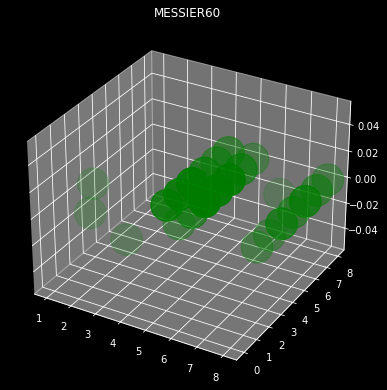

In [87]:
figure=plt.figure(figsize=(18,5))
ax=Axes3D(figure)
plt.title(Spec_Data.TARGET[0])
ax.scatter(IMG_1[:,0],IMG_1[:,1],c="green",s=1000,alpha=0.2)
plt.show()

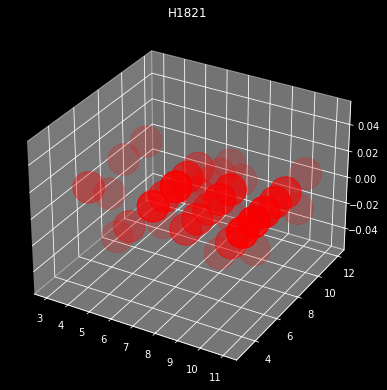

In [88]:
figure=plt.figure(figsize=(18,5))
ax=Axes3D(figure)
plt.title(Spec_Data.TARGET[1])
ax.scatter(IMG_2[:,0],IMG_2[:,1],c="red",s=1000,alpha=0.2)
plt.show()

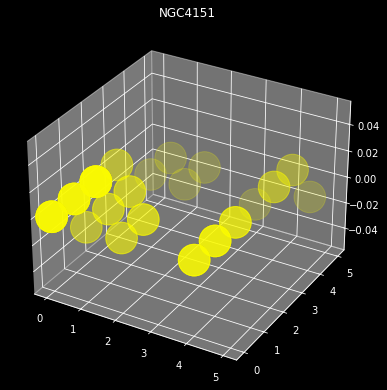

In [89]:
figure=plt.figure(figsize=(18,5))
ax=Axes3D(figure)
plt.title(Spec_Data.TARGET[2])
ax.scatter(IMG_3[:,0],IMG_3[:,1],c="yellow",s=1000,alpha=0.2)
plt.show()

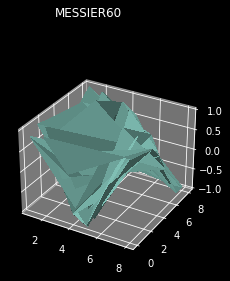

In [91]:
fig=plt.figure(figsize=(20,8))
fig.suptitle(Spec_Data.TARGET[0])
x=IMG_1[:,0]
y=IMG_1[:,1]
x,y=np.meshgrid(x,y)
r=np.sqrt(x**2+y**2)
z=np.sin(r)
ax=fig.add_subplot(2,1,1,projection='3d')
surf=ax.plot_surface(x,y,z,rstride=1,cstride=1,linewidth=0,antialiased=False)
ax.set_zlim(-1,1)
plt.show()

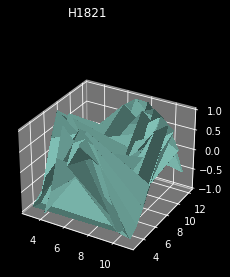

In [93]:
fig=plt.figure(figsize=(20,8))
fig.suptitle(Spec_Data.TARGET[1])
x=IMG_2[:,0]
y=IMG_2[:,1]
x,y=np.meshgrid(x,y)
r=np.sqrt(x**2+y**2)
z=np.sin(r)
ax=fig.add_subplot(2,1,1,projection='3d')
surf=ax.plot_surface(x,y,z,rstride=1,cstride=1,linewidth=0,antialiased=False)
ax.set_zlim(-1,1)
plt.show()

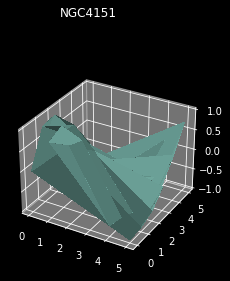

In [94]:
fig = plt.figure(figsize=(20,8))
fig.suptitle(Spec_Data.TARGET[2])

X = IMG_3[:,0]
Y = IMG_3[:,1]
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)
ax = fig.add_subplot(2, 1, 1, projection='3d')
surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1,
                       linewidth=0, antialiased=False)
ax.set_zlim(-1, 1)

plt.show()

<Figure size 1440x576 with 0 Axes>

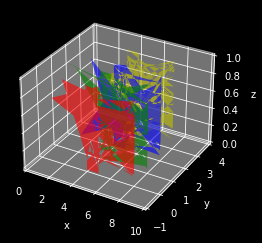

In [96]:
fig=plt.figure(figsize=(20,8))
np.random.seed(19680801)
def polygon_under_graph(xlist,ylist):
    return [(xlist[0],0.),*zip(xlist,ylist),(xlist[-1],0.)]
ax=plt.figure().add_subplot(projection='3d')
verts=[]
xs=IMG_1[:,0]
zs=range(4)
for i in zs:
    ys=np.random.rand(len(xs))
    verts.append(polygon_under_graph(xs,ys))
poly=PolyCollection(verts,facecolors=['r','g','b','y'],alpha=.6)
ax.add_collection3d(poly,zs=zs,zdir='y')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_xlim(0,10)
ax.set_ylim(-1,4)
ax.set_zlim(0,1)

plt.show()

<Figure size 1440x576 with 0 Axes>

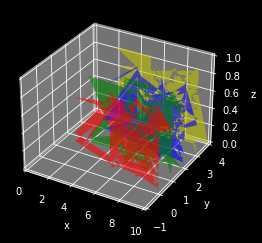

In [97]:
fig=plt.figure(figsize=(20,8))
np.random.seed(19680801)
def polygon_under_graph(xlist,ylist):
    return [(xlist[0],0.),*zip(xlist,ylist),(xlist[-1],0.)]
ax=plt.figure().add_subplot(projection='3d')
verts=[]
xs=IMG_2[:,0]
zs=range(4)
for i in zs:
    ys=np.random.rand(len(xs))
    verts.append(polygon_under_graph(xs,ys))
poly=PolyCollection(verts,facecolors=['r','g','b','y'],alpha=.6)
ax.add_collection3d(poly,zs=zs,zdir='y')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_xlim(0,10)
ax.set_ylim(-1,4)
ax.set_zlim(0,1)

plt.show()

<Figure size 1440x576 with 0 Axes>

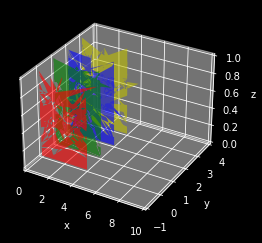

In [98]:
fig=plt.figure(figsize=(20,8))
np.random.seed(19680801)
def polygon_under_graph(xlist,ylist):
    return [(xlist[0],0.),*zip(xlist,ylist),(xlist[-1],0.)]
ax=plt.figure().add_subplot(projection='3d')
verts=[]
xs=IMG_3[:,0]
zs=range(4)
for i in zs:
    ys=np.random.rand(len(xs))
    verts.append(polygon_under_graph(xs,ys))
poly=PolyCollection(verts,facecolors=['r','g','b','y'],alpha=.6)
ax.add_collection3d(poly,zs=zs,zdir='y')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_xlim(0,10)
ax.set_ylim(-1,4)
ax.set_zlim(0,1)

plt.show()

SPLITTING BLACK HOLES AND VISION PROCESS

In [23]:
Main_Data["BLACK_HOLES"].value_counts()

NGC4151          7
MESSIER60        6
MESSIER87        6
SOMBRERO         6
SAGITTARIUS-A    5
H1821            4
IC1101           4
MARKARIAN        4
OJ287            4
3C273            3
CENTAURUS-A      3
MESSIER106       3
NGC5548          2
Name: BLACK_HOLES, dtype: int64

In [24]:
MARKARIAN_Data=Main_Data[Main_Data["BLACK_HOLES"]=="MARKARIAN"]
NGC4151_Data=Main_Data[Main_Data["BLACK_HOLES"]=="NGC4151"]
G_3C273_Data=Main_Data[Main_Data["BLACK_HOLES"]=="3C273"]
IC1101_Data=Main_Data[Main_Data["BLACK_HOLES"]=="IC1101"]
MESSIER87_Data=Main_Data[Main_Data["BLACK_HOLES"]=="MESSIER87"]
OJ287_Data=Main_Data[Main_Data["BLACK_HOLES"]=="OJ287"]
MESSIER106_Data=Main_Data[Main_Data["BLACK_HOLES"]=="MESSIER106"]
H1821_Data=Main_Data[Main_Data["BLACK_HOLES"]=="H1821"]
CENTAURUS_A_Data=Main_Data[Main_Data["BLACK_HOLES"]=="CENTAURUS-A"]
SOMBRERO_Data=Main_Data[Main_Data["BLACK_HOLES"]=="SOMBRERO"]
SAGITTARIUS_A_Data=Main_Data[Main_Data["BLACK_HOLES"]=="SAGITTARIUS-A"]

MARKARIAN_Data=MARKARIAN_Data.reset_index(drop=True)
NGC4151_Data=NGC4151_Data.reset_index(drop=True)
G_3C273_Data = G_3C273_Data.reset_index(drop=True)
IC1101_Data = IC1101_Data.reset_index(drop=True)
OJ287_Data = OJ287_Data.reset_index(drop=True)
MESSIER106_Data = MESSIER106_Data.reset_index(drop=True)
H1821_Data = H1821_Data.reset_index(drop=True)
CENTAURUS_A_Data = CENTAURUS_A_Data.reset_index(drop=True)
SOMBRERO_Data = SOMBRERO_Data.reset_index(drop=True)
SAGITTARIUS_A_Data = SAGITTARIUS_A_Data.reset_index(drop=True)

In [25]:
print(MARKARIAN_Data.head())
print("---"*10)
print(NGC4151_Data.head())
print("---"*10)
print(G_3C273_Data.head())
print("---"*10)
print(IC1101_Data.head())
print("---"*10)
print(OJ287_Data.head())
print("---"*10)
print(MESSIER106_Data.head())
print("---"*10)
print(CENTAURUS_A_Data.head())
print("---"*10)
print(H1821_Data.head())
print("---"*10)
print(SOMBRERO_Data.head())
print("---"*10)
print(SAGITTARIUS_A_Data.head())
print("---"*10)

                                                PATH BLACK_HOLES
0  NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_...   MARKARIAN
1  NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_...   MARKARIAN
2  NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_...   MARKARIAN
3  NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_...   MARKARIAN
------------------------------
                                                PATH BLACK_HOLES
0  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\n4hk18...     NGC4151
1  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42302...     NGC4151
2  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304...     NGC4151
3  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o4qa04...     NGC4151
4  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o59701...     NGC4151
------------------------------
                                                PATH BLACK_HOLES
0  NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_0598...       3C273
1  NEAR THE BLACK HOLE\3C273\HST-OPTICAL\iby84001...       3C273
2  NEAR THE BLACK HOLE\3C273

In [29]:
MARKARIAN_Hole=MARKARIAN_Data["PATH"][2]
NGC4151_Hole=NGC4151_Data["PATH"][0]
G_3C273_Hole=G_3C273_Data["PATH"][0]
IC1101_Hole=IC1101_Data["PATH"][1]
OJ287_Hole=OJ287_Data["PATH"][1]
MESSIER106_Hole=MESSIER106_Data["PATH"][0]
CENTAURUS_A_Hole=CENTAURUS_A_Data["PATH"][1]
H1821_Hole=H1821_Data["PATH"][0]
SOMBRERO_Hole=SOMBRERO_Data["PATH"][0]
SAGITTARIUS_A_Hole=SAGITTARIUS_A_Data["PATH"][1]

In [30]:
print("PATH:\n")
print(MARKARIAN_Hole) #HST EXT
print("---"*10)
print("PATH:\n")
print(NGC4151_Hole)
print("---"*10)
print("PATH:\n")
print(G_3C273_Hole)
print("---"*10)
print("PATH:\n")
print(IC1101_Hole)
print("---"*10)
print("PATH:\n")
print(OJ287_Hole) #HST EXT
print("---"*10)
print("PATH:\n")
print(MESSIER106_Hole)
print("---"*10)
print("PATH:\n")
print(CENTAURUS_A_Hole) #HST EXT
print("---"*10)
print("PATH:\n")
print(H1821_Hole)
print("---"*10)
print("PATH:\n")
print(SOMBRERO_Hole)
print("---"*10)
print("PATH:\n")
print(SAGITTARIUS_A_Hole) #HST EXT
print("---"*10)

PATH:

NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_06363_86_wfpc2_total_pc_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\n4hk18010_mos.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_05980_01_wfpc2_total_pc_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\IC1101\HST-UV\hst_11980_06_acs_sbc_f150lp_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\OJ287\HST-OPTICAL\hst_05992_06_wfpc2_f814w_pc_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\MESSIER106\HST-OPTICAL\j8l003030_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\CENTAURUS-A\HST-OPTICAL\hst_06789_a1_wfpc2_f555w_pc_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj01s4q_raw.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\hst_9454_14_acs_hrc_f330w_drz.fits
------------------------------
PATH:

NEAR THE BLACK H

READING FITS

In [31]:
MARKARIAN_reading=fits.open(MARKARIAN_Hole)
NGC4151_reading=fits.open(NGC4151_Hole)
G_3C273_reading=fits.open(G_3C273_Hole)
IC1101_reading=fits.open(IC1101_Hole)
OJ287_reading=fits.open(OJ287_Hole)
MESSIER106_reading=fits.open(MESSIER106_Hole)
CENTAURUS_A_reading=fits.open(CENTAURUS_A_Hole)
H1821_reading=fits.open(H1821_Hole)
SOMBRERO_reading=fits.open(SOMBRERO_Hole)
SAGITTARIUS_A_reading=fits.open(SAGITTARIUS_A_Hole)

In [33]:
print("informations\n")
print(MARKARIAN_reading.info())
print("---"*10,"\n")
print(NGC4151_reading.info())
print("---"*10,"\n")
print(G_3C273_reading.info())
print("---"*10,"\n")
print(IC1101_reading.info())
print("---"*10,"\n")
print(OJ287_reading.info())
print("---"*10,"\n")
print(MESSIER106_reading.info())
print("---"*10,"\n")
print(CENTAURUS_A_reading.info())
print("---"*10,"\n")
print(H1821_reading.info())
print("---"*10,"\n")
print(SOMBRERO_reading.info())
print("---"*10,"\n")
print(SAGITTARIUS_reading.info())
print("---"*10,"\n")
     

informations

Filename: NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_06363_86_wfpc2_total_pc_drz.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     402   ()      
  1  SCI           1 ImageHDU       110   (900, 900)   float32   
  2  WHT           1 ImageHDU       130   (900, 900)   float32   
  3  CTX           1 ImageHDU       129   (900, 900)   int32   
None
------------------------------ 

Filename: NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\n4hk18010_mos.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     323   ()      
  1  SCI           1 ImageHDU       143   (268, 268)   float32   
  2  ERR           1 ImageHDU        71   (268, 268)   float32   
  3  DQ            1 ImageHDU        71   (268, 268)   int16   
  4  SAMP          1 ImageHDU        71   (268, 268)   int16   
  5  TIME          1 ImageHDU        71   (268, 268)   float32   
None
------------------------------ 

File

NameError: name 'SAGITTARIUS_reading' is not defined

In [34]:
MARKARIAN_reading_h=list(MARKARIAN_reading[0].header.keys())
MARKARIAN_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'DATE',
 'FILETYPE',
 '',
 'TELESCOP',
 'INSTRUME',
 'EQUINOX']

In [35]:
NGC4151_reading_h=list(NGC4151_reading[0].header.keys())
NGC4151_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'ORIGIN',
 'IRAF-TLM',
 'NEXTEND',
 'DATE',
 'FILENAME',
 'FILETYPE']

In [36]:
G_3C273_reading_h=list(G_3C273_reading[0].header.keys())
G_3C273_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'DATE',
 'FILETYPE',
 '',
 'TELESCOP',
 'INSTRUME',
 'EQUINOX']

In [35]:
IC1101_reading_h=list(IC1101_reading[0].header.keys())
IC1101_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'COMMENT',
 'COMMENT',
 '',
 'TELESCOP',
 'INSTRUME',
 '']

In [36]:
OJ287_reading_h=list(OJ287_reading[0].header.keys())
OJ287_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'DATE',
 'FILETYPE',
 '',
 'TELESCOP',
 'INSTRUME',
 'EQUINOX']

In [37]:
MESSIER106_reading_h=list(MESSIER106_reading[0].header.keys())
MESSIER106_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'COMMENT',
 'COMMENT',
 '',
 'TELESCOP',
 'INSTRUME',
 '']

In [38]:
CENTAURUS_A_reading_h=list(CENTAURUS_A_reading[0].header.keys())
CENTAURUS_A_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'DATE',
 'FILETYPE',
 '',
 'TELESCOP',
 'INSTRUME',
 'EQUINOX']

In [39]:
H1821_reading_h=list(H1821_reading[0].header.keys())
H1821_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'NEXTEND',
 'GROUPS',
 'DATE',
 'FILENAME',
 'FILETYPE',
 '']

In [40]:
SOMBRERO_reading_h=list(SOMBRERO_reading[0].header.keys())
SOMBRERO_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'ORIGIN',
 'DATE',
 'IRAF-TLM',
 'COMMENT',
 'COMMENT',
 '']

In [40]:
SAGITTARIUS_A_reading_h=list(SAGITTARIUS_A_reading[0].header.keys())
SAGITTARIUS_A_reading_h[:10]

['SIMPLE',
 'BITPIX',
 'NAXIS',
 'EXTEND',
 'DATE',
 'FILETYPE',
 '',
 'TELESCOP',
 'INSTRUME',
 'EQUINOX']

COLLECTING SAME PARAMETERS

In [41]:
keys_list=[MARKARIAN_reading_h,NGC4151_reading_h,G_3C273_reading_h,IC1101_reading_h,OJ287_reading_h,MESSIER106_reading_h,CENTAURUS_A_reading_h,H1821_reading_h,SOMBRERO_reading_h,SAGITTARIUS_A_reading_h]

In [42]:
common_list=[]
another_list=[]

for params in MARKARIAN_reading_h:
    if params in NGC4151_reading_h:
        common_list.append(params)
    else:
        another_list.append(params)

In [43]:
print("len common:",len(common_list))
print("len different:",len(another_list))

len common: 118
len different: 284


In [44]:
print(common_list)

['SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'DATE', 'FILETYPE', '', 'TELESCOP', 'INSTRUME', 'EQUINOX', '', '', '', 'ROOTNAME', 'PROCTIME', 'OPUS_VER', 'CAL_VER', '', '', '', '', '', '', 'IMAGETYP', '', '', '', '', '', '', '', '', '', '', '', '', 'MASKCORR', 'BIASCORR', 'DARKCORR', 'FLATCORR', '', '', '', 'MASKFILE', 'DARKFILE', 'FLATFILE', 'PHOTTAB', 'IDCTAB', '', '', '', '', '', '', '', '', '', 'PA_V3', '', '', '', '', '', '', '', '', '', 'SUNANGLE', 'MOONANGL', 'SUN_ALT', 'FGSLOCK', 'GYROMODE', 'REFFRAME', '', 'DATE-OBS', 'TIME-OBS', 'EXPSTART', 'EXPEND', 'EXPTIME', 'EXPFLAG', 'QUALCOM1', 'QUALCOM2', 'QUALCOM3', 'QUALITY', '', '', 'TARGNAME', 'RA_TARG', 'DEC_TARG', 'ECL_LONG', 'ECL_LAT', 'GAL_LONG', 'GAL_LAT', '', 'PROPOSID', 'LINENUM', '', '', '', '', 'T_SGSTAR', '', '', '', 'PATTERN1', 'P1_SHAPE', 'P1_PURPS', 'P1_NPTS', 'P1_PSPAC', 'P1_LSPAC', 'P1_ANGLE', 'P1_FRAME', 'P1_ORINT', 'P1_CENTR', 'PATTSTEP', 'NEXTEND', 'FILENAME', 'ASN_MTYP']


In [45]:
true_list=[]
for x_values in common_list:
    if x_values!='':
        true_list.append(x_values)

In [46]:
len(true_list)

64

In [47]:
print(true_list)

['SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'DATE', 'FILETYPE', 'TELESCOP', 'INSTRUME', 'EQUINOX', 'ROOTNAME', 'PROCTIME', 'OPUS_VER', 'CAL_VER', 'IMAGETYP', 'MASKCORR', 'BIASCORR', 'DARKCORR', 'FLATCORR', 'MASKFILE', 'DARKFILE', 'FLATFILE', 'PHOTTAB', 'IDCTAB', 'PA_V3', 'SUNANGLE', 'MOONANGL', 'SUN_ALT', 'FGSLOCK', 'GYROMODE', 'REFFRAME', 'DATE-OBS', 'TIME-OBS', 'EXPSTART', 'EXPEND', 'EXPTIME', 'EXPFLAG', 'QUALCOM1', 'QUALCOM2', 'QUALCOM3', 'QUALITY', 'TARGNAME', 'RA_TARG', 'DEC_TARG', 'ECL_LONG', 'ECL_LAT', 'GAL_LONG', 'GAL_LAT', 'PROPOSID', 'LINENUM', 'T_SGSTAR', 'PATTERN1', 'P1_SHAPE', 'P1_PURPS', 'P1_NPTS', 'P1_PSPAC', 'P1_LSPAC', 'P1_ANGLE', 'P1_FRAME', 'P1_ORINT', 'P1_CENTR', 'PATTSTEP', 'NEXTEND', 'FILENAME', 'ASN_MTYP']


In [48]:
main_key=[]
different_key=[]
for params in keys_list:
    for x_params in params:
        if x_params in SAGITTARIUS_A_reading_h:
            main_key.append(x_params)
        else:
            different_key.append(x_params)

In [49]:
print(len(main_key))
print(len(different_key))

4579
588


In [59]:
print(main_key)

['SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'DATE', 'FILETYPE', '', 'TELESCOP', 'INSTRUME', 'EQUINOX', '', '', '', 'ROOTNAME', 'PROCTIME', 'OPUS_VER', 'CAL_VER', '', '', '', 'MODE', 'SERIALS', '', '', '', 'IMAGETYP', 'CDBSFILE', 'PKTFMT', '', '', '', 'FILTNAM1', 'FILTNAM2', 'FILTER1', 'FILTER2', 'FILTROT', 'LRFWAVE', '', '', '', 'BANDWID', 'CENTRWV', '', '', '', 'UCH1CJTM', 'UCH2CJTM', 'UCH3CJTM', 'UCH4CJTM', 'UBAY3TMP', 'KSPOTS', 'SHUTTER', 'ATODGAIN', '', '', '', 'MASKCORR', 'ATODCORR', 'WF4TCORR', 'BLEVCORR', 'BIASCORR', 'DARKCORR', 'FLATCORR', 'SHADCORR', 'DOSATMAP', 'DOPHOTOM', 'DOHISTOS', 'DRIZCORR', 'OUTDTYPE', '', '', '', 'MASKFILE', 'ATODFILE', 'WF4TFILE', 'BLEVFILE', 'BLEVDFIL', 'BIASFILE', 'BIASDFIL', 'DARKFILE', 'DARKDFIL', 'FLATFILE', 'FLATDFIL', 'SHADFILE', 'PHOTTAB', 'GRAPHTAB', 'COMPTAB', 'IDCTAB', 'OFFTAB', 'DGEOFILE', '', '', '', 'SATURATE', 'USCALE', 'UZERO', '', '', '', 'READTIME', '', '', '', 'PA_V3', 'RA_SUN', 'DEC_SUN', 'EQNX_SUN', 'MTFLAG', 'EQRADTRG', 'FLATNTRG', '

In [50]:
single_key=[i for j, i in enumerate(main_key) if i not in main_key[:j]]

In [51]:
d1fferent_key=[i for j , i in enumerate(different_key) if i not in different_key[:j]]

In [52]:
print("len single:",len(single_key))
print("len different:",len(d1fferent_key))

len single: 374
len different: 374


In [53]:
print(single_key)

['SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'DATE', 'FILETYPE', '', 'TELESCOP', 'INSTRUME', 'EQUINOX', 'ROOTNAME', 'PROCTIME', 'OPUS_VER', 'CAL_VER', 'MODE', 'SERIALS', 'IMAGETYP', 'CDBSFILE', 'PKTFMT', 'FILTNAM1', 'FILTNAM2', 'FILTER1', 'FILTER2', 'FILTROT', 'LRFWAVE', 'BANDWID', 'CENTRWV', 'UCH1CJTM', 'UCH2CJTM', 'UCH3CJTM', 'UCH4CJTM', 'UBAY3TMP', 'KSPOTS', 'SHUTTER', 'ATODGAIN', 'MASKCORR', 'ATODCORR', 'WF4TCORR', 'BLEVCORR', 'BIASCORR', 'DARKCORR', 'FLATCORR', 'SHADCORR', 'DOSATMAP', 'DOPHOTOM', 'DOHISTOS', 'DRIZCORR', 'OUTDTYPE', 'MASKFILE', 'ATODFILE', 'WF4TFILE', 'BLEVFILE', 'BLEVDFIL', 'BIASFILE', 'BIASDFIL', 'DARKFILE', 'DARKDFIL', 'FLATFILE', 'FLATDFIL', 'SHADFILE', 'PHOTTAB', 'GRAPHTAB', 'COMPTAB', 'IDCTAB', 'OFFTAB', 'DGEOFILE', 'SATURATE', 'USCALE', 'UZERO', 'READTIME', 'PA_V3', 'RA_SUN', 'DEC_SUN', 'EQNX_SUN', 'MTFLAG', 'EQRADTRG', 'FLATNTRG', 'NPDECTRG', 'NPRATRG', 'ROTRTTRG', 'LONGPMER', 'EPLONGPM', 'SURFLATD', 'SURFLONG', 'SURFALTD', 'PODPSFF', 'STDCFFF', 'STDCFFP', 'RSDP

In [64]:
print(d1fferent_key)

['ORIGIN', 'IRAF-TLM', 'PRIMESI', 'APER_REF', 'ELON_REF', 'ELAT_REF', 'GLON_REF', 'GLAT_REF', 'PR_INV_L', 'PR_INV_F', 'PR_INV_M', 'ORIENTAT', 'CAMERA', 'PRIMECAM', 'FOCUS', 'APERTURE', 'OBSMODE', 'FILTER', 'NUMITER', 'NREAD', 'NSAMP', 'SAMP_SEQ', 'CR_ELIM', 'SAT_ELIM', 'CRTHRESH', 'SATHRESH', 'VARSCALE', 'FOMXPOS', 'FOMYPOS', 'NFXTILTP', 'NFYTILTP', 'NPXTILTP', 'NPYTILTP', 'NPFOCUSP', 'TIMEPATT', 'READOUT', 'SAMPZERO', 'HCLKRATE', 'VIDEO_BW', 'ADCGAIN', 'BACKEST1', 'BACKEST2', 'BACKEST3', 'PHOTMODE', 'PHOTFLAM', 'PHOTFNU', 'PHOTZPT', 'ZPSCALE', 'PHOTFERR', 'PHOTPLAM', 'PHOTBW', 'SAA_EXIT', 'SAA_TIME', 'SAA_DARK', 'SAACRMAP', 'SAADFILE', 'SAADPDGR', 'NOISFILE', 'NLINFILE', 'TEMPFILE', 'LINSCALE', 'AMPSCALE', 'PMODFILE', 'PMSKFILE', 'TDFFILE', 'TDFGROUP', 'BACKTAB', 'ZPRATTAB', 'RNLCORTB', 'MASKPDGR', 'NOISPDGR', 'NLINPDGR', 'DARKPDGR', 'FLATPDGR', 'PHOTPDGR', 'BACKPDGR', 'ZSIGCORR', 'ZOFFCORR', 'NOISCALC', 'NLINCORR', 'BARSCORR', 'UNITCORR', 'PHOTCALC', 'CRIDCALC', 'BEPCORR', 'BACKCALC'

In [54]:
MARKARIAN_Comments=MARKARIAN_reading[0].header
NGC4151_Comments=NGC4151_reading[0].header
G_3C273_Comments=G_3C273_reading[0].header
IC1101_Comments=IC1101_reading[0].header
OJ287_Comments=OJ287_reading[0].header
MESSIER106_Comments=MESSIER106_reading[0].header
CENTAURUS_A_Comments=CENTAURUS_A_reading[0].header
H1821_Comments=H1821_reading[0].header
SOMBRERO_Comments=SOMBRERO_reading[0].header
SAGITTARIUS_A_Comments=SAGITTARIUS_A_reading[0].header

In [55]:
comments_list=[MARKARIAN_Comments,NGC4151_Comments,G_3C273_Comments,IC1101_Comments,OJ287_Comments,MESSIER106_Comments,CENTAURUS_A_Comments,H1821_Comments,SOMBRERO_Comments,SAGITTARIUS_A_Comments]

In [56]:
Document_list = [MARKARIAN_reading,NGC4151_reading,G_3C273_reading,IC1101_reading,
                OJ287_reading,MESSIER106_reading,CENTAURUS_A_reading,H1821_reading,
                SOMBRERO_reading,SAGITTARIUS_A_reading]

In [57]:
keys_list=[MARKARIAN_reading_h,NGC4151_reading_h,G_3C273_reading_h,IC1101_reading_h,OJ287_reading_h,
            MESSIER106_reading_h,CENTAURUS_A_reading_h,H1821_reading_h,SOMBRERO_reading_h,
            SAGITTARIUS_A_reading_h]

WE TURN ALL FEATURES OF BLACK HOLES INTO COLUMNS AND SAVE AS CSV FILE. WE DID THE WHOLE PROCESS IN ORDER, BUT WE WILL SHOW EXAMPLES BELOW WE WILL ALSO SHARE ALL CSV FILES AS SEPARATE DATA

In [58]:
columns_name=[]
values_output=[]

for comment_params in SAGITTARIUS_A_reading_h:
    comments_out=SAGITTARIUS_A_Comments.comments[comment_params]
    values_out=SAGITTARIUS_A_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [59]:
SAGITTARIUS_A_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
SAGITTARIUS_A_DATA=SAGITTARIUS_A_DATA.reset_index()
SAGITTARIUS_A_DATA["COMMENTS"]=columns_name
SAGITTARIUS_A_DATA=SAGITTARIUS_A_DATA[SAGITTARIUS_A_DATA["COMMENTS"]!=" "]
SAGITTARIUS_A_DATA=SAGITTARIUS_A_DATA.reset_index(drop=True)
for values_x,columns_x in zip(SAGITTARIUS_A_DATA.VALUES,SAGITTARIUS_A_DATA.COMMENTS):
    SAGITTARIUS_A_DATA[columns_x]=values_x
SAGITTARIUS_A_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
SAGITTARIUS_A_DATA=SAGITTARIUS_A_DATA[0:1]
SAGITTARIUS_A_DATA.to_csv("SAGITTARIUS_A_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/2610795272.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  SAGITTARIUS_A_DATA[columns_x]=values_x


In [60]:
SAGITTARIUS_A_DATA

,index,conforms to FITS standard,array data type,number of array dimensions,,date this file was written (yyyy-mm-dd),type of data found in data file,telescope used to acquire data,identifier for instrument used to acquire data,equinox of celestial coord. system,...,"Drizzle, units used for shifts","Drizzle, frame in which shifts were applied","Drizzle, exposure keyword name in input image","Drizzle, units of input image - counts or cps","Drizzle, units of output image - counts or cps","Drizzle, fill value for zero weight output pix","Drizzle, reference center of input image (X)","Drizzle, reference center of input image (Y)","Drizzle, reference center of output image (X)","Drizzle, reference center of output image (Y)"
0,conforms to FITS standard,True,8,0,HLA WFPC2 Process Version 3 (DR3)\nHLA process...,2009-11-08,SCI,HST,WFPC2,2000.0,...,output,output,EXPTIME,counts,cps,INDEF,400.5,400.5,1075.5,1075.5


In [61]:
columns_name=[]
values_output=[]

for comment_params in SOMBRERO_reading_h:
    comments_out=SOMBRERO_Comments.comments[comment_params]
    values_out=SOMBRERO_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [62]:
SOMBRERO_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
SOMBRERO_DATA=SOMBRERO_DATA.reset_index()
SOMBRERO_DATA["COMMENTS"]=columns_name
SOMBRERO_DATA=SOMBRERO_DATA[SOMBRERO_DATA["COMMENTS"]!=" "]
SOMBRERO_DATA=SOMBRERO_DATA.reset_index(drop=True)
for values_x,columns_x in zip(SOMBRERO_DATA.VALUES,SOMBRERO_DATA.COMMENTS):
    SOMBRERO_DATA[columns_x]=values_x
SOMBRERO_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
SOMBRERO_DATA=SOMBRERO_DATA[0:1]
SOMBRERO_DATA.to_csv("SOMBRERO_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/384729064.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  SOMBRERO_DATA[columns_x]=values_x


In [63]:
SOMBRERO_DATA

,index,Fits standard,Bits per pixel,Number of axes,File may contain extensions,FITS file originator,Date FITS file was generated,Time of last modification,,telescope used to acquire data,...,"Drizzle, fill value for zero weight output pix",Input image WCS Version used,"Drizzle, units of output image - counts or cps","Drizzle, form of weight distribution kernel","Drizzle, source of geometric information","Drizzle, default IDCTAB pixel size(arcsec)","Drizzle, linear size of drop","Drizzle, input data image","Drizzle, input image exposure time (s)",position angle of V3-axis of HST (deg)
0,Fits standard,True,16,0,True,NOAO-IRAF FITS Image Kernel July 2003,2017-08-19,2017-08-19T15:13:20,\n\n / DATA DESCRIPTION KEYWORDS\n\n\n ...,HST,...,INDEF,,cps,square,wcs,0.02500000037252903,1.0,"j8ff14dpq_flt.fits[sci,1]",150.0,145.814606


In [64]:
columns_name=[]
values_output=[]

for comment_params in H1821_reading_h:
    comments_out=H1821_Comments.comments[comment_params]
    values_out=H1821_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [65]:
H1821_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
H1821_DATA=H1821_DATA.reset_index()
H1821_DATA["COMMENTS"]=columns_name
H1821_DATA=H1821_DATA[H1821_DATA["COMMENTS"]!=" "]
H1821_DATA=H1821_DATA.reset_index(drop=True)
for values_x,columns_x in zip(H1821_DATA.VALUES,H1821_DATA.COMMENTS):
    H1821_DATA[columns_x]=values_x
H1821_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
H1821_DATA=SOMBRERO_DATA[0:1]
H1821_DATA.to_csv("H1821_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/3620841914.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  H1821_DATA[columns_x]=values_x


In [66]:
H1821_DATA

,index,Fits standard,Bits per pixel,Number of axes,File may contain extensions,FITS file originator,Date FITS file was generated,Time of last modification,,telescope used to acquire data,...,"Drizzle, fill value for zero weight output pix",Input image WCS Version used,"Drizzle, units of output image - counts or cps","Drizzle, form of weight distribution kernel","Drizzle, source of geometric information","Drizzle, default IDCTAB pixel size(arcsec)","Drizzle, linear size of drop","Drizzle, input data image","Drizzle, input image exposure time (s)",position angle of V3-axis of HST (deg)
0,Fits standard,True,16,0,True,NOAO-IRAF FITS Image Kernel July 2003,2017-08-19,2017-08-19T15:13:20,\n\n / DATA DESCRIPTION KEYWORDS\n\n\n ...,HST,...,INDEF,,cps,square,wcs,0.02500000037252903,1.0,"j8ff14dpq_flt.fits[sci,1]",150.0,145.814606


In [67]:
columns_name=[]
values_output=[]

for comment_params in CENTAURUS_A_reading_h:
    comments_out=CENTAURUS_A_Comments.comments[comment_params]
    values_out=CENTAURUS_A_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [68]:
CENTAURUS_A_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
CENTAURUS_A_DATA=CENTAURUS_A_DATA.reset_index()
CENTAURUS_A_DATA["COMMENTS"]=columns_name
CENTAURUS_A_DATA=CENTAURUS_A_DATA[CENTAURUS_A_DATA["COMMENTS"]!=" "]
CENTAURUS_A_DATA=CENTAURUS_A_DATA.reset_index(drop=True)
for values_x,columns_x in zip(CENTAURUS_A_DATA.VALUES,CENTAURUS_A_DATA.COMMENTS):
    CENTAURUS_A_DATA[columns_x]=values_x
CENTAURUS_A_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
CENTAURUS_A_DATA=CENTAURUS_A_DATA[0:1]
CENTAURUS_A_DATA.to_csv("CENTAURUS_A_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/2763380189.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  CENTAURUS_A_DATA[columns_x]=values_x


In [69]:
CENTAURUS_A_DATA

,index,conforms to FITS standard,array data type,number of array dimensions,,date this file was written (yyyy-mm-dd),type of data found in data file,telescope used to acquire data,identifier for instrument used to acquire data,equinox of celestial coord. system,...,"Drizzle, units used for shifts","Drizzle, frame in which shifts were applied","Drizzle, exposure keyword name in input image","Drizzle, units of input image - counts or cps","Drizzle, units of output image - counts or cps","Drizzle, fill value for zero weight output pix","Drizzle, reference center of input image (X)","Drizzle, reference center of input image (Y)","Drizzle, reference center of output image (X)","Drizzle, reference center of output image (Y)"
0,conforms to FITS standard,True,8,0,HLA WFPC2 Process Version 3 (DR3)\nHLA process...,2009-11-06,SCI,HST,WFPC2,2000.0,...,output,output,EXPTIME,counts,cps,INDEF,400.5,400.5,1675.5,1675.5


In [70]:
columns_name=[]
values_output=[]

for comment_params in MESSIER106_reading_h:
    comments_out=MESSIER106_Comments.comments[comment_params]
    values_out=MESSIER106_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [71]:
MESSIER106_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
MESSIER106_DATA=MESSIER106_DATA.reset_index()
MESSIER106_DATA["COMMENTS"]=columns_name
MESSIER106_DATA=MESSIER106_DATA[MESSIER106_DATA["COMMENTS"]!=" "]
MESSIER106_DATA=MESSIER106_DATA.reset_index(drop=True)
for values_x,columns_x in zip(MESSIER106_DATA.VALUES,MESSIER106_DATA.COMMENTS):
    MESSIER106_DATA[columns_x]=values_x
MESSIER106_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
MESSIER106_DATA=MESSIER106_DATA[0:1]
MESSIER106_DATA.to_csv("MESSIER106_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/2402473012.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  MESSIER106_DATA[columns_x]=values_x


In [72]:
MESSIER106_DATA

,index,conforms to FITS standard,array data type,number of array dimensions,,telescope used to acquire data,identifier for instrument used to acquire data,type of exposure identifier,instrument designated as prime,proposer's target name,...,"Drizzle, input weighting image","Drizzle, weighting factor for input image","Drizzle, form of weight distribution kernel","Drizzle, linear size of drop","Drizzle, source of coefficients","Drizzle, units of output image - counts or cps","Drizzle, fill value for zero weight output pix",Input image WCS Version used,"Drizzle, pixel size (arcsec) of output image","Drizzle, default IDCTAB pixel size(arcsec)"
0,conforms to FITS standard,True,8,0,CCD parameters table:\n reference table jref$...,HST,ACS,EXT,ACS,M87JET,...,j8l003ddq_sci1_final_mask.fits,1,square,1.0,SIP,cps,INDEF,,0.02500000037252903,0.02500000037252903


In [73]:
columns_name=[]
values_output=[]

for comment_params in OJ287_reading_h:
    comments_out=OJ287_Comments.comments[comment_params]
    values_out=OJ287_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [74]:
OJ287_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
OJ287_DATA=OJ287_DATA.reset_index()
OJ287_DATA["COMMENTS"]=columns_name
OJ287_DATA=OJ287_DATA[OJ287_DATA["COMMENTS"]!=" "]
OJ287_DATA=OJ287_DATA.reset_index(drop=True)
for values_x,columns_x in zip(OJ287_DATA.VALUES,OJ287_DATA.COMMENTS):
    OJ287_DATA[columns_x]=values_x
OJ287_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
OJ287_DATA=OJ287_DATA[0:1]
OJ287_DATA.to_csv("OJ287_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/4152075791.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  OJ287_DATA[columns_x]=values_x


In [75]:
OJ287_DATA

,index,conforms to FITS standard,array data type,number of array dimensions,,date this file was written (yyyy-mm-dd),type of data found in data file,telescope used to acquire data,identifier for instrument used to acquire data,equinox of celestial coord. system,...,"Drizzle, units used for shifts","Drizzle, frame in which shifts were applied","Drizzle, exposure keyword name in input image","Drizzle, units of input image - counts or cps","Drizzle, units of output image - counts or cps","Drizzle, fill value for zero weight output pix","Drizzle, reference center of input image (X)","Drizzle, reference center of input image (Y)","Drizzle, reference center of output image (X)","Drizzle, reference center of output image (Y)"
0,conforms to FITS standard,True,8,0,HLA WFPC2 Process Version 3 (DR3)\nHLA process...,2009-11-05,SCI,HST,WFPC2,2000.0,...,output,output,EXPTIME,counts,cps,INDEF,400.5,400.5,525.5,525.5


In [76]:
columns_name=[]
values_output=[]

for comment_params in IC1101_reading_h:
    comments_out=IC1101_Comments.comments[comment_params]
    values_out=IC1101_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [77]:
IC1101_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
IC1101_DATA=IC1101_DATA.reset_index()
IC1101_DATA["COMMENTS"]=columns_name
IC1101_DATA=IC1101_DATA[IC1101_DATA["COMMENTS"]!=" "]
IC1101_DATA=IC1101_DATA.reset_index(drop=True)
for values_x,columns_x in zip(IC1101_DATA.VALUES,IC1101_DATA.COMMENTS):
    IC1101_DATA[columns_x]=values_x
IC1101_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
IC1101_DATA=IC1101_DATA[0:1]
IC1101_DATA.to_csv("IC1101_DATA.csv")

In [78]:
IC1101_DATA

,index,conforms to FITS standard,array data type,number of array dimensions,,telescope used to acquire data,identifier for instrument used to acquire data,type of exposure identifier,instrument designated as prime,proposer's target name,...,"Drizzle, fill value for zero weight output pix",Input image WCS Version used,"Drizzle, units of output image - counts or cps","Drizzle, form of weight distribution kernel","Drizzle, source of geometric information","Drizzle, default IDCTAB pixel size(arcsec)","Drizzle, linear size of drop","Drizzle, input data image","Drizzle, input image exposure time (s)",position angle of V3-axis of HST (deg)
0,conforms to FITS standard,True,8,0,DQICORR complete ...\n DQ array initialized ....,HST,ACS,EXT,ACS,ABELL-2029,...,INDEF,,cps,square,wcs,0.02500000037252903,1.0,"jba706awq_flt.fits[sci,1]",396.0,79.439217


In [79]:
columns_name=[]
values_output=[]

for comment_params in G_3C273_reading_h:
    comments_out=G_3C273_Comments.comments[comment_params]
    values_out=G_3C273_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [80]:
G_3C273_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
G_3C273_DATA=G_3C273_DATA.reset_index()
G_3C273_DATA["COMMENTS"]=columns_name
G_3C273_DATA=G_3C273_DATA[G_3C273_DATA["COMMENTS"]!=" "]
G_3C273_DATA=G_3C273_DATA.reset_index(drop=True)
for values_x,columns_x in zip(G_3C273_DATA.VALUES,G_3C273_DATA.COMMENTS):
    G_3C273_DATA[columns_x]=values_x
G_3C273_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
G_3C273_DATA=G_3C273_DATA[0:1]
G_3C273_DATA.to_csv("G_3C273_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/491746566.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  G_3C273_DATA[columns_x]=values_x


In [81]:
G_3C273_DATA

,index,conforms to FITS standard,array data type,number of array dimensions,,date this file was written (yyyy-mm-dd),type of data found in data file,telescope used to acquire data,identifier for instrument used to acquire data,equinox of celestial coord. system,...,"Drizzle, units used for shifts","Drizzle, frame in which shifts were applied","Drizzle, exposure keyword name in input image","Drizzle, units of input image - counts or cps","Drizzle, units of output image - counts or cps","Drizzle, fill value for zero weight output pix","Drizzle, reference center of input image (X)","Drizzle, reference center of input image (Y)","Drizzle, reference center of output image (X)","Drizzle, reference center of output image (Y)"
0,conforms to FITS standard,True,8,0,HLA WFPC2 Process Version 3 (DR3)\nHLA process...,2009-11-04,SCI,HST,WFPC2,2000.0,...,output,output,EXPTIME,counts,cps,INDEF,400.5,400.5,525.5,525.5


In [82]:
columns_name=[]
values_output=[]

for comment_params in MARKARIAN_reading_h:
    comments_out=MARKARIAN_Comments.comments[comment_params]
    values_out=MARKARIAN_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [83]:
MARKARIAN_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
MARKARIAN_DATA=MARKARIAN_DATA.reset_index()
MARKARIAN_DATA["COMMENTS"]=columns_name
MARKARIAN_DATA=MARKARIAN_DATA[MARKARIAN_DATA["COMMENTS"]!=" "]
MARKARIAN_DATA=MARKARIAN_DATA.reset_index(drop=True)
for values_x,columns_x in zip(MARKARIAN_DATA.VALUES,MARKARIAN_DATA.COMMENTS):
    MARKARIAN_DATA[columns_x]=values_x
MARKARIAN_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
MARKARIAN_DATA=MARKARIAN_DATA[0:1]
MARKARIAN_DATA.to_csv("MARKARIAN_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/1922076244.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  MARKARIAN_DATA[columns_x]=values_x


In [84]:
MARKARIAN_DATA

,index,conforms to FITS standard,array data type,number of array dimensions,,date this file was written (yyyy-mm-dd),type of data found in data file,telescope used to acquire data,identifier for instrument used to acquire data,equinox of celestial coord. system,...,"Drizzle, units used for shifts","Drizzle, frame in which shifts were applied","Drizzle, exposure keyword name in input image","Drizzle, units of input image - counts or cps","Drizzle, units of output image - counts or cps","Drizzle, fill value for zero weight output pix","Drizzle, reference center of input image (X)","Drizzle, reference center of input image (Y)","Drizzle, reference center of output image (X)","Drizzle, reference center of output image (Y)"
0,conforms to FITS standard,True,8,0,HLA WFPC2 Process Version 3 (DR3)\nHLA process...,2009-11-05,SCI,HST,WFPC2,2000.0,...,output,output,EXPTIME,counts,cps,INDEF,400.5,400.5,450.5,450.5


In [85]:
columns_name=[]
values_output=[]

for comment_params in NGC4151_reading_h:
    comments_out=NGC4151_Comments.comments[comment_params]
    values_out=NGC4151_reading[0].header[comment_params]
    values_out=str(values_out)
    columns_name.append(comments_out)
    values_output.append(values_out)

In [86]:
NGC4151_DATA=pd.DataFrame(values_output,columns_name,columns=["VALUES"])
NGC4151_DATA=NGC4151_DATA.reset_index()
NGC4151_DATA["COMMENTS"]=columns_name
NGC4151_DATA=NGC4151_DATA[NGC4151_DATA["COMMENTS"]!=" "]
NGC4151_DATA=NGC4151_DATA.reset_index(drop=True)
for values_x,columns_x in zip(NGC4151_DATA.VALUES,NGC4151_DATA.COMMENTS):
    NGC4151_DATA[columns_x]=values_x
NGC4151_DATA.drop(["COMMENTS","VALUES"],inplace=True,axis=1)
NGC4151_DATA=NGC4151_DATA[0:1]
NGC4151_DATA.to_csv("NGC4151_DATA.csv")

C:\Users\91810\AppData\Local\Temp/ipykernel_6412/3750951996.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  NGC4151_DATA[columns_x]=values_x


In [87]:
NGC4151_DATA

,index,Fits standard,Bits per pixel,Number of axes,File may contain extensions,FITS file originator,Time of last modification,Number of standard extensions,date this file was written (yyyy-mm-dd),name of file,...,Y pos CENTroid (pixels),checkBoX SUM,OFFSET maneuver X (steps),OFFSET maneuver Y (steps),OFFSeT maneuver X (pixels),OFFSeT maneuver Y (pixels),"SLEW CONfirmation (Clear,Set)",unique identifier assigned to association,name of the association table,Role of the Member in the Association
0,Fits standard,True,16,0,True,NOAO-IRAF FITS Image Kernel July 2003,02:33:37 (26/02/2009),5,2009-02-26T02:33:37,n4hk18010_mos.fits,...,107.719,1122,9649,55592,75.3822,-77.6875,Clear,N4HK18010,n4hk18010_asn.fits,PROD-TARG


CHECKING REAL VALUES

In [88]:
MARKARIAN_reading=fits.open(MARKARIAN_Hole)
NGC4151_reading=fits.open(NGC4151_Hole)
G_3C273_reading=fits.open(G_3C273_Hole)
IC1101_reading=fits.open(IC1101_Hole)
OJ287_reading=fits.open(OJ287_Hole)
MESSIER106_reading=fits.open(MESSIER106_Hole)
CENTAURUS_A_reading=fits.open(CENTAURUS_A_Hole)
H1821_reading=fits.open(H1821_Hole)
SOMBRERO_reading=fits.open(SOMBRERO_Hole)
SAGITTARIUS_A_reading=fits.open(SAGITTARIUS_A_Hole)

In [89]:
print(single_key[0])
print("---"*30)
print(MARKARIAN_Comments.comments[single_key[0]])
print(MARKARIAN_reading[0].header[single_key[0]])
print("---"*20)
print(NGC4151_Comments.comments[single_key[0]])
print(NGC4151_reading[0].header[single_key[0]])
print("---"*20)
print(G_3C273_Comments.comments[single_key[0]])
print(G_3C273_reading[0].header[single_key[0]])
print("---"*20)
print(IC1101_Comments.comments[single_key[0]])
print(IC1101_reading[0].header[single_key[0]])
print("---"*20)
print(OJ287_Comments.comments[single_key[0]])
print(OJ287_reading[0].header[single_key[0]])
print("---"*20)
print(MESSIER106_Comments.comments[single_key[0]])
print(MESSIER106_reading[0].header[single_key[0]])
print("---"*20)
print(CENTAURUS_A_Comments.comments[single_key[0]])
print(CENTAURUS_A_reading[0].header[single_key[0]])
print("---"*20)
print(H1821_Comments.comments[single_key[0]])
print(H1821_reading[0].header[single_key[0]])
print("---"*20)
print(SOMBRERO_Comments.comments[single_key[0]])
print(SOMBRERO_reading[0].header[single_key[0]])
print("---"*20)
print(SAGITTARIUS_A_Comments.comments[single_key[0]])
print(SAGITTARIUS_A_reading[0].header[single_key[0]])
print("---"*20)

SIMPLE
------------------------------------------------------------------------------------------
conforms to FITS standard
True
------------------------------------------------------------
Fits standard
True
------------------------------------------------------------
conforms to FITS standard
True
------------------------------------------------------------
conforms to FITS standard
True
------------------------------------------------------------
conforms to FITS standard
True
------------------------------------------------------------
conforms to FITS standard
True
------------------------------------------------------------
conforms to FITS standard
True
------------------------------------------------------------
data conform to FITS standard
True
------------------------------------------------------------
Fits standard
True
------------------------------------------------------------
conforms to FITS standard
True
------------------------------------------------------------


In [90]:
Keys_Params=single_key[5]
print(Keys_Params)
print("---"*30)
print(MARKARIAN_Comments.comments[Keys_Params])
print(MARKARIAN_reading[0].header[Keys_Params])
print("---"*20)
print(NGC4151_Comments.comments[Keys_Params])
print(NGC4151_reading[0].header[Keys_Params])
print("---"*20)
print(G_3C273_Comments.comments[Keys_Params])

print(G_3C273_reading[0].header[Keys_Params])
print("---"*20)
# print(IC1101_Comments.comments[Keys_Params])
# print(IC1101_reading[0].header[Keys_Params])
print("---"*20)
print(OJ287_Comments.comments[Keys_Params])
print(OJ287_reading[0].header[Keys_Params])
print("---"*20)
# print(MESSIER106_Comments.comments[Keys_Params])
# print(MESSIER106_reading[0].header[Keys_Params])
print("---"*20)
print(CENTAURUS_A_Comments.comments[Keys_Params])
print(CENTAURUS_A_reading[0].header[Keys_Params])
print("---"*20)
print(H1821_Comments.comments[Keys_Params])
print(H1821_reading[0].header[Keys_Params])
print("---"*20)
# print(SOMBRERO_Comments.comments[Keys_Params])
# print(SOMBRERO_reading[0].header[Keys_Params])
print("---"*20)
print(SAGITTARIUS_A_Comments.comments[Keys_Params])
print(SAGITTARIUS_A_reading[0].header[Keys_Params])
print("---"*20)

FILETYPE
------------------------------------------------------------------------------------------
type of data found in data file
SCI
------------------------------------------------------------
type of data found in data file
SCI
------------------------------------------------------------
type of data found in data file
SCI
------------------------------------------------------------
------------------------------------------------------------
type of data found in data file
SCI
------------------------------------------------------------
------------------------------------------------------------
type of data found in data file
SCI
------------------------------------------------------------
type of data found in data file
SCI
------------------------------------------------------------
------------------------------------------------------------
type of data found in data file
SCI
------------------------------------------------------------


In [91]:
Keys_Params="ECL_LONG"
print(Keys_Params)
print("---"*30)
print(MARKARIAN_Comments.comments[Keys_Params])
print(MARKARIAN_reading[0].header[Keys_Params])
print("---"*20)
# print(NGC4151_Comments.comments[Keys_Params])
# print(NGC4151_reading[0].header[Keys_Params])
# print("---"*20)
# print(G_3C273_Comments.comments[Keys_Params])

# print(G_3C273_reading[0].header[Keys_Params])
print("---"*20)
# print(IC1101_Comments.comments[Keys_Params])
# print(IC1101_reading[0].header[Keys_Params])
# print("---"*20)
print(OJ287_Comments.comments[Keys_Params])
print(OJ287_reading[0].header[Keys_Params])
print("---"*20)
# print(MESSIER106_Comments.comments[Keys_Params])
# print(MESSIER106_reading[0].header[Keys_Params])
# print("---"*20)
print(CENTAURUS_A_Comments.comments[Keys_Params])
print(CENTAURUS_A_reading[0].header[Keys_Params])
print("---"*20)
# # print(H1821_Comments.comments[Keys_Params])
# print(H1821_reading[0].header[Keys_Params])
# print("---"*20)
# print(SOMBRERO_Comments.comments[Keys_Params])
# print(SOMBRERO_reading[0].header[Keys_Params])
# print("---"*20)
print(SAGITTARIUS_A_Comments.comments[Keys_Params])
print(SAGITTARIUS_A_reading[0].header[Keys_Params])
print("---"*20)

ECL_LONG
------------------------------------------------------------------------------------------
ecliptic longitude of the target (deg) (J2000)
242.588965
------------------------------------------------------------
------------------------------------------------------------
ecliptic longitude of the target (deg) (J2000)
130.511086
------------------------------------------------------------
ecliptic longitude of the target (deg) (J2000)
217.13688
------------------------------------------------------------
ecliptic longitude of the target (deg) (J2000)
266.71793
------------------------------------------------------------


DO THIS WITH ALL THE FEATURES KEY_PARAMS CONTAIN LIKE SUN_ANGLE,MOONANGL,RA_TARG,ETC...



MATH PROCESS
HUBBLE'S LAW:
v = H0 . d

v = Recessional velocity (km/s)

H0 = Hubble’s Constant

d = Distance

ORBIT ECCENTRICITY:
e = c/a

e = Orbital Eccentricity
c = Distance from focus to center
a = semimajor axis
VACUUM FREQUENCY:
f = c/λ

f = Wave frequency (Hz)
c = Speed of Light (m/s)
λ = wavelength (m)
THE INTENSITY OF LIGHT
i = 1/d ** 2

i = intensity of light
d = distance

Constants
Speed of Light = c = 3 ˆ 108 m/s
Gravitational Constant = G = 6.67 * 10 ** -11N m2/kg2
Mass of Earth = MC = 5.97 * 10 ** 24 kg
Radius of Earth = RC = 6378 km
Mass of the sun = M@ = 1.99 * 10 ** 30 kg
Radius of the sun = R@ = 6.96 * 10 ** 5 km
Effective Temperature of the sun = T@ = 5778 K
Luminosity of the sun = L@ = 3.9 * 10 ** 26W
Mass of the Moon = MK = 7.346 * 10 ** 22 kg
Radius of the Moon = RK = 1738.1 km
Mass of a proton = mp = 1.6726 * 10 ** -27 kg
Mass of an Electron = me = 9.109 * 10 ** -31 kg
Hubble’s Constant = H0 = 70 km/s/Mpc (Note: There is ongoing debate about the actual value)
Planck’s Constant = h = 6.626 * 10 ** -34 J s
Type Ia Supernova Absolute Magnitude = -19.3

In [92]:
#CHECKING FORMULA AND VISION

Keys_Params_Long="GAL_LONG"
Keys_Params_Lat="GAL_LAT"
TARG_NAME="TARGNAME"
print(Keys_Params)
print("---"*30)
print(MARKARIAN_reading[0].header[TARG_NAME],"\n")
print(MARKARIAN_Comments.comments[Keys_Params_Long])
print(MARKARIAN_reading[0].header[Keys_Params_Long])
print("\n")
print(MARKARIAN_Comments.comments[Keys_Params_Lat])
print(MARKARIAN_reading[0].header[Keys_Params_Lat])
print("---"*20)
print(OJ287_reading[0].header[TARG_NAME],"\n")
print(OJ287_Comments.comments[Keys_Params_Long])
print(OJ287_reading[0].header[Keys_Params_Long])
print("\n")
print(OJ287_Comments.comments[Keys_Params_Lat])
print(OJ287_reading[0].header[Keys_Params_Lat])
print("---"*20)
print(CENTAURUS_A_reading[0].header[TARG_NAME],"\n")
print(CENTAURUS_A_Comments.comments[Keys_Params_Long])
print(CENTAURUS_A_reading[0].header[Keys_Params_Long])
print("\n")
print(CENTAURUS_A_Comments.comments[Keys_Params_Lat])
print(CENTAURUS_A_reading[0].header[Keys_Params_Lat])
print("---"*20)
print(SAGITTARIUS_A_reading[0].header[TARG_NAME],"\n")
print(SAGITTARIUS_A_Comments.comments[Keys_Params_Long])
print(SAGITTARIUS_A_reading[0].header[Keys_Params_Long])
print("\n")
print(SAGITTARIUS_A_Comments.comments[Keys_Params_Lat])
print(SAGITTARIUS_A_reading[0].header[Keys_Params_Lat])
print("---"*20)

ECL_LONG
------------------------------------------------------------------------------------------
MRK501 

galactic longitude of the target (deg) (J2000)
63.609959


galactic latitude of the target (deg) (J2000)
38.855866
------------------------------------------------------------
OJ287 

galactic longitude of the target (deg) (J2000)
206.817197


galactic latitude of the target (deg) (J2000)
35.828488
------------------------------------------------------------
NGC5128-FIELD6 

galactic longitude of the target (deg) (J2000)
309.497636


galactic latitude of the target (deg) (J2000)
19.401423
------------------------------------------------------------
ANY 

galactic longitude of the target (deg) (J2000)
359.931522


galactic latitude of the target (deg) (J2000)
0.100224
------------------------------------------------------------


In [93]:
MARKARIAN_CSV_DOC=pd.read_csv("./MARKARIAN_DATA.csv")
OJ287_CSV_DOC=pd.read_csv("./OJ287_DATA.csv")
CENTAURUS_A_CSV_DOC=pd.read_csv("./CENTAURUS_A_DATA.csv")
SAGITTARIUS_A_CSV_DOC=pd.read_csv("./SAGITTARIUS_A_DATA.csv")                         

In [94]:
print(MARKARIAN_CSV_DOC["galactic longitude of the target (deg) (J2000)"])
print(MARKARIAN_CSV_DOC["galactic latitude of the target (deg) (J2000)"])

0    63.609959
Name: galactic longitude of the target (deg) (J2000), dtype: float64
0    38.855866
Name: galactic latitude of the target (deg) (J2000), dtype: float64


In [95]:
DEC_NAME="declination of the target (deg) (J2000)"
RA_NAME="right ascension of the target (deg) (J2000)"
GAL_LAT_NAME="galactic latitude of the target (deg) (J2000)"
GAL_LON_NAME="galactic longitude of the target (deg) (J2000)"

In [96]:
print(MARKARIAN_CSV_DOC[DEC_NAME])
print(MARKARIAN_CSV_DOC[RA_NAME])

0    39.760167
Name: declination of the target (deg) (J2000), dtype: float64
0    253.4675
Name: right ascension of the target (deg) (J2000), dtype: float64


In [97]:
print(OJ287_CSV_DOC[DEC_NAME])
print(OJ287_CSV_DOC[RA_NAME])

0    20.108412
Name: declination of the target (deg) (J2000), dtype: float64
0    133.703858
Name: right ascension of the target (deg) (J2000), dtype: float64


In [98]:
print(CENTAURUS_A_CSV_DOC[DEC_NAME])
print(CENTAURUS_A_CSV_DOC[RA_NAME])

0   -43.035789
Name: declination of the target (deg) (J2000), dtype: float64
0    201.342333
Name: right ascension of the target (deg) (J2000), dtype: float64


In [99]:
print(SAGITTARIUS_A_CSV_DOC[DEC_NAME])
print(SAGITTARIUS_A_CSV_DOC[RA_NAME])

0   -28.941811
Name: declination of the target (deg) (J2000), dtype: float64
0    266.263862
Name: right ascension of the target (deg) (J2000), dtype: float64


In [100]:
plt.style.use("dark_background")


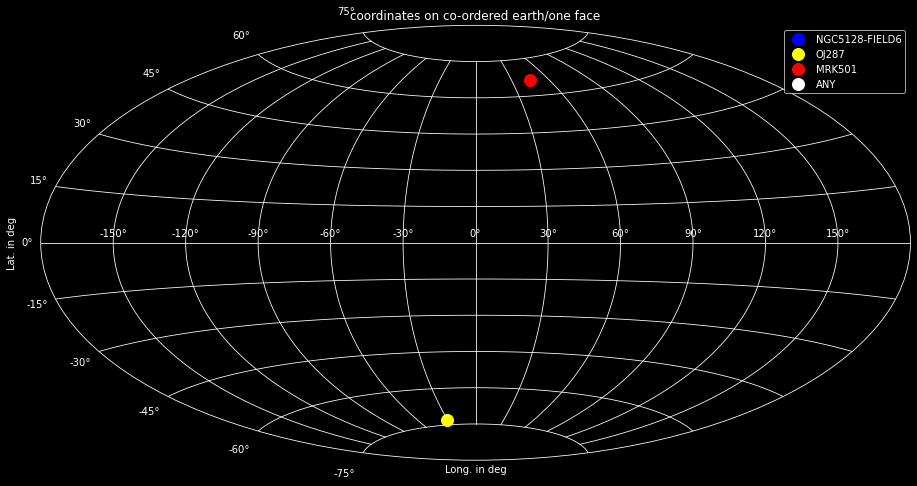

In [101]:
plt.figure(figsize=(25,8))
plt.subplot(projection="aitoff")
plt.grid(True)
plt.xlabel('Long. in deg')
plt.ylabel('Lat. in deg')

plt.plot(CENTAURUS_A_CSV_DOC[GAL_LON_NAME],CENTAURUS_A_CSV_DOC[GAL_LAT_NAME],color="blue",marker='o',linestyle='None',markersize=12,label=CENTAURUS_A_reading[0].header["TARGNAME"])
plt.plot(OJ287_CSV_DOC[GAL_LON_NAME],OJ287_CSV_DOC[GAL_LAT_NAME],color="yellow",marker='o',linestyle='None',markersize=12,label=OJ287_reading[0].header["TARGNAME"])
plt.plot(MARKARIAN_CSV_DOC[GAL_LON_NAME],MARKARIAN_CSV_DOC[GAL_LAT_NAME],color="red",marker='o',linestyle='None',markersize=12,label=MARKARIAN_reading[0].header["TARGNAME"])
plt.plot(SAGITTARIUS_A_CSV_DOC[GAL_LON_NAME],SAGITTARIUS_A_CSV_DOC[GAL_LAT_NAME],color="white",marker='o',linestyle='None',markersize=12,label=SAGITTARIUS_A_reading[0].header["TARGNAME"])
plt.legend(prop=dict(size=10))
plt.title("coordinates on co-ordered earth/one face")
plt.show()


the spots you can't see are on the back of the circle staying

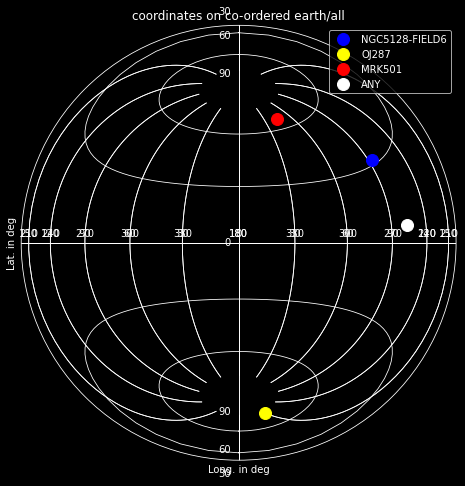

In [102]:
plt.figure(figsize=(25,8))
plt.subplot(projection="lambert")
plt.grid(True)
plt.xlabel('Long. in deg')
plt.ylabel('Lat. in deg')

plt.plot(CENTAURUS_A_CSV_DOC[GAL_LON_NAME],CENTAURUS_A_CSV_DOC[GAL_LAT_NAME],color="blue",marker='o',linestyle='None',markersize=12,label=CENTAURUS_A_reading[0].header["TARGNAME"])
plt.plot(OJ287_CSV_DOC[GAL_LON_NAME],OJ287_CSV_DOC[GAL_LAT_NAME],color="yellow",marker='o',linestyle='None',markersize=12,label=OJ287_reading[0].header["TARGNAME"])
plt.plot(MARKARIAN_CSV_DOC[GAL_LON_NAME],MARKARIAN_CSV_DOC[GAL_LAT_NAME],color="red",marker='o',linestyle='None',markersize=12,label=MARKARIAN_reading[0].header["TARGNAME"])
plt.plot(SAGITTARIUS_A_CSV_DOC[GAL_LON_NAME],SAGITTARIUS_A_CSV_DOC[GAL_LAT_NAME],color="white",marker='o',linestyle='None',markersize=12,label=SAGITTARIUS_A_reading[0].header["TARGNAME"])
plt.xticks(ticks=np.radians([-330,-300,-270,-240,-210,-180,-150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330]),
           labels=["330","300","270","240","210","180","150",
                   "120", "90", "60", "30", "0",
                   "30", "60", "90", "120", "150", "180",
                   "210", "240", "270", "300", "330"])

plt.yticks(ticks=np.radians([-90, -60, -30, 0, 30, 60, 90]),
           labels=["90", "60", "30", "0",
                   "30", "60", "90"])
plt.legend(prop=dict(size=10))
plt.title("coordinates on co-ordered earth/all")
plt.show()


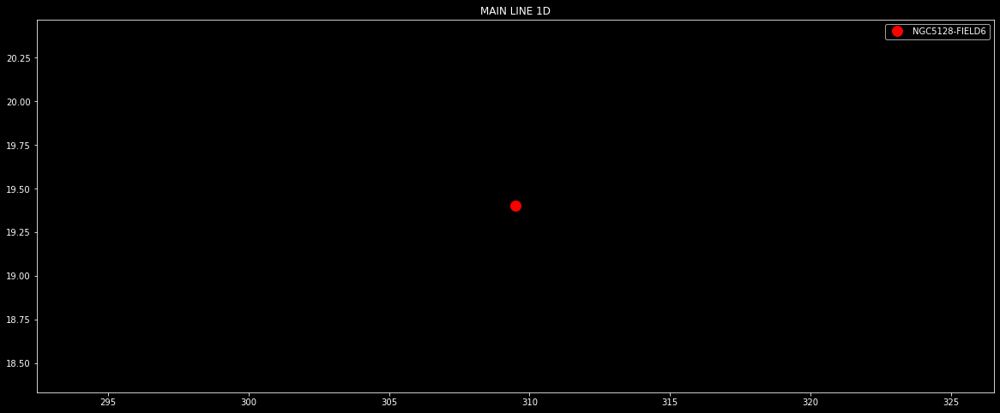

In [103]:
plt.figure(figsize=(20,8))
plt.plot(CENTAURUS_A_CSV_DOC[GAL_LON_NAME],CENTAURUS_A_CSV_DOC[GAL_LAT_NAME],color="red",marker='o',linestyle='None',markersize=12,label=CENTAURUS_A_reading[0].header["TARGNAME"])
plt.title("MAIN LINE 1D")
plt.legend(prop=dict(size=10))
plt.show()

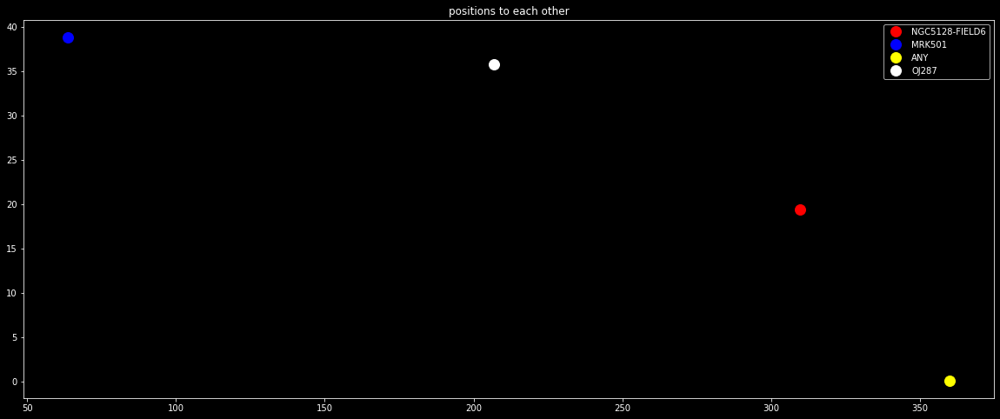

In [104]:
plt.figure(figsize=(20,8))
plt.plot(CENTAURUS_A_CSV_DOC[GAL_LON_NAME],CENTAURUS_A_CSV_DOC[GAL_LAT_NAME],color="red",marker='o',linestyle='None',markersize=12,label=CENTAURUS_A_reading[0].header["TARGNAME"])
plt.plot(MARKARIAN_CSV_DOC[GAL_LON_NAME],MARKARIAN_CSV_DOC[GAL_LAT_NAME],color="blue",marker='o',linestyle='None',markersize=12,label=MARKARIAN_reading[0].header["TARGNAME"])
plt.plot(SAGITTARIUS_A_CSV_DOC[GAL_LON_NAME],SAGITTARIUS_A_CSV_DOC[GAL_LAT_NAME],color="yellow",marker='o',linestyle='None',markersize=12,label=SAGITTARIUS_A_reading[0].header["TARGNAME"])
plt.plot(OJ287_CSV_DOC[GAL_LON_NAME],OJ287_CSV_DOC[GAL_LAT_NAME],color="white",marker='o',linestyle='None',markersize=12,label=OJ287_reading[0].header["TARGNAME"])
plt.title("positions to each other")
plt.legend(prop=dict(size=10))
plt.show()

No handles with labels found to put in legend.


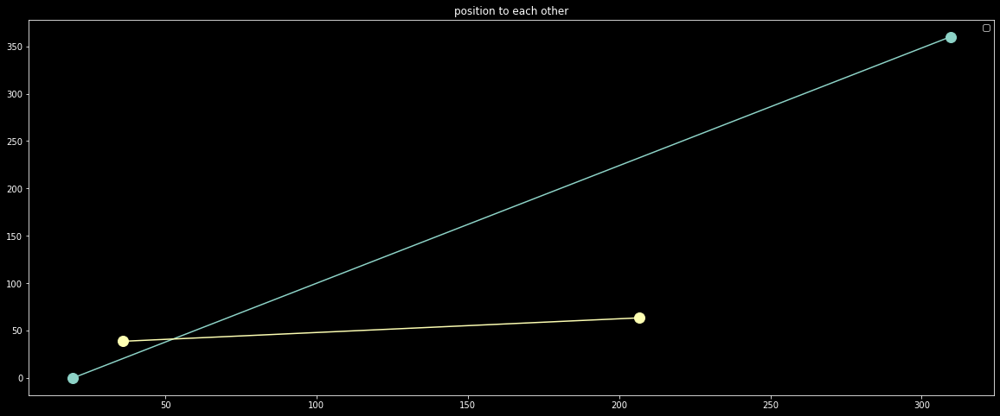

In [105]:
x1,y1=[CENTAURUS_A_CSV_DOC[GAL_LON_NAME],CENTAURUS_A_CSV_DOC[GAL_LAT_NAME]],[SAGITTARIUS_A_CSV_DOC[GAL_LON_NAME],SAGITTARIUS_A_CSV_DOC[GAL_LAT_NAME]]
x2,y2=[OJ287_CSV_DOC[GAL_LON_NAME],OJ287_CSV_DOC[GAL_LAT_NAME]],[MARKARIAN_CSV_DOC[GAL_LON_NAME],MARKARIAN_CSV_DOC[GAL_LAT_NAME]]
plt.figure(figsize=(20,8))
plt.plot(x1,y1,x2,y2,marker='o',markersize=12)
plt.title("position to each other")
plt.legend(prop=dict(size=10))
plt.show()

In [106]:
print(CENTAURUS_A_reading[0].header["TARGNAME"])
print(OJ287_reading[0].header["TARGNAME"])
print(MARKARIAN_reading[0].header["TARGNAME"])
print(SAGITTARIUS_A_reading[0].header["TARGNAME"])

NGC5128-FIELD6
OJ287
MRK501
ANY


CENTAURUS A
Constellation Centaurus
Right ascension 13h 25m 27.6s
Declination −43° 01′ 09″
Redshift 547 ± 5 km/s
Distance 10–16 Mly (3–5 Mpc)
Apparent magnitude (V) 6.84

Type S0 pec or Ep

Size 60,000 ly
Apparent size (V) 25'.7 × 20'.0
12 million light years


MARKARIAN

Constellation Hercules
Right ascension 16h 53m 52.21s
Declination 39° 45′ 37.6″
Redshift 9915±25 km/s or 0.033640 Z
Distance 456 Mly (140 Mpc; 4.32x1024 m)
Group or cluster zw1707.6+4045

Type S0 [2]

Size ~210,000 ly (64 kpc) (estimated)
Apparent size (V) 94.86" × 71.1
456 million light years



SAGITTARIUS

Constellation Sagittarius

Right ascension 17h 45m 40.0409s

Declination −29° 0′ 28.118″

Mass (4.154±0.014)×106

Distance 26673±42 ly (8178±13 pc)

26.000 light years

OJ287
Constellation Cancer

Right ascension 08h 54m 48.9s

Declination +20° 06′ 31

Redshift 0.306000

Distance 3.5 Gly (1.073 Gpc)

Type BL Lac

Apparent magnitude (V) 15.43

3.5 billion lights years


LIGHT INTENSITY
1 LIGHT YEAR (LY) -- 9.46 * 10 ** 12km / 9.460.730.472.580 km

In [107]:
#for light years
CENTAURUS_A_Light_Intensity=1/12*10**6
MARKARIAN_Light_Intensity=1/456*10**6
SAGITTARIUS_Light_Intensity=1/26000
OJ287_Light_Intensity=1/3*10**9+5*10**8

In [108]:
print("CENTAURUS: ",CENTAURUS_A_Light_Intensity)
print("MARKARIAN: ",MARKARIAN_Light_Intensity)
print("SAGITTARIUS: ",SAGITTARIUS_Light_Intensity)
print("OJ287: ",OJ287_Light_Intensity)

Total_Light_Intensity = [CENTAURUS_A_Light_Intensity,MARKARIAN_Light_Intensity,SAGITTARIUS_Light_Intensity,OJ287_Light_Intensity]
Total_Light_Intensity = sorted(Total_Light_Intensity)

print("\n")
print(Total_Light_Intensity)

CENTAURUS:  83333.33333333333
MARKARIAN:  2192.9824561403507
SAGITTARIUS:  3.846153846153846e-05
OJ287:  833333333.3333333


[3.846153846153846e-05, 2192.9824561403507, 83333.33333333333, 833333333.3333333]


In [110]:
CENTAURUS_A_Light_Intensity_km=1/(12*10**6)*9460730472580
MARKARIAN_Light_Intensity_km=1/(456*10**6)*9460730472580
SAGITTARIUS_Light_Intensity_km=1/(26000)*9.46*9460730472580
OJ287_Light_Intensity_km=1/(3*10**9+5*10**8)*9460730472580

In [111]:
print("CENTAURUS: ",CENTAURUS_A_Light_Intensity_km)
print("MARKARIAN: ",MARKARIAN_Light_Intensity_km)
print("SAGITTARIUS: ",SAGITTARIUS_Light_Intensity_km)
print("OJ287: ",OJ287_Light_Intensity_km)

Total_Light_Intensity_KM = [CENTAURUS_A_Light_Intensity_km,MARKARIAN_Light_Intensity_km,SAGITTARIUS_Light_Intensity_km,OJ287_Light_Intensity_km]
Total_Light_Intensity_KM = sorted(Total_Light_Intensity_KM)

print("\n")
print(Total_Light_Intensity_KM)

CENTAURUS:  788394.2060483334
MARKARIAN:  20747.215948640354
SAGITTARIUS:  3442250395.023339
OJ287:  2703.0658493085716


[2703.0658493085716, 20747.215948640354, 788394.2060483334, 3442250395.023339]


As the distance increases, the light intensity decreases, in this way the distance of the objects can be found.


Fundamental unit of distance in Astronomy

"A star with a parallax of 1 arcsecond has a distance of 1 Parsec."
1 parsec (pc) is equivalent to:
206,265 AU

3.26 Light Years

3.086x1013 km

1 light year (ly) is equivalent to:
0.31 pc

63,270 AU

In [112]:
CENTAURUS_A_Distance_KNOWN = 12 * 10 ** 6
MARKARIAN_Light_Distance_KNOWN = 456 * 10 ** 6
SAGITTARIUS_Light_Distance_KNOWN = 26000
OJ287_Light_Distance_KNOWN = 3 * 10 ** 9 + 5 * 10 ** 8

In [113]:
# The star alpha Centauri has a parallax of p = 0.742 - arcsec
centauri_distance=1/0.742
centauri_distance_for_light_year=(1/0.742)/0.31

# A star is measured to have a parallax of p = 0.02 - arcsec
random_STAR_distance_for_example=1/0.02
random_STAR_distance_for_light_year=(1/0.02)/0.31

In [114]:
print("aplha centauri/distance as pc:",centauri_distance)
print("alpha centauri/distance as light year:",centauri_distance_for_light_year)

aplha centauri/distance as pc: 1.3477088948787062
alpha centauri/distance as light year: 4.347448047995826


In [115]:
print("random star/distance as pc:",random_STAR_distance_for_example)
print("random star/distance as light year:",random_STAR_distance_for_light_year)

random star/distance as pc: 50.0
random star/distance as light year: 161.29032258064515


TO DATAFRAME

In [37]:
general_fits_path=Path("./NEAR THE BLACK HOLE")

In [38]:
fits_Path=list(general_fits_path.glob(r"**/*.fits"))
Path_Series=pd.Series(fits_Path,name="PATH").astype(str)


new_path_list=[]
new_label_list=[]
for path_x,label_x in zip(Path_Series.values,Path_Series.values):
    Splitting_list=os.path.split(label_x)
    label_splitting=os.path.split(Splitting_list[0])
    target_label=os.path.split(label_splitting[0])
    
    new_path_list.append(path_x)
    new_label_list.append(target_label[1])
    
Path_Series=pd.Series(new_path_list,name="PATH").astype(str)
Label_Series=pd.Series(new_label_list,name="BLACK_HOLES")
Main_Data=pd.concat([Path_Series,Label_Series],axis=1)

In [39]:
Main_Data

,PATH,BLACK_HOLES
0,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_0598...,3C273
1,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\iby84001...,3C273
2,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\j8cw08n4...,3C273
3,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\HST\u6ei...,HST
4,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\HST\u6ei...,HST
...,...,...
168,NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\o4d30...,SOMBRERO
169,NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...,HST
170,NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...,HST
171,NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\HST\x...,HST


In [40]:
Main_Data=Main_Data[Main_Data["BLACK_HOLES"]!="HST"]
Main_Data=Main_Data.reset_index(drop=True)

In [41]:
Main_Data

,PATH,BLACK_HOLES
0,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_0598...,3C273
1,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\iby84001...,3C273
2,NEAR THE BLACK HOLE\3C273\HST-OPTICAL\j8cw08n4...,3C273
3,NEAR THE BLACK HOLE\CENTAURUS-A\HST-OPTICAL\hs...,CENTAURUS-A
4,NEAR THE BLACK HOLE\CENTAURUS-A\HST-OPTICAL\hs...,CENTAURUS-A
5,NEAR THE BLACK HOLE\CENTAURUS-A\HST-OPTICAL\hs...,CENTAURUS-A
6,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj01s4...,H1821
7,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj02oq...,H1821
8,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj03bt...,H1821
9,NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj53rx...,H1821


SPLITTING FOR TYPES

In [42]:
# MARKARIAN_Data=main_data[main_data["BLACK_HOLES"]=="MARKARIAN"]
MARKARIAN_Data=Main_Data[Main_Data["BLACK_HOLES"]=="MARKARIAN"]
NGC4151_Data=Main_Data[Main_Data["BLACK_HOLES"]=="NGC4151"]
G_3C273_Data=Main_Data[Main_Data["BLACK_HOLES"]=="3C273"]
IC1101_Data=Main_Data[Main_Data["BLACK_HOLES"]=="IC1101"]
MESSIER87_Data=Main_Data[Main_Data["BLACK_HOLES"]=="MESSIER87"]
OJ287_Data=Main_Data[Main_Data["BLACK_HOLES"]=="OJ287"]
MESSIER106_Data=Main_Data[Main_Data["BLACK_HOLES"]=="MESSIER106"]
H1821_Data=Main_Data[Main_Data["BLACK_HOLES"]=="H1821"]
CENTAURUS_A_Data=Main_Data[Main_Data["BLACK_HOLES"]=="CENTAURUS-A"]
SOMBRERO_Data=Main_Data[Main_Data["BLACK_HOLES"]=="SOMBRERO"]
SAGITTARIUS_A_Data=Main_Data[Main_Data["BLACK_HOLES"]=="SAGITTARIUS-A"]

MARKARIAN_Data=MARKARIAN_Data.reset_index(drop=True)
NGC4151_Data=NGC4151_Data.reset_index(drop=True)
G_3C273_Data = G_3C273_Data.reset_index(drop=True)
IC1101_Data = IC1101_Data.reset_index(drop=True)
OJ287_Data = OJ287_Data.reset_index(drop=True)
MESSIER106_Data = MESSIER106_Data.reset_index(drop=True)
H1821_Data = H1821_Data.reset_index(drop=True)
CENTAURUS_A_Data = CENTAURUS_A_Data.reset_index(drop=True)
SOMBRERO_Data = SOMBRERO_Data.reset_index(drop=True)
SAGITTARIUS_A_Data = SAGITTARIUS_A_Data.reset_index(drop=True)

In [43]:
print(MARKARIAN_Data.head())
print("---"*10)
print(NGC4151_Data.head())
print("---"*10)
print(G_3C273_Data.head())
print("---"*10)
print(IC1101_Data.head())
print("---"*10)
print(OJ287_Data.head())
print("---"*10)
print(MESSIER106_Data.head())
print("---"*10)
print(CENTAURUS_A_Data.head())
print("---"*10)
print(H1821_Data.head())
print("---"*10)
print(SOMBRERO_Data.head())
print("---"*10)
print(SAGITTARIUS_A_Data.head())
print("---"*10)

                                                PATH BLACK_HOLES
0  NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_...   MARKARIAN
1  NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_...   MARKARIAN
2  NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_...   MARKARIAN
3  NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_...   MARKARIAN
------------------------------
                                                PATH BLACK_HOLES
0  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\n4hk18...     NGC4151
1  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42302...     NGC4151
2  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o42304...     NGC4151
3  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o4qa04...     NGC4151
4  NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\o59701...     NGC4151
------------------------------
                                                PATH BLACK_HOLES
0  NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_0598...       3C273
1  NEAR THE BLACK HOLE\3C273\HST-OPTICAL\iby84001...       3C273
2  NEAR THE BLACK HOLE\3C273

In [44]:
MARKARIAN_Hole = MARKARIAN_Data["PATH"][2]
NGC4151_Hole = NGC4151_Data["PATH"][0]
G_3C273_Hole = G_3C273_Data["PATH"][0]
IC1101_Hole = IC1101_Data["PATH"][1]
OJ287_Hole = OJ287_Data["PATH"][1]
MESSIER106_Hole = MESSIER106_Data["PATH"][0]
CENTAURUS_A_Hole = CENTAURUS_A_Data["PATH"][1]
H1821_Hole = H1821_Data["PATH"][0]
SOMBRERO_Hole = SOMBRERO_Data["PATH"][0]
SAGITTARIUS_A_Hole = SAGITTARIUS_A_Data["PATH"][1]

In [45]:
print("PATH:\n")
print(MARKARIAN_Hole) #HST EXT
print("---"*10)
print("PATH:\n")
print(NGC4151_Hole)
print("---"*10)
print("PATH:\n")
print(G_3C273_Hole)
print("---"*10)
print("PATH:\n")
print(IC1101_Hole)
print("---"*10)
print("PATH:\n")
print(OJ287_Hole) #HST EXT
print("---"*10)
print("PATH:\n")
print(MESSIER106_Hole)
print("---"*10)
print("PATH:\n")
print(CENTAURUS_A_Hole) #HST EXT
print("---"*10)
print("PATH:\n")
print(H1821_Hole)
print("---"*10)
print("PATH:\n")
print(SOMBRERO_Hole)
print("---"*10)
print("PATH:\n")
print(SAGITTARIUS_A_Hole) #HST EXT
print("---"*10)

PATH:

NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_06363_86_wfpc2_total_pc_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\n4hk18010_mos.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\3C273\HST-OPTICAL\hst_05980_01_wfpc2_total_pc_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\IC1101\HST-UV\hst_11980_06_acs_sbc_f150lp_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\OJ287\HST-OPTICAL\hst_05992_06_wfpc2_f814w_pc_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\MESSIER106\HST-OPTICAL\j8l003030_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\CENTAURUS-A\HST-OPTICAL\hst_06789_a1_wfpc2_f555w_pc_drz.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\H1821\HST-OPTICAL\odmj01s4q_raw.fits
------------------------------
PATH:

NEAR THE BLACK HOLE\SOMBRERO\HST-OPTICAL\hst_9454_14_acs_hrc_f330w_drz.fits
------------------------------
PATH:

NEAR THE BLACK H

In [46]:
#reading and information

MARKARIAN_Reading = fits.open(MARKARIAN_Hole)
NGC4151_Reading = fits.open(NGC4151_Hole)
G_3C273_Reading = fits.open(G_3C273_Hole)
IC1101_Reading = fits.open(IC1101_Hole)
OJ287_Reading = fits.open(OJ287_Hole)
MESSIER106_Reading = fits.open(MESSIER106_Hole)
CENTAURUS_A_Reading = fits.open(CENTAURUS_A_Hole)
H1821_Reading = fits.open(H1821_Hole)
SOMBRERO_Reading = fits.open(SOMBRERO_Hole)
SAGITTARIUS_A_Reading = fits.open(SAGITTARIUS_A_Hole)

In [47]:
print("INFORMATION\n")
print(MARKARIAN_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(NGC4151_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(G_3C273_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(IC1101_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(OJ287_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(MESSIER106_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(CENTAURUS_A_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(H1821_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(SOMBRERO_Reading.info())
print("---"*10,"\n")
print("INFORMATION\n")
print(SAGITTARIUS_A_Reading.info())
print("---"*10,"\n")

INFORMATION

Filename: NEAR THE BLACK HOLE\MARKARIAN\HST-OPTICAL\hst_06363_86_wfpc2_total_pc_drz.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     402   ()      
  1  SCI           1 ImageHDU       110   (900, 900)   float32   
  2  WHT           1 ImageHDU       130   (900, 900)   float32   
  3  CTX           1 ImageHDU       129   (900, 900)   int32   
None
------------------------------ 

INFORMATION

Filename: NEAR THE BLACK HOLE\NGC4151\HST-OPTICAL\n4hk18010_mos.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     323   ()      
  1  SCI           1 ImageHDU       143   (268, 268)   float32   
  2  ERR           1 ImageHDU        71   (268, 268)   float32   
  3  DQ            1 ImageHDU        71   (268, 268)   int16   
  4  SAMP          1 ImageHDU        71   (268, 268)   int16   
  5  TIME          1 ImageHDU        71   (268, 268)   float32   
None
-------------------------

None
------------------------------ 



ALL HAVE SCI KNOWLEDGE

IMAGE INFORMATION

In [48]:
print("INFORMATION\n")
print(MARKARIAN_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(NGC4151_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(G_3C273_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(IC1101_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(OJ287_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(MESSIER106_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(CENTAURUS_A_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(H1821_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(SOMBRERO_Reading.fileinfo("SCI"))
print("---"*10,"\n")
print("INFORMATION\n")
print(SAGITTARIUS_A_Reading.fileinfo("SCI"))
print("---"*10,"\n")

INFORMATION

{'file': <astropy.io.fits.file._File <_io.FileIO name='NEAR THE BLACK HOLE\\MARKARIAN\\HST-OPTICAL\\hst_06363_86_wfpc2_total_pc_drz.fits' mode='rb' closefd=True>>, 'filemode': 'readonly', 'hdrLoc': 34560, 'datLoc': 46080, 'datSpan': 3240000, 'filename': 'NEAR THE BLACK HOLE\\MARKARIAN\\HST-OPTICAL\\hst_06363_86_wfpc2_total_pc_drz.fits', 'resized': False}
------------------------------ 

INFORMATION

{'file': <astropy.io.fits.file._File <_io.FileIO name='NEAR THE BLACK HOLE\\NGC4151\\HST-OPTICAL\\n4hk18010_mos.fits' mode='rb' closefd=True>>, 'filemode': 'readonly', 'hdrLoc': 25920, 'datLoc': 37440, 'datSpan': 288000, 'filename': 'NEAR THE BLACK HOLE\\NGC4151\\HST-OPTICAL\\n4hk18010_mos.fits', 'resized': False}
------------------------------ 

INFORMATION

{'file': <astropy.io.fits.file._File <_io.FileIO name='NEAR THE BLACK HOLE\\3C273\\HST-OPTICAL\\hst_05980_01_wfpc2_total_pc_drz.fits' mode='rb' closefd=True>>, 'filemode': 'readonly', 'hdrLoc': 46080, 'datLoc': 57600, 'dat

In [49]:
#SCI KEYS

MARKARIAN_Reading_keys=list(MARKARIAN_Reading[1].header.keys())
print(MARKARIAN_Reading_keys)

['XTENSION', 'BITPIX', 'NAXIS', 'NAXIS1', 'NAXIS2', 'PCOUNT', 'GCOUNT', 'CRVAL1', 'CRVAL2', 'CRPIX1', 'CRPIX2', 'CD1_1', 'CD1_2', 'CD2_1', 'CD2_2', 'DATAMIN', 'DATAMAX', 'VAFACTOR', 'MIR_REVR', 'ORIENTAT', 'FILLCNT', 'ERRCNT', 'FPKTTIME', 'LPKTTIME', 'CTYPE1', 'CTYPE2', 'DETECTOR', 'DEZERO', 'BIASEVEN', 'BIASODD', 'BIASEVNU', 'BIASODDU', 'GOODMIN', 'GOODMAX', 'DATAMEAN', 'GPIXELS', 'SOFTERRS', 'CALIBDEF', 'STATICD', 'ATODSAT', 'DATALOST', 'BADPIXEL', 'OVERLAP', 'PHOTMODE', 'PHOTFLAM', 'PHOTZPT', 'PHOTPLAM', 'PHOTBW', 'MEDIAN', 'MEDSHADO', 'HISTWIDE', 'SKEWNESS', 'MEANC10', 'MEANC25', 'MEANC50', 'MEANC100', 'MEANC200', 'MEANC300', 'BACKGRND', 'ZP_CORR', 'CTE_1E2', 'CTE_1E3', 'CTE_1E4', 'EXTNAME', 'EXPNAME', 'EXTVER', 'INHERIT', 'ROOTNAME', 'OCRVAL1', 'OCRVAL2', 'OCRPIX2', 'OCRPIX1', 'ONAXIS2', 'ONAXIS1', 'OCD2_2', 'OCD2_1', 'OORIENTA', 'OCTYPE1', 'OCD1_1', 'OCD1_2', 'OCTYPE2', 'WCSCDATE', 'OCX10', 'OCX11', 'OCY10', 'OCY11', 'BUNIT', 'O_CRVAL1', 'O_CRVAL2', 'G_CRVAL1', 'G_CRVAL2', 'G_DRA

In [50]:
NGC4151_Reading_keys=list(NGC4151_Reading[1].header.keys())
print(NGC4151_Reading_keys)

['XTENSION', 'BITPIX', 'NAXIS', 'NAXIS1', 'NAXIS2', 'PCOUNT', 'GCOUNT', 'ORIGIN', 'EXTNAME', 'EXTVER', 'IRAF-TLM', 'DATAMIN', 'DATAMAX', 'DATE', 'INHERIT', 'EXPNAME', 'BUNIT', '', '', '', 'WCSAXES', 'CRPIX1', 'CRPIX2', 'CRVAL1', 'CRVAL2', 'CTYPE1', 'CTYPE2', 'CD1_1', 'CD1_2', 'CD2_1', 'CD2_2', '', '', '', 'FILLCNT', 'ERRCNT', 'PODPSFF', 'STDCFFF', 'STDCFFP', '', '', '', 'SAMPNUM', 'SAMPTIME', 'DELTATIM', 'ROUTTIME', 'TDFTRANS', '', '', '', 'ENGQUAL', 'NQUAL00', 'NQUAL01', 'NQUAL02', 'NQUAL03', 'NQUAL04', 'NQUAL05', 'NQUAL06', 'NQUAL07', 'NQUAL08', 'NQUAL09', 'NQUAL10', 'NQUAL11', 'NQUAL12', 'NQUAL13', 'NQUAL14', 'NQUAL15', 'NQUAL16', 'GOODMEAN', 'GOODMEDN', 'GOODSTDV', 'GOODMIN', 'GOODMAX', 'QAMEAN', 'QAMEDN', 'QASTDV', 'QAMIN', 'QAMAX', 'QBMEAN', 'QBMEDN', 'QBSTDV', 'QBMIN', 'QBMAX', 'QCMEAN', 'QCMEDN', 'QCSTDV', 'QCMIN', 'QCMAX', 'QDMEAN', 'QDMEDN', 'QDSTDV', 'QDMIN', 'QDMAX', 'HISTORY', 'HISTORY', 'HISTORY', 'HISTORY', 'HISTORY', 'HISTORY', 'HISTORY', 'HISTORY', 'HISTORY', 'HISTORY'

In [51]:
G_3C273_Reading_keys=list(G_3C273_Reading[1].header.keys())
IC1101_Reading_keys=list(IC1101_Reading[1].header.keys())
OJ287_Reading_keys=list(OJ287_Reading[1].header.keys())
MESSIER106_Reading_keys=list(MESSIER106_Reading[1].header.keys())
CENTAURUS_A_Reading_keys=list(CENTAURUS_A_Reading[1].header.keys())
H1821_Reading_keys=list(H1821_Reading[1].header.keys())
SOMBRERO_Reading_keys=list(SOMBRERO_Reading[1].header.keys())
SAGITTARIUS_A_Reading_keys=list(SAGITTARIUS_A_Reading[1].header.keys())

In [52]:
#sci comments functions

MARKARIAN_Comments_img=MARKARIAN_Reading[1].header
NGC4151_Comments_img=NGC4151_Reading[1].header
G_3C273_Comments_img=G_3C273_Reading[1].header
IC1101_Comments_img=IC1101_Reading[1].header
OJ287_Comments_img=OJ287_Reading[1].header
MESSIER106_Comments_img=MESSIER106_Reading[1].header
CENTAURUS_A_Comments_img=CENTAURUS_A_Reading[1].header
H1821_Comments_img=H1821_Reading[1].header
SOMBRERO_Comments_img=SOMBRERO_Reading[1].header
SAGITTARIUS_A_Comments_img=SAGITTARIUS_A_Reading[1].header

In [53]:
for x_keys in MARKARIAN_Reading_keys:
    if x_keys !=" ":
        print(x_keys)
        print(MARKARIAN_Comments_img.comments[x_keys])
        print(MARKARIAN_Reading[1].header[x_keys])
        print("---"*10)
        print("\n")

XTENSION
Image extension
IMAGE
------------------------------


BITPIX
array data type
-32
------------------------------


NAXIS
number of array dimensions
2
------------------------------


NAXIS1

900
------------------------------


NAXIS2

900
------------------------------


PCOUNT
number of parameters
0
------------------------------


GCOUNT
number of groups
1
------------------------------


CRVAL1
right ascension of reference pixel (deg)
253.4678081691667
------------------------------


CRVAL2
declination of reference pixel (deg)
39.76057920972222
------------------------------


CRPIX1
x-coordinate of reference pixel
450.0
------------------------------


CRPIX2
y-coordinate of reference pixel
450.0
------------------------------


CD1_1
partial of the right ascension w.r.t. x
-1.388888888888889e-05
------------------------------


CD1_2
partial of the right ascension w.r.t. y
0.0
------------------------------


CD2_1
partial of the declination w.r.t. x
0.0
---------------

In [54]:
MARKARIAN_Comments = MARKARIAN_Reading[0].header
NGC4151_Comments = NGC4151_Reading[0].header
G_3C273_Comments = G_3C273_Reading[0].header
IC1101_Comments = IC1101_Reading[0].header
OJ287_Comments = OJ287_Reading[0].header
MESSIER106_Comments = MESSIER106_Reading[0].header
CENTAURUS_A_Comments = CENTAURUS_A_Reading[0].header
H1821_Comments = H1821_Reading[0].header
SOMBRERO_Comments = SOMBRERO_Reading[0].header
SAGITTARIUS_A_Comments = SAGITTARIUS_A_Reading[0].header

In [55]:
MARKARIAN_Reading_H=list(MARKARIAN_Reading[0].header.keys())
NGC4151_Reading_H=list(NGC4151_Reading[0].header.keys())
G_3C273_Reading_H=list(G_3C273_Reading[0].header.keys())
IC1101_Reading_H=list(IC1101_Reading[0].header.keys())
OJ287_Reading_H=list(OJ287_Reading[0].header.keys())
MESSIER106_Reading_H=list(MESSIER106_Reading[0].header.keys())
CENTAURUS_A_Reading_H=list(CENTAURUS_A_Reading[0].header.keys())
H1821_Reading_H=list(H1821_Reading[0].header.keys())
SOMBRERO_Reading_H=list(SOMBRERO_Reading[0].header.keys())
SAGITTARIUS_A_Reading_H=list(SAGITTARIUS_A_Reading[0].header.keys())

In [56]:
primary_keys_list=[MARKARIAN_Reading_H,NGC4151_Reading_H,G_3C273_Reading_H,IC1101_Reading_H,OJ287_Reading_H,MESSIER106_Reading_H,CENTAURUS_A_Reading_H,H1821_Reading_H,SOMBRERO_Reading_H,SAGITTARIUS_A_Reading_H]

In [57]:
SCI_Keys_List=[MARKARIAN_Reading_keys,NGC4151_Reading_keys,G_3C273_Reading_keys,IC1101_Reading_keys,OJ287_Reading_keys,MESSIER106_Reading_keys,CENTAURUS_A_Reading_keys,H1821_Reading_keys,SOMBRERO_Reading_keys,SAGITTARIUS_A_Reading_keys]

In [58]:
primary_main_keys=[]
primary_different_keys=[]

for params in primary_keys_list:
    for x_params in params:
        if x_params in SAGITTARIUS_A_Reading_H and x_params!=" ":
            primary_main_keys.append(x_params)
        else:
            primary_different_keys.append(x_params)
primary_main_keys=[i for j , i in enumerate(primary_main_keys) if i not in primary_main_keys[:j]]

In [59]:
len(primary_main_keys)

374

In [60]:
print(primary_main_keys[:10])

['SIMPLE', 'BITPIX', 'NAXIS', 'EXTEND', 'DATE', 'FILETYPE', '', 'TELESCOP', 'INSTRUME', 'EQUINOX']


In [61]:
sci_common_list=[]
sci_another_list=[]
for params in SCI_Keys_List:
    for x_params in params:
        if x_params in SAGITTARIUS_A_Reading_keys and x_params!=" ":
            sci_common_list.append(x_params)
        else:
            sci_another_list.append(x_params)
sci_common_list=[i for j , i in enumerate(sci_common_list)if i not in sci_common_list[:j]]

In [62]:
len(sci_common_list)

103

In [63]:
with open("PRIMARYKEYS.txt","w") as output_saving:
    output_saving.write(str(primary_main_keys))

In [64]:
with open("SCIKEYS.txt","w")as output_saving_sci:
    output_saving_sci.write(str(sci_common_list))

In [65]:
comment_sci=[]
comment_sci_keys=[]
for comments_x_sci in sci_common_list:
    if comments_x_sci!=" ":
        comment_output=MARKARIAN_Comments_img.comments[comments_x_sci]
        if comment_output!=" ":
            comment_sci.append(comment_output)
            comment_sci_keys.append(comments_x_sci)


In [66]:
ZIP_SCI=zip(comment_sci_keys,comment_sci)
SCI_Dict=dict(ZIP_SCI)
SCI_Dict

{'XTENSION': 'Image extension',
 'BITPIX': 'array data type',
 'NAXIS': 'number of array dimensions',
 'NAXIS1': '',
 'NAXIS2': '',
 'PCOUNT': 'number of parameters',
 'GCOUNT': 'number of groups',
 'CRVAL1': 'right ascension of reference pixel (deg)',
 'CRVAL2': 'declination of reference pixel (deg)',
 'CRPIX1': 'x-coordinate of reference pixel',
 'CRPIX2': 'y-coordinate of reference pixel',
 'CD1_1': 'partial of the right ascension w.r.t. x',
 'CD1_2': 'partial of the right ascension w.r.t. y',
 'CD2_1': 'partial of the declination w.r.t. x',
 'CD2_2': 'partial of the declination w.r.t. y',
 'DATAMIN': 'minimum value of the data',
 'DATAMAX': 'maximum value of the data',
 'VAFACTOR': 'velocity aberration plate scale factor',
 'MIR_REVR': 'is the image mirror reversed?',
 'ORIENTAT': 'orientation of the image (deg)',
 'FILLCNT': 'number of segments containing fill',
 'ERRCNT': 'number of segments containing errors',
 'FPKTTIME': 'time of the first packet (Modified Julian Date)',
 'LPK

In [67]:
with open("DICT_SCI.txt","w")as output_saving_sci:
    output_saving_sci.write(str(SCI_Dict))

In [68]:
comment_primary=[]
comment_primary_keys=[]
for comments_x_primary in primary_main_keys:
    if comments_x_primary!=" ":
        comment_output=SAGITTARIUS_A_Comments.comments[comments_x_primary]
        if comment_output!=" ":
            comment_primary.append(comment_output)
            comment_primary_keys.append(comments_x_primary)

In [69]:
ZIP_Primary=zip(comment_primary_keys,comment_primary)
Primary_Dict=dict(ZIP_Primary)
Primary_Dict

{'SIMPLE': 'conforms to FITS standard',
 'BITPIX': 'array data type',
 'NAXIS': 'number of array dimensions',
 'EXTEND': '',
 'DATE': 'date this file was written (yyyy-mm-dd)',
 'FILETYPE': 'type of data found in data file',
 '': '',
 'TELESCOP': 'telescope used to acquire data',
 'INSTRUME': 'identifier for instrument used to acquire data',
 'EQUINOX': 'equinox of celestial coord. system',
 'ROOTNAME': 'rootname of the observation set',
 'PROCTIME': 'Pipeline processing time (MJD)',
 'OPUS_VER': 'OPUS software system version number',
 'CAL_VER': 'CALWP2 code version',
 'MODE': 'instr. mode: FULL (full res.), AREA (area int.)',
 'SERIALS': 'serial clocks: ON, OFF',
 'IMAGETYP': 'DARK/BIAS/IFLAT/UFLAT/VFLAT/KSPOT/EXT/ECAL',
 'CDBSFILE': 'GENERIC/BIAS/DARK/PREF/FLAT/MASK/ATOD/NO',
 'PKTFMT': 'packet format code',
 'FILTNAM1': 'first filter name',
 'FILTNAM2': 'second filter name',
 'FILTER1': 'first filter number (0-48)',
 'FILTER2': 'second filter number (0-48)',
 'FILTROT': 'partial fi

In [70]:
for x_primarykeys in MARKARIAN_Reading_H:
    if x_primarykeys!=" ":
        print(x_primarykeys)
        print(MARKARIAN_Comments.comments[x_primarykeys])
        print(MARKARIAN_Reading[0].header[x_primarykeys])
        print("---"*10)

SIMPLE
conforms to FITS standard
True
------------------------------
BITPIX
array data type
8
------------------------------
NAXIS
number of array dimensions
0
------------------------------
EXTEND

True
------------------------------
DATE
date this file was written (yyyy-mm-dd)
2009-11-05
------------------------------
FILETYPE
type of data found in data file
SCI
------------------------------




      / WFPC-II DATA DESCRIPTOR KEYWORDS


      / SCIENCE INSTRUMENT CONFIGURATION


      / IMAGE TYPE CHARACTERISTICS


      / FILTER CONFIGURATION


      / ARCHIVE SEARCH KEYWORDS


      / INSTRUMENT STATUS USED IN DATA PROCESSING


      / RSDP CONTROL KEYWORDS


      / CALIBRATION REFERENCE FILES


      / DEFAULT KEYWORDS SET BY STSCI


      / READOUT DURATION INFORMATION


      / PLANETARY SCIENCE KEYWORDS


      / PODPS FILL VALUES


      / EXPOSURE TIME AND RELATED INFORMATION


      / EXPOSURE INFORMATION



      / TARGET & PROPOSAL ID



      / OTFR KEYWORDS


      / 

In [71]:
with open("DICT_PRIMARY.txt","w") as output_saving_primary:
    output_saving_primary.write(str(Primary_Dict))

Access image

In [72]:
MARKARIAN_IMG_1=MARKARIAN_Reading[1].data
MARKARIAN_IMG_2=MARKARIAN_Reading[2].data
MARKARIAN_IMG_3=MARKARIAN_Reading[3].data

NGC4151_IMG_1=NGC4151_Reading[1].data
NGC4151_IMG_2=NGC4151_Reading[3].data
NGC4151_IMG_3=NGC4151_Reading[4].data

G_3C273_IMG_1=G_3C273_Reading[1].data
G_3C273_IMG_2=G_3C273_Reading[2].data
G_3C273_IMG_3=G_3C273_Reading[3].data

IC1101_IMG_1=IC1101_Reading[1].data
IC1101_IMG_2=IC1101_Reading[2].data
IC1101_IMG_3=IC1101_Reading[3].data

OJ287_IMG_1=OJ287_Reading[1].data
OJ287_IMG_2=OJ287_Reading[2].data
OJ287_IMG_3=OJ287_Reading[3].data

MESSIER106_IMG_1=MESSIER106_Reading[1].data
MESSIER106_IMG_2=MESSIER106_Reading[2].data
MESSIER106_IMG_3=MESSIER106_Reading[3].data

CENTAURUS_A_IMG_1=CENTAURUS_A_Reading[1].data
CENTAURUS_A_IMG_2=CENTAURUS_A_Reading[2].data
CENTAURUS_A_IMG_3=CENTAURUS_A_Reading[3].data

H1821_IMG_1=H1821_Reading[1].data
H1821_IMG_2=H1821_Reading[4].data
H1821_IMG_3=H1821_Reading[7].data

SOMBRERO_IMG_1=SOMBRERO_Reading[2].data
SOMBRERO_IMG_2=SOMBRERO_Reading[3].data
SOMBRERO_IMG_3=SOMBRERO_Reading[5].data

SAGITTARIUS_A_IMG_1=SAGITTARIUS_A_Reading[1].data
SAGITTARIUS_A_IMG_2=SAGITTARIUS_A_Reading[2].data
SAGITTARIUS_A_IMG_3=SAGITTARIUS_A_Reading[3].data

In [73]:
print("MARKARIAN_IMG_1 SHAPE. ",MARKARIAN_IMG_1.shape)
print("MARKARIAN_IMG_2 SHAPE. ",MARKARIAN_IMG_2.shape)
print("MARKARIAN_IMG_3 SHAPE. ",MARKARIAN_IMG_3.shape)
print("\n")
print("NGC4151_IMG_1 SHAPE. ",NGC4151_IMG_1.shape)
print("NGC4151_IMG_2 SHAPE. ",NGC4151_IMG_2.shape)
print("NGC4151_IMG_3 SHAPE. ",NGC4151_IMG_3.shape)
print("\n")
print("G_3C273_IMG_1 SHAPE. ",G_3C273_IMG_1.shape)
print("G_3C273_IMG_2 SHAPE. ",G_3C273_IMG_2.shape)
print("G_3C273_IMG_3 SHAPE. ",G_3C273_IMG_3.shape)
print("\n")
print("IC1101_IMG_1 SHAPE. ",IC1101_IMG_1.shape)
print("IC1101_IMG_2 SHAPE. ",IC1101_IMG_2.shape)
print("IC1101_IMG_3 SHAPE. ",IC1101_IMG_3.shape)
print("\n")
print("OJ287_IMG_1 SHAPE. ",OJ287_IMG_1.shape)
print("OJ287_IMG_2 SHAPE. ",OJ287_IMG_2.shape)
print("OJ287_IMG_3 SHAPE. ",OJ287_IMG_3.shape)
print("\n")
print("MESSIER106_IMG_1 SHAPE. ",MESSIER106_IMG_1.shape)
print("MESSIER106_IMG_2 SHAPE. ",MESSIER106_IMG_2.shape)
print("MESSIER106_IMG_3 SHAPE. ",MESSIER106_IMG_3.shape)
print("\n")
print("CENTAURUS_A_IMG_1 SHAPE. ",CENTAURUS_A_IMG_1.shape)
print("CENTAURUS_A_IMG_2 SHAPE. ",CENTAURUS_A_IMG_2.shape)
print("CENTAURUS_A_IMG_3 SHAPE. ",CENTAURUS_A_IMG_3.shape)
print("\n")
print("H1821_IMG_1 SHAPE. ",H1821_IMG_1.shape)
print("H1821_IMG_2 SHAPE. ",H1821_IMG_2.shape)
print("H1821_IMG_3 SHAPE. ",H1821_IMG_3.shape)
print("\n")
print("SAGITTARIUS_A_IMG_1 SHAPE. ",SAGITTARIUS_A_IMG_1.shape)
print("SAGITTARIUS_A_IMG_2 SHAPE. ",SAGITTARIUS_A_IMG_2.shape)
print("SAGITTARIUS_A_IMG_3 SHAPE. ",SAGITTARIUS_A_IMG_3.shape)
print("\n")
print("SOMBRERO_IMG_1 SHAPE. ",SOMBRERO_IMG_1.shape)
print("SOMBRERO_IMG_2 SHAPE. ",SOMBRERO_IMG_2.shape)
print("SOMBRERO_IMG_3 SHAPE. ",SOMBRERO_IMG_3.shape)

MARKARIAN_IMG_1 SHAPE.  (900, 900)
MARKARIAN_IMG_2 SHAPE.  (900, 900)
MARKARIAN_IMG_3 SHAPE.  (900, 900)


NGC4151_IMG_1 SHAPE.  (268, 268)
NGC4151_IMG_2 SHAPE.  (268, 268)
NGC4151_IMG_3 SHAPE.  (268, 268)


G_3C273_IMG_1 SHAPE.  (1050, 1050)
G_3C273_IMG_2 SHAPE.  (1050, 1050)
G_3C273_IMG_3 SHAPE.  (1050, 1050)


IC1101_IMG_1 SHAPE.  (1344, 1329)
IC1101_IMG_2 SHAPE.  (1344, 1329)
IC1101_IMG_3 SHAPE.  (1344, 1329)


OJ287_IMG_1 SHAPE.  (1050, 1050)
OJ287_IMG_2 SHAPE.  (1050, 1050)
OJ287_IMG_3 SHAPE.  (1050, 1050)


MESSIER106_IMG_1 SHAPE.  (1146, 1238)
MESSIER106_IMG_2 SHAPE.  (1146, 1238)
MESSIER106_IMG_3 SHAPE.  (1146, 1238)


CENTAURUS_A_IMG_1 SHAPE.  (3350, 3350)
CENTAURUS_A_IMG_2 SHAPE.  (3350, 3350)
CENTAURUS_A_IMG_3 SHAPE.  (3350, 3350)


H1821_IMG_1 SHAPE.  (100, 100)
H1821_IMG_2 SHAPE.  (100, 100)
H1821_IMG_3 SHAPE.  (30, 30)


SAGITTARIUS_A_IMG_1 SHAPE.  (2150, 2150)
SAGITTARIUS_A_IMG_2 SHAPE.  (2150, 2150)
SAGITTARIUS_A_IMG_3 SHAPE.  (2150, 2150)


SOMBRERO_IMG_1 SHAPE.  (159

FLATTEN TYPE FOR PLOTS

In [74]:
MARKARIAN_IMG_1_Flatten = MARKARIAN_IMG_1.flatten()
MARKARIAN_IMG_2_Flatten  = MARKARIAN_IMG_2.flatten()
MARKARIAN_IMG_3_Flatten = MARKARIAN_IMG_3.flatten()

NGC4151_IMG_1_Flatten = NGC4151_IMG_1.flatten()
NGC4151_IMG_2_Flatten = NGC4151_IMG_2.flatten()
NGC4151_IMG_3_Flatten = NGC4151_IMG_3.flatten()

G_3C273_IMG_1_Flatten = G_3C273_IMG_1.flatten()
G_3C273_IMG_2_Flatten = G_3C273_IMG_2.flatten()
G_3C273_IMG_3_Flatten = G_3C273_IMG_3.flatten()

IC1101_IMG_1_Flatten = IC1101_IMG_1.flatten()
IC1101_IMG_2_Flatten = IC1101_IMG_2.flatten()
IC1101_IMG_3_Flatten = IC1101_IMG_3.flatten()

OJ287_IMG_1_Flatten = OJ287_IMG_1.flatten()
OJ287_IMG_2_Flatten = OJ287_IMG_2.flatten()
OJ287_IMG_3_Flatten = OJ287_IMG_3.flatten()

MESSIER106_IMG_1_Flatten = MESSIER106_IMG_1.flatten()
MESSIER106_IMG_2_Flatten = MESSIER106_IMG_2.flatten()
MESSIER106_IMG_3_Flatten = MESSIER106_IMG_3.flatten()

CENTAURUS_A_IMG_1_Flatten = CENTAURUS_A_IMG_1.flatten()
CENTAURUS_A_IMG_2_Flatten = CENTAURUS_A_IMG_2.flatten()
CENTAURUS_A_IMG_3_Flatten = CENTAURUS_A_IMG_3.flatten()

H1821_IMG_1_Flatten = H1821_IMG_1.flatten()
H1821_IMG_2_Flatten = H1821_IMG_2.flatten()
H1821_IMG_3_Flatten = H1821_IMG_3.flatten()

SAGITTARIUS_A_IMG_1_Flatten = SAGITTARIUS_A_IMG_1.flatten()
SAGITTARIUS_A_IMG_2_Flatten = SAGITTARIUS_A_IMG_2.flatten()
SAGITTARIUS_A_IMG_3_Flatten = SAGITTARIUS_A_IMG_3.flatten()

SOMBRERO_IMG_1_Flatten = SOMBRERO_IMG_1.flatten()
SOMBRERO_IMG_2_Flatten = SOMBRERO_IMG_2.flatten()
SOMBRERO_IMG_3_Flatten = SOMBRERO_IMG_3.flatten()

VISION METHOD

In [75]:
plt.style.use("dark_background")

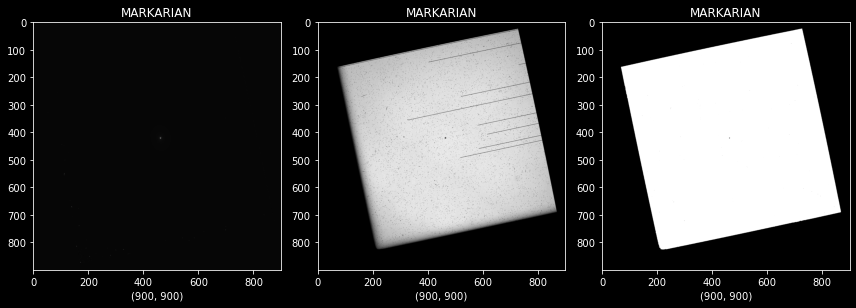

In [76]:
fig,axis=plt.subplots(1,3,figsize=(12,12))
axis[0].set_xlabel(MARKARIAN_IMG_1.shape)
axis[0].set_title("MARKARIAN")
axis[0].imshow(MARKARIAN_IMG_1,cmap="gray")

axis[1].set_xlabel(MARKARIAN_IMG_2.shape)
axis[1].set_title("MARKARIAN")
axis[1].imshow(MARKARIAN_IMG_2,cmap="gray")

axis[2].set_xlabel(MARKARIAN_IMG_3.shape)
axis[2].set_title("MARKARIAN")
axis[2].imshow(MARKARIAN_IMG_3,cmap="gray")

plt.tight_layout()
plt.show()

do the same with all the black holes .

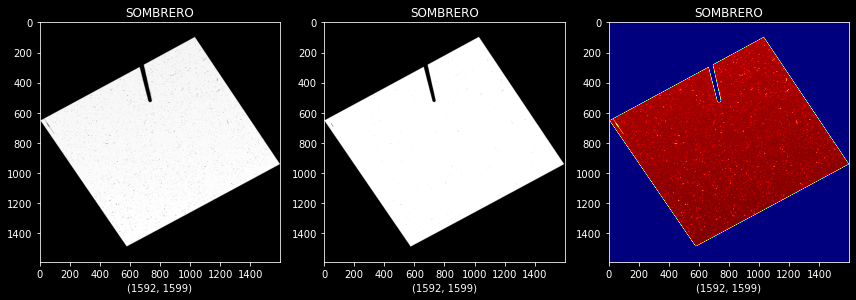

In [77]:
figure,axis = plt.subplots(1,3,figsize=(12,12))

axis[0].set_xlabel(SOMBRERO_IMG_1.shape)
axis[0].set_title("SOMBRERO")
axis[0].imshow(SOMBRERO_IMG_1,cmap="gray")

axis[1].set_xlabel(SOMBRERO_IMG_2.shape)
axis[1].set_title("SOMBRERO")
axis[1].imshow(SOMBRERO_IMG_2,cmap="gray")

axis[2].set_xlabel(SOMBRERO_IMG_3.shape)
axis[2].set_title("SOMBRERO")
axis[2].imshow(SOMBRERO_IMG_3,cmap="jet")

plt.tight_layout()
plt.show()

TARGET IMAGES

In [78]:
Target_img_list=[MARKARIAN_IMG_1,NGC4151_IMG_1,G_3C273_IMG_1,IC1101_IMG_1,OJ287_IMG_1,SOMBRERO_IMG_1,MESSIER106_IMG_1,CENTAURUS_A_IMG_1,H1821_IMG_1,SAGITTARIUS_A_IMG_1]

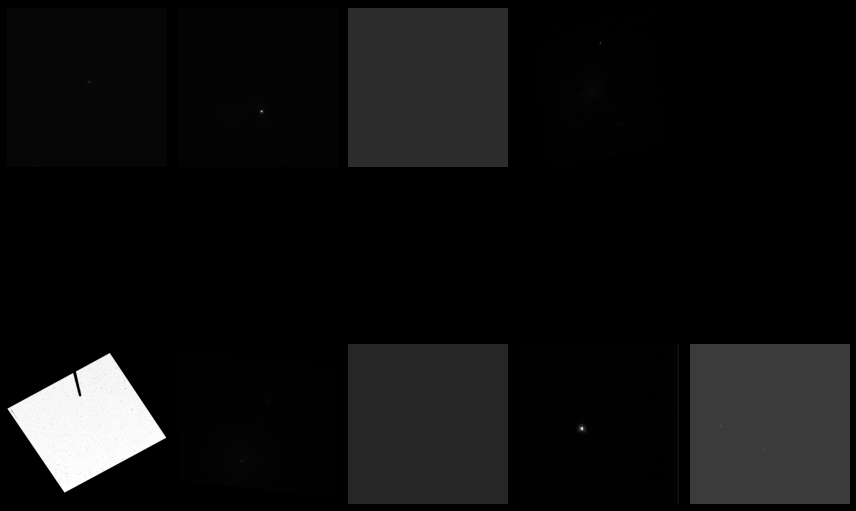

In [79]:
figure,axis=plt.subplots(2,5,figsize=(12,12))
for indexing,operations in enumerate(axis.flat):
    img_picking=Target_img_list[indexing]
    operations.axis("off")
    operations.imshow(img_picking,cmap="gray")
    
plt.tight_layout()
plt.show()

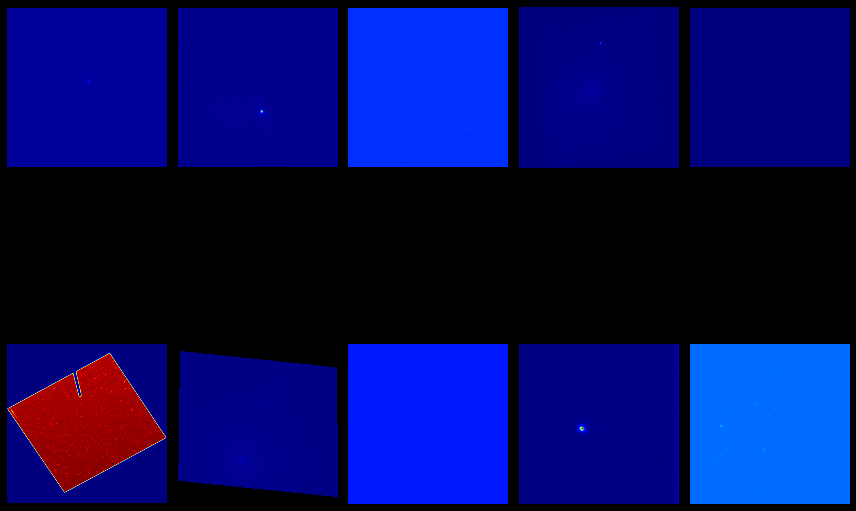

In [80]:
figure,axis=plt.subplots(2,5,figsize=(12,12))
for indexing,operations in enumerate(axis.flat):
    img_picking=Target_img_list[indexing]
    operations.axis("off")
    operations.imshow(img_picking,cmap="jet")
    
plt.tight_layout()
plt.show()

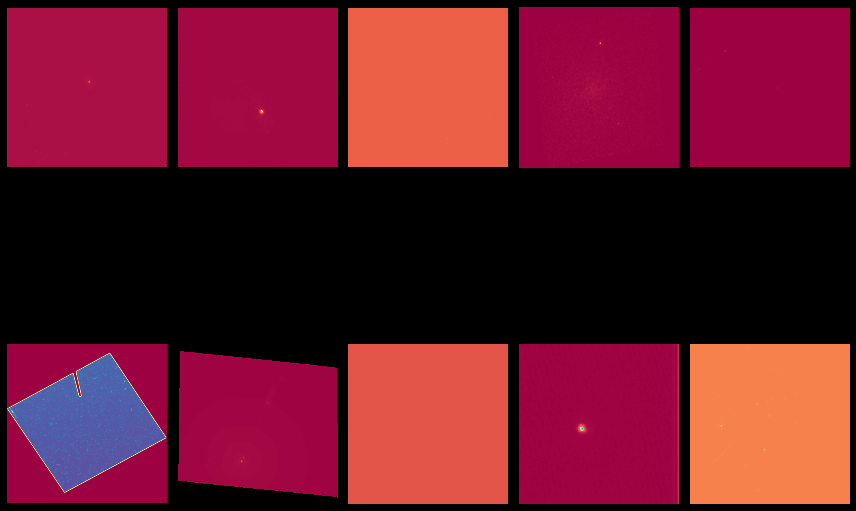

In [81]:
figure,axis=plt.subplots(2,5,figsize=(12,12))
for indexing,operations in enumerate(axis.flat):
    img_picking=Target_img_list[indexing]
    operations.axis("off")
    operations.imshow(img_picking,cmap="Spectral")
    
plt.tight_layout()
plt.show()

we are going to pick SOMBRERO_IMG_1 for advanced computer vision process as an example

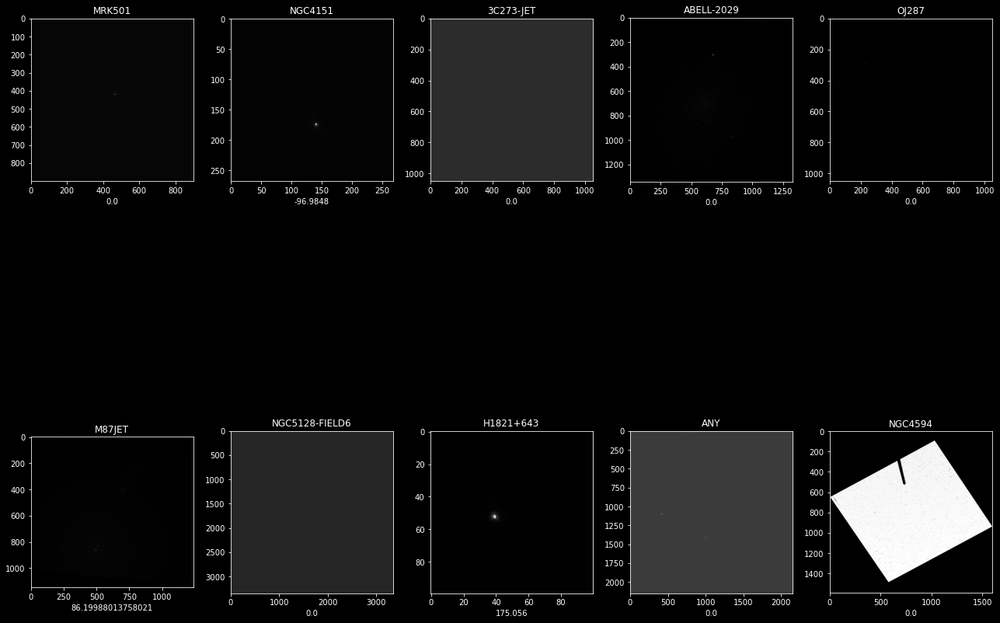

In [82]:
figure,axis=plt.subplots(2,5,figsize=(18,18))
#orientation of the image:ORIENTAT

axis[0][0].set_xlabel(MARKARIAN_Reading[1].header["ORIENTAT"])
axis[0][0].set_title(MARKARIAN_Reading[0].header["TARGNAME"])
axis[0][0].imshow(MARKARIAN_IMG_1,cmap="gray")

axis[0][1].set_xlabel(NGC4151_Reading[0].header["ORIENTAT"])
axis[0][1].set_title(NGC4151_Reading[0].header["TARGNAME"])
axis[0][1].imshow(NGC4151_IMG_1,cmap="gray")

axis[0][2].set_xlabel(G_3C273_Reading[1].header["ORIENTAT"])
axis[0][2].set_title(G_3C273_Reading[0].header["TARGNAME"])
axis[0][2].imshow(G_3C273_IMG_1,cmap="gray")

axis[0][3].set_xlabel(IC1101_Reading[1].header["ORIENTAT"])
axis[0][3].set_title(IC1101_Reading[0].header["TARGNAME"])
axis[0][3].imshow(IC1101_IMG_1,cmap="gray")

axis[0][4].set_xlabel(OJ287_Reading[1].header["ORIENTAT"])
axis[0][4].set_title(OJ287_Reading[0].header["TARGNAME"])
axis[0][4].imshow(OJ287_IMG_1,cmap="gray")

axis[1][0].set_xlabel(MESSIER106_Reading[1].header["ORIENTAT"])
axis[1][0].set_title(MESSIER106_Reading[0].header["TARGNAME"])
axis[1][0].imshow(MESSIER106_IMG_1,cmap="gray")

axis[1][1].set_xlabel(CENTAURUS_A_Reading[1].header["ORIENTAT"])
axis[1][1].set_title(CENTAURUS_A_Reading[0].header["TARGNAME"])
axis[1][1].imshow(CENTAURUS_A_IMG_1,cmap="gray")

axis[1][2].set_xlabel(H1821_Reading[1].header["ORIENTAT"])
axis[1][2].set_title(H1821_Reading[0].header["TARGNAME"])
axis[1][2].imshow(H1821_IMG_1,cmap="gray")

axis[1][3].set_xlabel(SAGITTARIUS_A_Reading[1].header["ORIENTAT"])
axis[1][3].set_title(SAGITTARIUS_A_Reading[0].header["TARGNAME"])
axis[1][3].imshow(SAGITTARIUS_A_IMG_1,cmap="gray")

axis[1][4].set_xlabel(SOMBRERO_Reading[1].header["ORIENTAT"])
axis[1][4].set_title(SOMBRERO_Reading[0].header["TARGNAME"])
axis[1][4].imshow(SOMBRERO_IMG_1,cmap="gray")

plt.tight_layout()
plt.show()

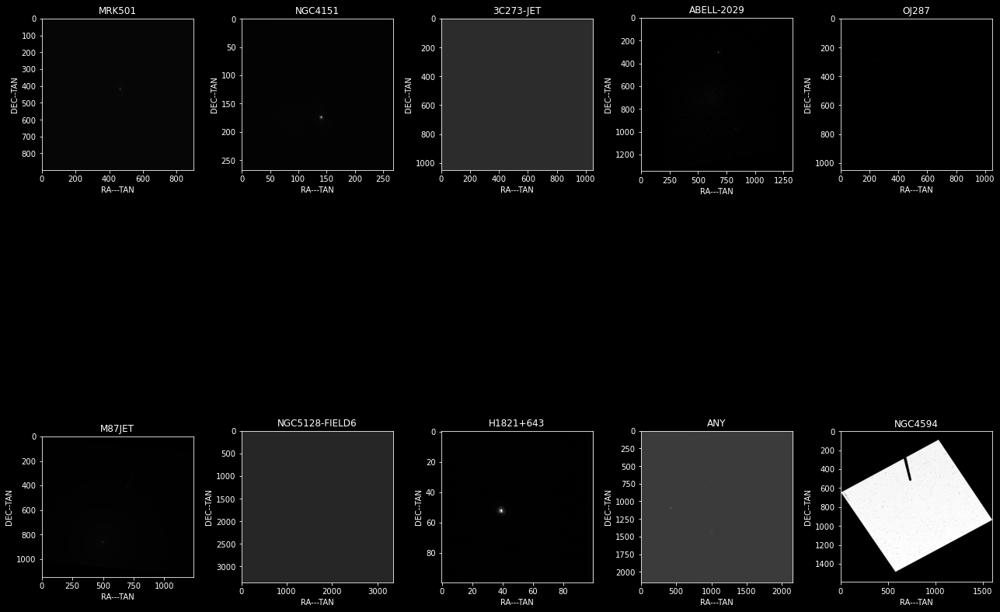

In [83]:
figure,axis=plt.subplots(2,5,figsize=(18,18))
#first coordinate type:CTYPE1
#second coordinate type:CTYPE2

axis[0][0].set_xlabel(MARKARIAN_Reading[1].header["CTYPE1"])
axis[0][0].set_ylabel(MARKARIAN_Reading[1].header["CTYPE2"])
axis[0][0].set_title(MARKARIAN_Reading[0].header["TARGNAME"])
axis[0][0].imshow(MARKARIAN_IMG_1,cmap="gray")

axis[0][1].set_xlabel(NGC4151_Reading[1].header["CTYPE1"])
axis[0][1].set_ylabel(NGC4151_Reading[1].header["CTYPE2"])
axis[0][1].set_title(NGC4151_Reading[0].header["TARGNAME"])
axis[0][1].imshow(NGC4151_IMG_1,cmap="gray")

axis[0][2].set_xlabel(G_3C273_Reading[1].header["CTYPE1"])
axis[0][2].set_ylabel(G_3C273_Reading[1].header["CTYPE2"])
axis[0][2].set_title(G_3C273_Reading[0].header["TARGNAME"])
axis[0][2].imshow(G_3C273_IMG_1,cmap="gray")

axis[0][3].set_xlabel(IC1101_Reading[1].header["CTYPE1"])
axis[0][3].set_ylabel(IC1101_Reading[1].header["CTYPE2"])
axis[0][3].set_title(IC1101_Reading[0].header["TARGNAME"])
axis[0][3].imshow(IC1101_IMG_1,cmap="gray")

axis[0][4].set_xlabel(OJ287_Reading[1].header["CTYPE1"])
axis[0][4].set_ylabel(OJ287_Reading[1].header["CTYPE2"])
axis[0][4].set_title(OJ287_Reading[0].header["TARGNAME"])
axis[0][4].imshow(OJ287_IMG_1,cmap="gray")

axis[1][0].set_xlabel(MESSIER106_Reading[1].header["CTYPE1"])
axis[1][0].set_ylabel(MESSIER106_Reading[1].header["CTYPE2"])
axis[1][0].set_title(MESSIER106_Reading[0].header["TARGNAME"])
axis[1][0].imshow(MESSIER106_IMG_1,cmap="gray")

axis[1][1].set_xlabel(CENTAURUS_A_Reading[1].header["CTYPE1"])
axis[1][1].set_ylabel(CENTAURUS_A_Reading[1].header["CTYPE2"])
axis[1][1].set_title(CENTAURUS_A_Reading[0].header["TARGNAME"])
axis[1][1].imshow(CENTAURUS_A_IMG_1,cmap="gray")

axis[1][2].set_xlabel(H1821_Reading[1].header["CTYPE1"])
axis[1][2].set_ylabel(H1821_Reading[1].header["CTYPE2"])
axis[1][2].set_title(H1821_Reading[0].header["TARGNAME"])
axis[1][2].imshow(H1821_IMG_1,cmap="gray")

axis[1][3].set_xlabel(SAGITTARIUS_A_Reading[1].header["CTYPE1"])
axis[1][3].set_ylabel(SAGITTARIUS_A_Reading[1].header["CTYPE2"])
axis[1][3].set_title(SAGITTARIUS_A_Reading[0].header["TARGNAME"])
axis[1][3].imshow(SAGITTARIUS_A_IMG_1,cmap="gray")

axis[1][4].set_xlabel(SOMBRERO_Reading[1].header["CTYPE1"])
axis[1][4].set_ylabel(SOMBRERO_Reading[1].header["CTYPE2"])
axis[1][4].set_title(SOMBRERO_Reading[0].header["TARGNAME"])
axis[1][4].imshow(SOMBRERO_IMG_1,cmap="gray")

plt.tight_layout()
plt.show()

In [84]:
DISTANCE_FROM_EARTH=31*10**6+10*10**4
one_light_year_as_km=9.46*10**12

LIGHT INTENSITY

In [85]:
SOMBRERO_Light_Intensity=1/DISTANCE_FROM_EARTH**2
print("light intensity:",format(SOMBRERO_Light_Intensity,'.17f'))

#it is far away

light intensity: 0.00000000000000103


In [86]:
#parallax

SOMBRERO_Parallax=1/DISTANCE_FROM_EARTH
print("parallax(arcseconds):",format(SOMBRERO_Parallax,'.17f'))

parallax(arcseconds): 0.00000003215434084


HUBBLE'S LAW
Hubble constant, in cosmology, constant of proportionality in the relation between the velocities of remote galaxies and their distances. It expresses the rate at which the universe is expanding. It is denoted by the symbol H0, where the subscript denotes that the value is measured at the present time, and named in honour of Edwin Hubble, the American astronomer who attempted in 1929 to measure its value. With redshifts of distant galaxies measured by Vesto Slipher, also of the United States, and with his own distance estimates of these galaxies, Hubble established the cosmological velocity-distance law:
velocity = H0 × distance.

Hubble’s original value for H0 was 500 km (311 miles) per second per megaparsec (one megaparsec is 3,260,000 light-years). Modern estimates, using measurements of the cosmic microwave background radiation left over from the big bang, place the value of H0 at about 67 km (42 miles) per second per megaparsec. The reciprocal of the Hubble constant lies between 13 billion and 14 billion years, and this cosmic timescale serves as an approximate measure of the age of the universe.

According to Hubble's estimation, a galaxy 1 million light-years away from us is moving away from our galaxy at about 501 km per second.

In [87]:
divergence_velocity=501*DISTANCE_FROM_EARTH
divergence_velocity_for_light_year=divergence_velocity/one_light_year_as_km
print("velocity(km):",divergence_velocity)
print("velocity-light year:",divergence_velocity_for_light_year)

velocity(km): 15581100000
velocity-light year: 0.0016470507399577168


In [88]:
#checking informations

for x_keys in SOMBRERO_Reading_keys:
    if x_keys!=" ":
        print(x_keys)
        print(SOMBRERO_Comments_img.comments[x_keys])
        print(SOMBRERO_Reading[1].header[x_keys])
        print("\n")

XTENSION
Image extension
IMAGE


BITPIX
array data type
-32


NAXIS
number of array dimensions
2


NAXIS1

1599


NAXIS2

1592


PCOUNT
number of parameters
0


GCOUNT
number of groups
1


INHERIT
inherit the primary header
True


EXTNAME
extension name
SCI


EXTVER

1


BUNIT
Units of science product
ELECTRONS/S





      / World Coordinate System and Related Parameters


      / READOUT DEFINITION PARAMETERS


      / PHOTOMETRY KEYWORDS


      / REPEATED EXPOSURES INFO


      / DATA PACKET INFORMATION


      / IMAGE STATISTICS AND DATA QUALITY FLAGS



CD1_1

-6.9444444444444e-06


CD1_2

4.89005649942071e-36


CD2_1

1.88079096131566e-37


CD2_2

6.94444444444448e-06


CRVAL1

189.9976207064736


CRVAL2

-11.62307897475261


CRPIX1

799.9999999999949


CRPIX2

796.4999999999949


CTYPE1

RA---TAN


CTYPE2

DEC--TAN


ORIENTAT

0.0


VAFACTOR

1.0





      / World Coordinate System and Related Parameters


      / READOUT DEFINITION PARAMETERS


      / PHOTOMETRY KEYWORDS


 

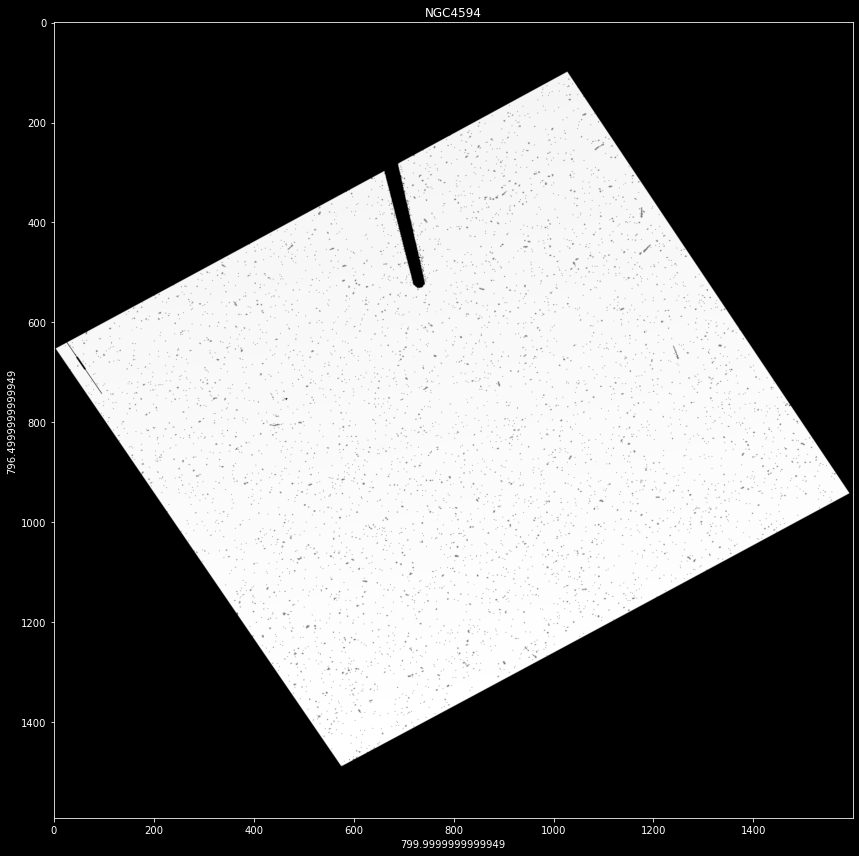

In [89]:
#general vision

figure=plt.figure(figsize=(12,12))
# x-coordinate of reference pixel : CRPIX1
# y-coordinate of reference pixel : CRPIX2

plt.imshow(SOMBRERO_IMG_1,cmap="gray")
plt.xlabel(SOMBRERO_Reading[1].header["CRPIX1"])
plt.ylabel(SOMBRERO_Reading[1].header["CRPIX2"])
plt.title(SOMBRERO_Reading[0].header["TARGNAME"])

plt.tight_layout()
plt.show()


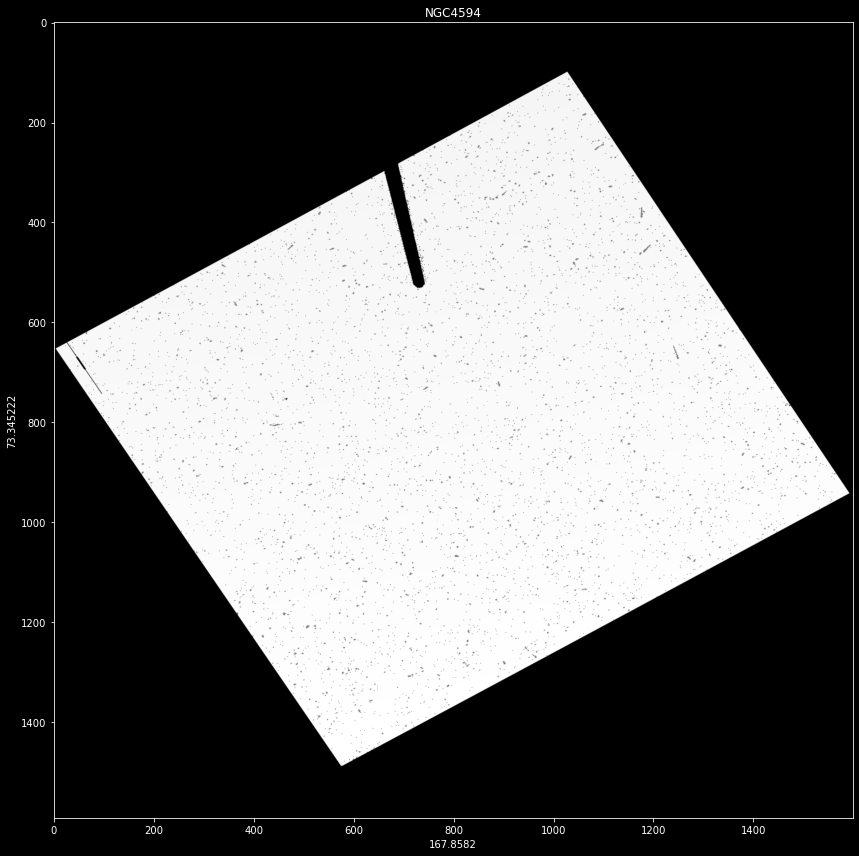

In [90]:
figure = plt.figure(figsize=(12,12))

# angle between sun and V1 axis : SUNANGLE
# angle between moon and V1 axis : MOONANGL

plt.imshow(SOMBRERO_IMG_1,cmap="gray")
plt.xlabel(SOMBRERO_Reading[0].header["SUNANGLE"])
plt.ylabel(SOMBRERO_Reading[0].header["MOONANGL"])
plt.title(SOMBRERO_Reading[0].header["TARGNAME"])

plt.tight_layout()
plt.show()

In [91]:
#CSV

NGC4594_CSV=pd.read_csv("./SOMBRERO_DATA.csv")

In [92]:
NGC4594_CSV

,Unnamed: 0,index,Fits standard,Bits per pixel,Number of axes,File may contain extensions,FITS file originator,Date FITS file was generated,Time of last modification,Unnamed: 9,...,"Drizzle, fill value for zero weight output pix",Input image WCS Version used,"Drizzle, units of output image - counts or cps","Drizzle, form of weight distribution kernel","Drizzle, source of geometric information","Drizzle, default IDCTAB pixel size(arcsec)","Drizzle, linear size of drop","Drizzle, input data image","Drizzle, input image exposure time (s)",position angle of V3-axis of HST (deg)
0,0,Fits standard,True,16,0,True,NOAO-IRAF FITS Image Kernel July 2003,2017-08-19,2017-08-19T15:13:20,\n\n / DATA DESCRIPTION KEYWORDS\n\n\n ...,...,INDEF,NaN,cps,square,wcs,0.025,1.0,"j8ff14dpq_flt.fits[sci,1]",150.0,145.814606


In [93]:
NGC4594_CSV.columns[:100]

Index(['Unnamed: 0', 'index', 'Fits standard', 'Bits per pixel',
       'Number of axes', 'File may contain extensions', 'FITS file originator',
       'Date FITS file was generated', 'Time of last modification',
       'Unnamed: 9', 'telescope used to acquire data',
       'identifier for instrument used to acquire data',
       'type of exposure identifier', 'instrument designated as prime',
       'proposer's target name', 'PEP proposal identifier',
       'angle between sun and V1 axis', 'angle between moon and V1 axis',
       'altitude of the sun above Earth's limb',
       'commanded FGS lock (FINE,COARSE,GYROS,UNKNOWN)',
       'number of gyros scheduled, T=3+OBAD',
       'UT date of start of observation (yyyy-mm-dd)',
       'exposure start time (Modified Julian Date)',
       'exposure end time (Modified Julian Date)',
       'exposure duration (seconds)--calculated',
       'Exposure interruption indicator', 'fiducial pixel dark time (secs)',
       'POSTARG in axis 1 direc

In [94]:
NGC4594_CSV.columns[99:]

Index(['position number of this point in the pattern',
       'Exposure time in seconds: 0.1 to 409.5',
       'Post flash current: OFF, LOW, MED, HIGH',
       'Status: SUCCESSFUL, ABORTED, NOT PERFORMED',
       'Shutter position: A or B', 'commanded gain of CCD',
       'commanded CCD bias offset for amplifier A',
       'commanded CCD bias offset for amplifier B',
       'commanded CCD bias offset for amplifier C',
       'commanded CCD bias offset for amplifier D',
       'calibrated gain for amplifier A', 'calibrated gain for amplifier B',
       'calibrated gain for amplifier C', 'calibrated gain for amplifier D',
       'calibrated read noise for amplifier A',
       'calibrated read noise for amplifier B',
       'calibrated read noise for amplifier C',
       'calibrated read noise for amplifier D',
       'Version of STWCS used to updated the WCS',
       'Version of PYWCS used to updated the WCS',
       'Version ID for header kw rules file',
       'Version of blendheader 

COORDINATE

The Earth is on the galactic plane, so we are at 0 latitude. Instead of going from 0 to 180 east and 180 west, galactic coordinates simply go from 0 to 360. There is no east/west or plus/minus in galactic longitude coordinates. 360 is the same as 2 x 180, or 180 is half of 360

Text(0.5, 1.0, 'POSITION')

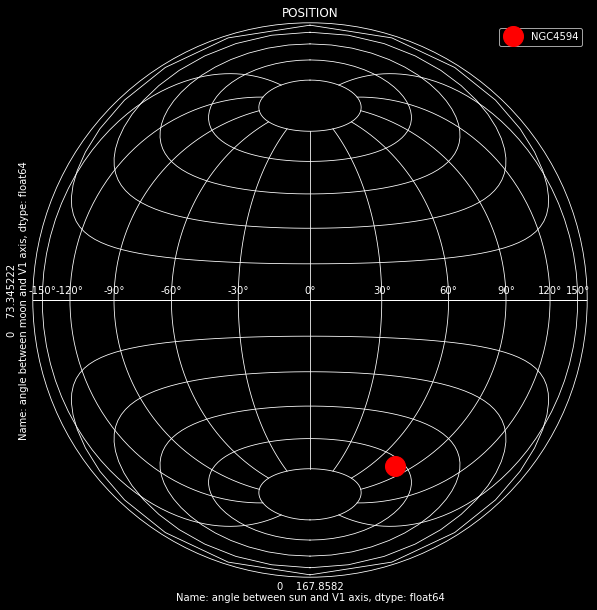

In [95]:
plt.figure(figsize=(25,8))
plt.subplot(projection="lambert")
plt.grid(True)

plt.plot(NGC4594_CSV["angle between sun and V1 axis"],NGC4594_CSV["angle between moon and V1 axis"],color="red",marker='o',linestyle='None',markersize=20,label=SOMBRERO_Reading[0].header["TARGNAME"])
plt.tight_layout()
plt.xlabel(str(NGC4594_CSV["angle between sun and V1 axis"]))
plt.ylabel(str(NGC4594_CSV["angle between moon and V1 axis"]))
plt.legend(prop=dict(size=10))
plt.title("POSITION")

In [96]:
Greenwich_Lat=51.4934
Greenwich_Long=0.0098

Text(0.5, 1.0, 'POSITION')

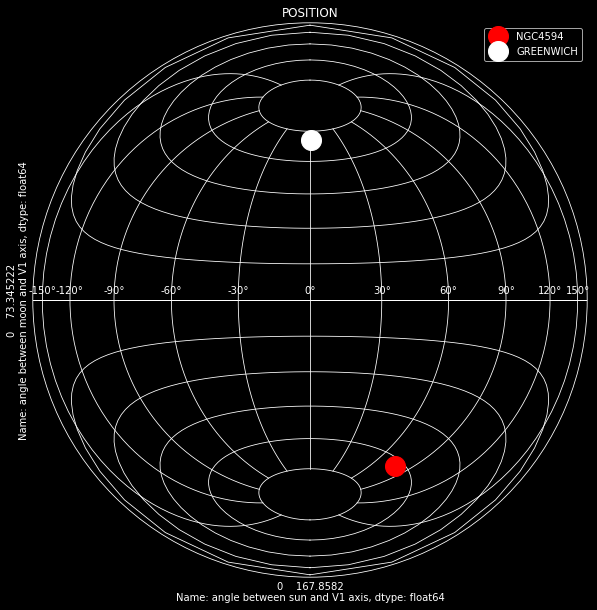

In [97]:
plt.figure(figsize=(25,8))
plt.subplot(projection="lambert")
plt.grid(True)
plt.plot(NGC4594_CSV["angle between sun and V1 axis"],NGC4594_CSV["angle between moon and V1 axis"],color="red",marker='o',linestyle='None',markersize=20,label=SOMBRERO_Reading[0].header["TARGNAME"])
plt.plot(Greenwich_Long,Greenwich_Lat,color="white",marker='o',linestyle='None',markersize=20,label="GREENWICH")
plt.tight_layout()
plt.xlabel(str(NGC4594_CSV["angle between sun and V1 axis"]))
plt.ylabel(str(NGC4594_CSV["angle between moon and V1 axis"]))
plt.legend(prop=dict(size=10))
plt.title("POSITION")

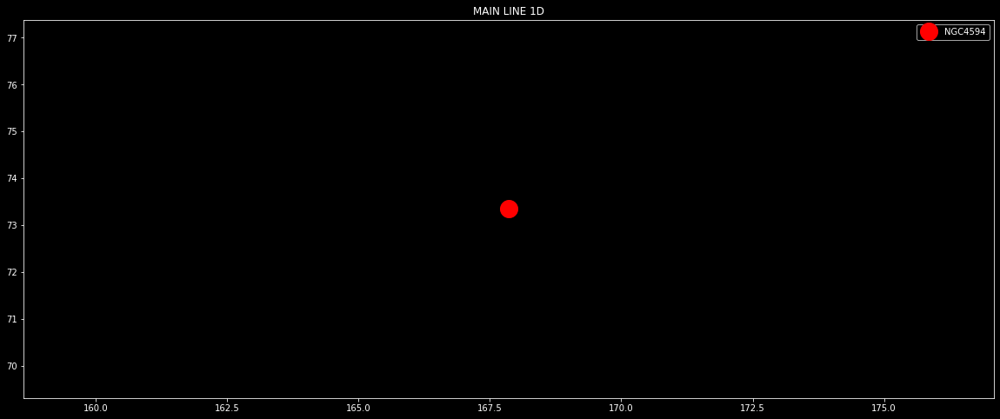

In [98]:
plt.figure(figsize=(20,8))
plt.plot(NGC4594_CSV["angle between sun and V1 axis"],NGC4594_CSV["angle between moon and V1 axis"],color="red",marker='o',linestyle='None',markersize=20,label=SOMBRERO_Reading[0].header["TARGNAME"])
plt.title("MAIN LINE 1D")
plt.legend(prop=dict(size=10))
plt.show()

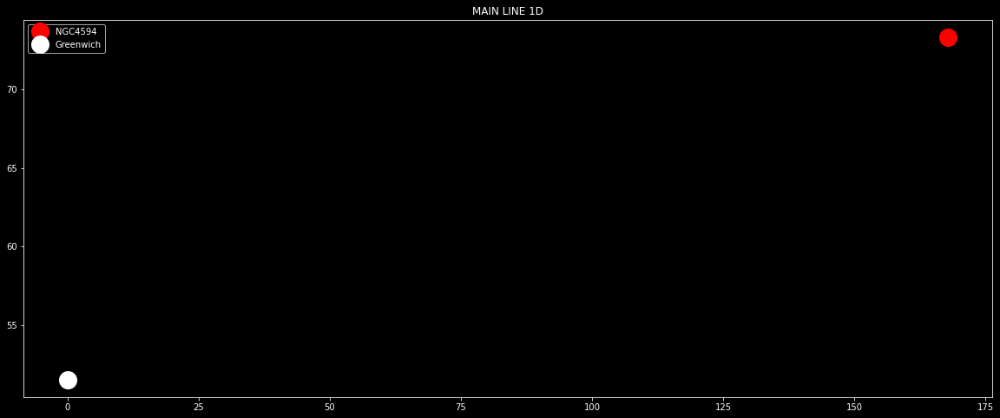

In [99]:
plt.figure(figsize=(20,8))
plt.plot(NGC4594_CSV["angle between sun and V1 axis"],NGC4594_CSV["angle between moon and V1 axis"],color="red",marker='o',linestyle='None',markersize=20,label=SOMBRERO_Reading[0].header["TARGNAME"])
plt.plot(Greenwich_Long,Greenwich_Lat,color="white",marker='o',linestyle='None',markersize=20,label="Greenwich")
plt.title("MAIN LINE 1D")
plt.legend(prop=dict(size=10))
plt.show()

In [100]:
x1,y1=[NGC4594_CSV["angle between sun and V1 axis"],Greenwich_Long],[NGC4594_CSV["angle between moon and V1 axis"],Greenwich_Lat]

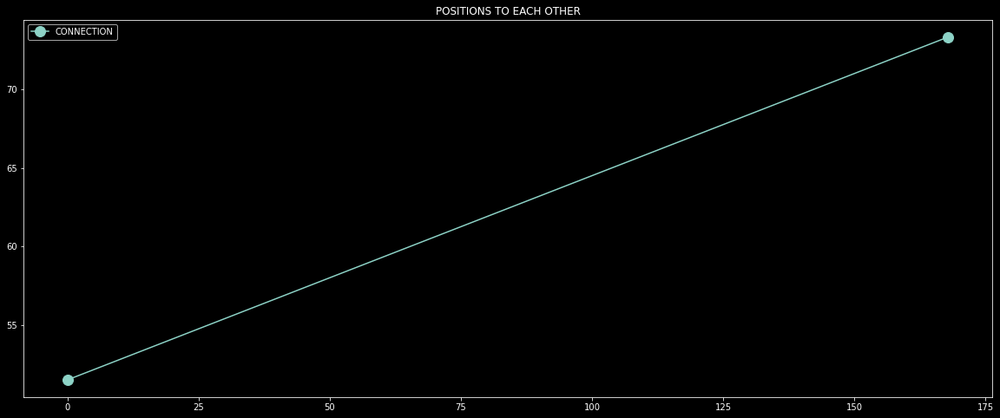

In [101]:
plt.figure(figsize=(20,8))
plt.plot(x1,y1,marker='o',markersize=12,label="CONNECTION")
plt.title("POSITIONS TO EACH OTHER")
plt.legend(prop=dict(size=10))
plt.show()

 THRESHOLD
 

(-0.5, 1598.5, 1591.5, -0.5)

C:\Users\91810\anaconda3\lib\site-packages\matplotlib\image.py:479: RuntimeWarning: invalid value encountered in subtract
  A_scaled -= a_min


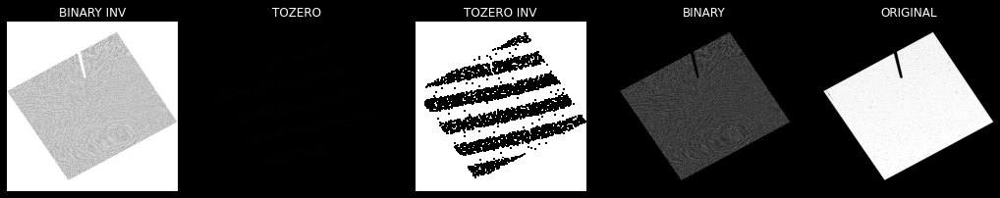

In [102]:
figure,axis=plt.subplots(1,5,figsize=(18,18))
_,Threshold_TOZERO=cv2.threshold(SOMBRERO_IMG_1,200,255,cv2.THRESH_TOZERO)
_,Thershold_TOZERO_INV=cv2.threshold(SOMBRERO_IMG_1,200,255,cv2.THRESH_TOZERO_INV)
_,Threshold_BINARY=cv2.threshold(SOMBRERO_IMG_1,200,255,cv2.THRESH_BINARY)
_,Threshold_BINARY_INV=cv2.threshold(SOMBRERO_IMG_1,200,255,cv2.THRESH_BINARY_INV)

axis[0].set_title("BINARY INV")
axis[0].imshow(Threshold_BINARY_INV,cmap="gray")
axis[0].axis("off")

axis[1].set_title("TOZERO")
axis[1].imshow(Threshold_TOZERO,cmap="gray")
axis[1].axis("off")

axis[2].set_title("TOZERO INV")
axis[2].imshow(Thershold_TOZERO_INV,cmap="gray")
axis[2].axis("off")

axis[3].set_title("BINARY")
axis[3].imshow(Threshold_BINARY,cmap="gray")
axis[3].axis("off")

axis[4].set_title("ORIGINAL")
axis[4].imshow(SOMBRERO_IMG_1,cmap="gray")
axis[4].axis("off")

error: OpenCV(4.6.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\thresh.cpp:1555: error: (-2:Unspecified error) in function 'double __cdecl cv::threshold(const class cv::_InputArray &,const class cv::_OutputArray &,double,double,int)'
> THRESH_OTSU mode:
>     'src_type == CV_8UC1 || src_type == CV_16UC1'
> where
>     'src_type' is 5 (CV_32FC1)


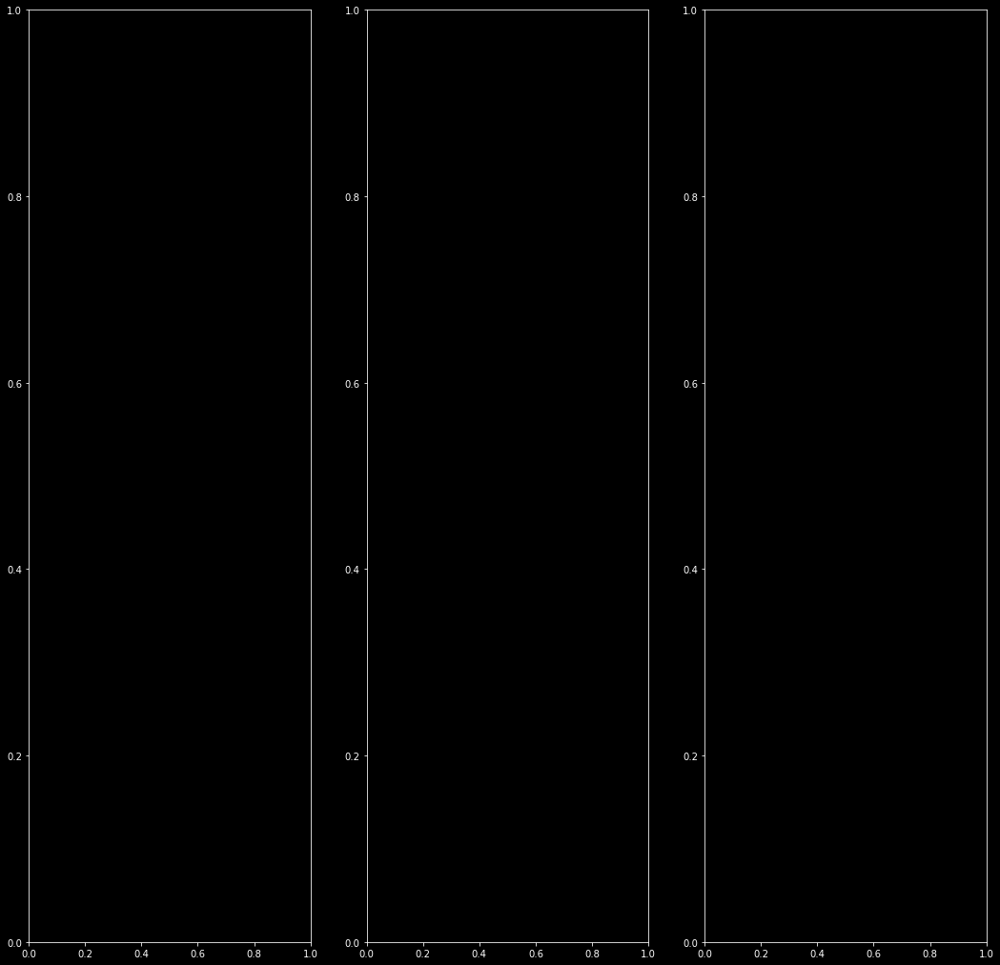

In [92]:
figure,axis=plt.subplots(1,3,figsize=(18,18))
_,Threshold_IMG_OTSU = cv2.threshold(SOMBRERO_IMG_1,220,255,cv2.THRESH_OTSU)
_,Threshold_IMG_TRUNC = cv2.threshold(SOMBRERO_IMG_1,220,255,cv2.THRESH_TRUNC)

axis[0].set_title("OTSU")
axis[0].imshow(Threshold_IMG_OTSU,cmap="gray")
axis[0].axis("off")

axis[1].set_title("TRUNC")
axis[1].imshow(Threshold_IMG_TRUNC,cmap="gray")
axis[1].axis("off")

axis[2].set_title("ORIGINAL")
axis[2].imshow(SOMBRERO_IMG_1,cmap="gray")
axis[2].axis("off")

(-0.5, 1598.5, 1591.5, -0.5)

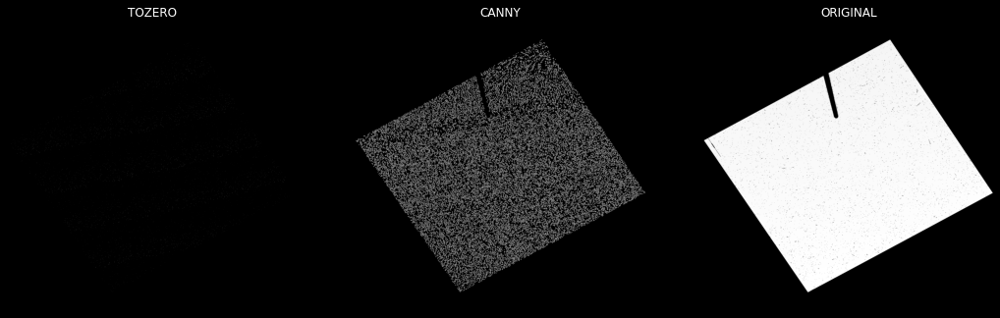

In [103]:
figure,axis = plt.subplots(1,3,figsize=(18,18))

_,Threshold_TOZERO = cv2.threshold(SOMBRERO_IMG_1,200,255,cv2.THRESH_TOZERO)
Canny_IMG = cv2.Canny(Threshold_TOZERO.astype(np.uint8),10,150)

axis[0].set_title("TOZERO")
axis[0].imshow(Threshold_TOZERO,cmap="gray")
axis[0].axis("off")

axis[1].set_title("CANNY")
axis[1].imshow(Canny_IMG,cmap="gray")
axis[1].axis("off")

axis[2].set_title("ORIGINAL")
axis[2].imshow(SOMBRERO_IMG_1,cmap="gray")
axis[2].axis("off")

(-0.5, 1598.5, 1591.5, -0.5)

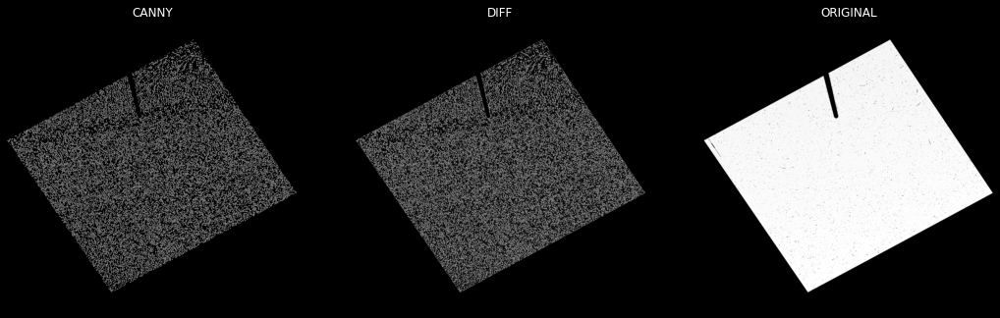

In [104]:
#canny

figure,axis=plt.subplots(1,3,figsize=(18,18))
_,threshold_TOZERO=cv2.threshold(SOMBRERO_IMG_1,200,255,cv2.THRESH_TOZERO)
Canny_IMG=cv2.Canny(Threshold_TOZERO.astype(np.uint8),10,150)
Diff_IMG=cv2.absdiff(SOMBRERO_IMG_1.astype(np.uint8),Canny_IMG)

axis[0].set_title("CANNY")
axis[0].imshow(Canny_IMG,cmap="gray")
axis[0].axis("off")

axis[1].set_title("DIFF")
axis[1].imshow(Diff_IMG,cmap="gray")
axis[1].axis("off")

axis[2].set_title("ORIGINAL")
axis[2].imshow(SOMBRERO_IMG_1,cmap="gray")
axis[2].axis("off")

(-0.5, 1598.5, 1591.5, -0.5)

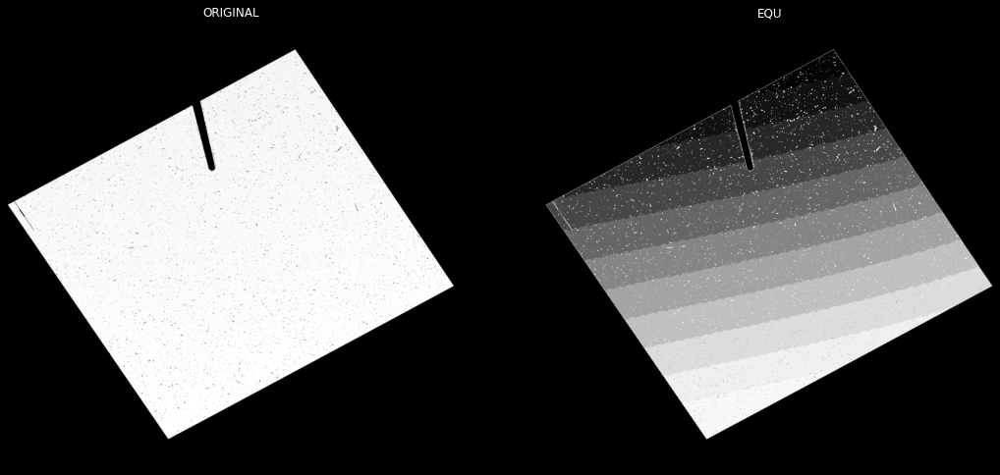

In [105]:
#EQUALIZING HISTOGRAM

figure,axis=plt.subplots(1,2,figsize=(18,18))
Equalize_IMG = cv2.equalizeHist(SOMBRERO_IMG_1.astype(np.uint8))

axis[0].set_title("ORIGINAL")
axis[0].imshow(SOMBRERO_IMG_1,cmap="gray")
axis[0].axis("off")

axis[1].set_title("EQU")
axis[1].imshow(Equalize_IMG,cmap="gray")
axis[1].axis("off")

(-0.5, 1598.5, 1591.5, -0.5)

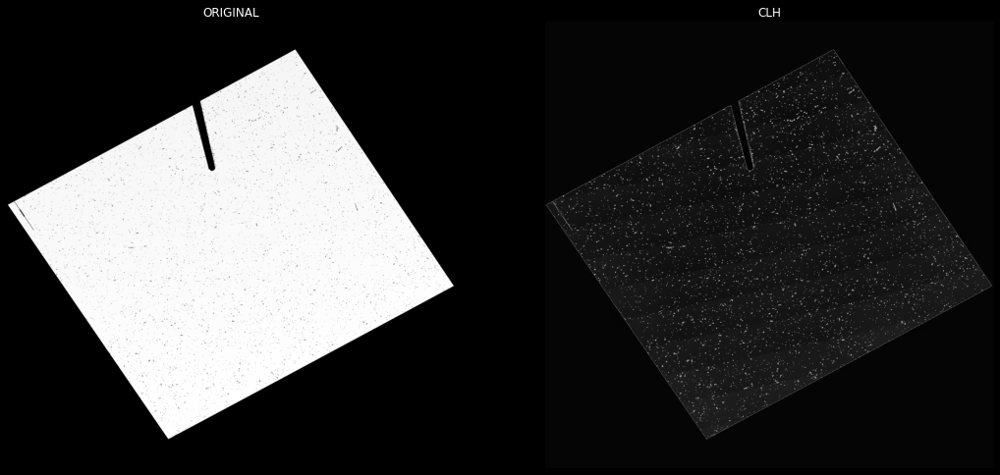

In [106]:
# CLACHE PROCESS

figure,axis=plt.subplots(1,2,figsize=(18,18))
Clahe_Func=cv2.createCLAHE(clipLimit=5.0,tileGridSize=(12,12))
Clahe_IMG=Clahe_Func.apply(SOMBRERO_IMG_1.astype(np.uint8))

axis[0].set_title("ORIGINAL")
axis[0].imshow(SOMBRERO_IMG_1,cmap="gray")
axis[0].axis("off")

axis[1].set_title("CLH")
axis[1].imshow(Clahe_IMG,cmap="gray")
axis[1].axis("off")


AttributeError: module 'cv2' has no attribute 'findCountours'

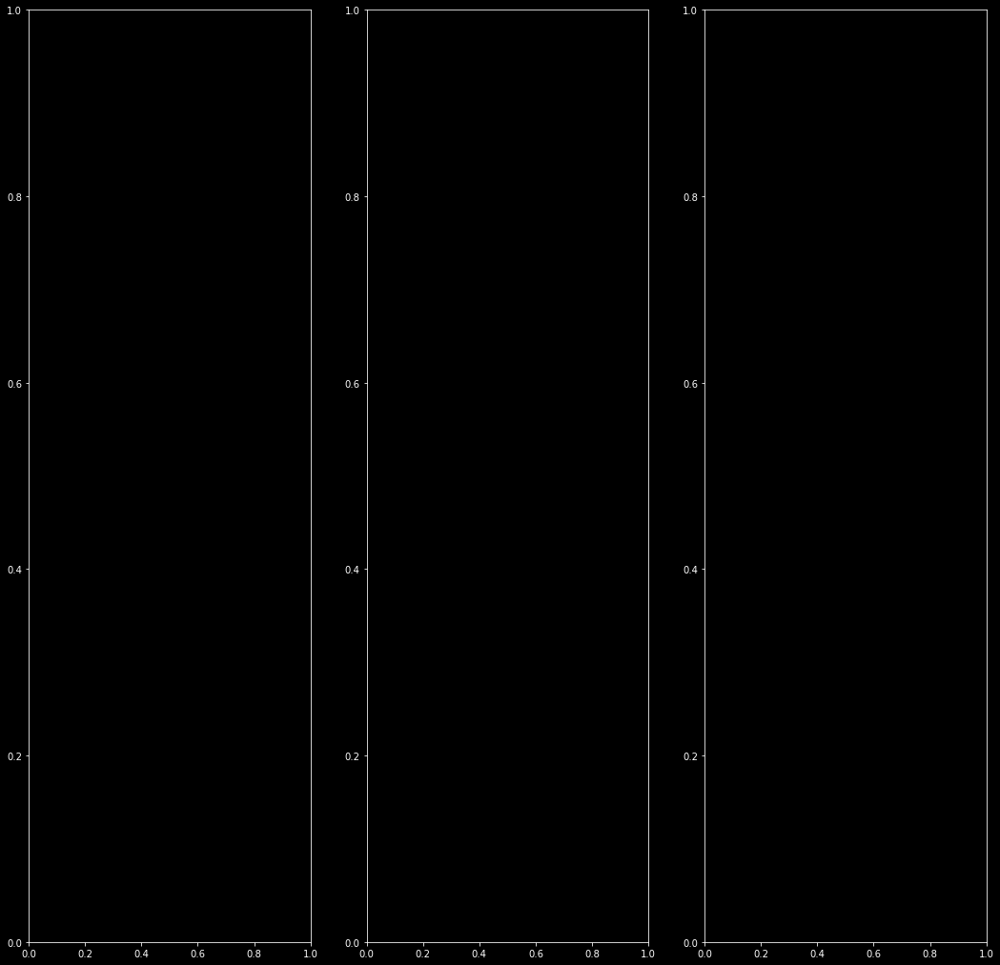

In [107]:
#POLY 2D

figure,axis=plt.subplots(1,3,figsize=(18,18))
_,Threshold_TOZERO=cv2.threshold(SOMBRERO_IMG_1,200,255,cv2.THRESH_TOZERO)
Contours,_=cv2.findCountours(Threshold_TOZERO.astype(np.uint8),cv2.RETE_TREE,cv2.CHAIN_APPROX_SIMPLE)

Main_Copy=SOMBRERO_IMG_1.copy()
for cnt in Contours :
    approx=cv2.approxPolyDP(cnt,0.09*cv2.arclength(cnt,True),True)
    Draw_Func = cv2.drawContours(SOMBRERO_IMG_1.astype(np.uint8),[approx],0,(255,0,0),10)
    Counting_Approx=approx.ravel()
    i=0
    for j in Counting_Approx:
        if(i%2==0):
            x=Counting_Approx[i]
            y=Counting_Approx[i+1]
            string_coor=str(x)+" "+str(y)
            if(i==0):
                cv2.putText(Main_copy,f"{x},{y}",(x,y),cv2.FONT_HERSHEY_COMPLEX,0.5,(0,0,255))
                i=i+1
        
        
axis[0].set_title("TOZERO")
axis[0].imshow(Threshold_TOZERO,cmap="gray")
axis[0].axis("off")

axis[1].set_title("POLY_2D")
axis[1].imshow(Draw_Func,cmap="hot")
axis[1].axis("off")

axis[2].set_title("ORIGINAL")
axis[2].imshow(Main_Copy,cmap="gray")
axis[2].axis("off")
                